# MIT License

Copyright (c) 2023 Sameer Sanjay Nimse

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.



# **Data Science Engineering Methods And Tools**
ML Data Cleaning and Feature Selection

**Abstract:** In this project I have used body building supplement and Nutrition products dataset. Th main goal is to predict the price per serving of the supplement.

**Aim**
The purpose of this assignment is to interpret the following:

* Linear Model
* Tree Based Model
* Best model of AutoML H2O

During this exercise, I used:
* SHAP analysis
* LIME analysis
* Partial Dependence Plot Analysis

# Data Set
The data set consists of :

14 physical characteristics i.e. average flavor rating, brand name, link, number of flavors, number of reviews, overall rating, price, product category, product_description, product name top flavor rated, verified buyer number, verified buyer rating - The independent variables

Price per serving- The target variable There are a total of 840 rows and 14 columns

### Variable Description:

**average_flavor_rating**: The average of the flavor rated by the user

**brand_name**           : The name of the brand

**link**                 : The link of the product

**number_of_flavors**    : The total number of flavors that brand has

**number_of_reviews**    : The total number of reviews for a product

**overall_rating**       : The overall rating of the product

**price**                : The actual price of the product

**price_per_serving**    : The cost of the supplement per serving

**product_category**     : The category of the supplement

**product_description**   : The description of the product

**product_name**          : The name of the product

**top_flavor_rated**      : Top flavor of a particular supplement

**verified_buyer_number** : The number of the verified buyer

**verified_buyer_rating** : The rating of the verified buyer

## **What is the question ?**

* The protein supplement dataset is a collection of information about various nutrition supplements that are used to provide protein to individuals. The main goal of the dataset is to predict the price per serving of a protein supplement based on important features like the supplement's price, number of flavors, and average flavor rating. The dataset consists of multiple columns, including the name of the supplement, the manufacturer, the price, the number of servings per container, the number of flavors available, and the average flavor rating.

* The target variable in this dataset is the price per serving of the protein supplement, which is represented as a continuous float value. The range of the price per serving is between 0.22 and 7.99, with 7.99 being the highest and 0.22 being the lowest.

* This dataset presents a regression problem where the aim is to build a predictive model that can accurately estimate the price per serving of a protein supplement given the other variables in the dataset. The model can be trained on a portion of the data and tested on the remaining portion to evaluate its performance. The performance of the model can be measured using metrics such as mean squared error, mean absolute error, or R-squared.



## Importing libraries

In [1]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install sklearn
!pip install -U scikit-learn --user
!pip install pydot
!pip install graphviz
!pip install datasist
!pip install fitter

# Importing all the libararies required for the assignment

import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from fitter import Fitter, get_common_distributions, get_distributions
from sklearn.inspection import PartialDependenceDisplay
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE
from sklearn.impute import KNNImputer
# Model Interpretation
!pip install shap
import shap
from sklearn.model_selection import train_test_split


plt.rcParams["figure.figsize"] = (18, 10)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in

In [2]:
pandas_df = pd.read_csv("https://raw.githubusercontent.com/sameernimse09/Data-Science/main/bodybuilding_nutrition_products.csv")
 # Reading CSV file into Pandas DataFrame

# **Exploratory Data Analysis**

In [3]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  387 non-null    float64
 1   brand_name             840 non-null    object 
 2   link                   840 non-null    object 
 3   number_of_flavors      381 non-null    float64
 4   number_of_reviews      821 non-null    float64
 5   overall_rating         821 non-null    float64
 6   price                  840 non-null    float64
 7   price_per_serving      840 non-null    float64
 8   product_category       669 non-null    object 
 9   product_description    840 non-null    object 
 10  product_name           840 non-null    object 
 11  top_flavor_rated       381 non-null    object 
 12  verified_buyer_number  509 non-null    object 
 13  verified_buyer_rating  509 non-null    float64
dtypes: float64(7), object(7)
memory usage: 92.0+ KB


In [4]:
pandas_df['verified_buyer_number'] = pandas_df['verified_buyer_number'].str.replace('Flavors','')
pandas_df['verified_buyer_number'] = pandas_df['verified_buyer_number'].astype(float)

In [5]:
pandas_df.isnull().sum()
# Checking for any null values in the dataset

average_flavor_rating    453
brand_name                 0
link                       0
number_of_flavors        459
number_of_reviews         19
overall_rating            19
price                      0
price_per_serving          0
product_category         171
product_description        0
product_name               0
top_flavor_rated         459
verified_buyer_number    331
verified_buyer_rating    331
dtype: int64

In [6]:
pandas_df.shape  # Shape of the dataframe - Here, we have 840 samples of data

(840, 14)

In [7]:
pandas_df.head()  # Sample of how our data looks

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.1,EVLUTION NUTRITION,https://sa.bodybuilding.com/store/evlution-nut...,29.0,2575.0,9.4,19.99,0.67,BCAAs,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.4,Optimum Nutrition,https://sa.bodybuilding.com/store/opt/whey.htm...,43.0,9926.0,9.3,57.99,0.79,Build Muscle Products,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.3,JYM Supplement Science,https://sa.bodybuilding.com/store/jym/pre-jym....,9.0,3947.0,9.1,48.99,1.63,Improve Workout Products,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,NaN,Optimum Nutrition,https://sa.bodybuilding.com/store/opt/essentia...,NaN,2466.0,9.1,18.99,0.63,Amino Acids,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,NaN,NaN,NaN
4,8.7,JYM Supplement Science,https://sa.bodybuilding.com/store/jym/pro-jym....,14.0,2506.0,9.2,56.98,1.10,Whey Protein Isolate,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [8]:
columns = list(pandas_df.columns)
print(columns)  # Name of all predictors and result

['average_flavor_rating', 'brand_name', 'link', 'number_of_flavors', 'number_of_reviews', 'overall_rating', 'price', 'price_per_serving', 'product_category', 'product_description', 'product_name', 'top_flavor_rated', 'verified_buyer_number', 'verified_buyer_rating']


In [9]:
pandas_df.describe()  # Statistical description of our dataset

,average_flavor_rating,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,verified_buyer_number,verified_buyer_rating
count,387.000000,381.000000,821.000000,821.000000,840.000000,840.000000,509.000000,509.000000
mean,8.666150,6.288714,483.512789,8.950914,30.292274,1.033310,214.300589,7.854617
std,0.944176,7.094891,1124.738416,0.732080,17.358937,0.862362,550.441103,2.057845
min,1.000000,1.000000,1.000000,1.000000,2.490000,0.020000,1.000000,1.000000
25%,8.300000,2.000000,24.000000,8.600000,17.985000,0.430000,9.000000,8.000000
50%,8.800000,4.000000,95.000000,9.100000,27.990000,0.830000,34.000000,8.000000
75%,9.200000,8.000000,403.000000,9.400000,37.990000,1.330000,135.000000,9.000000
max,10.000000,43.000000,9926.000000,10.000000,119.530000,7.990000,3932.000000,9.000000


This table shows summary statistics for a dataset with 840 observations and 14 variables.

The variables are: average flavor rating, brand name, link, number of flavors, number of reviews, overall rating, price, product category, product_description, product name top flavor rated, verified buyer number, verified buyer rating, price per serving

The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

The "min" and "max" rows show the smallest and largest values observed for each variable.

The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on.

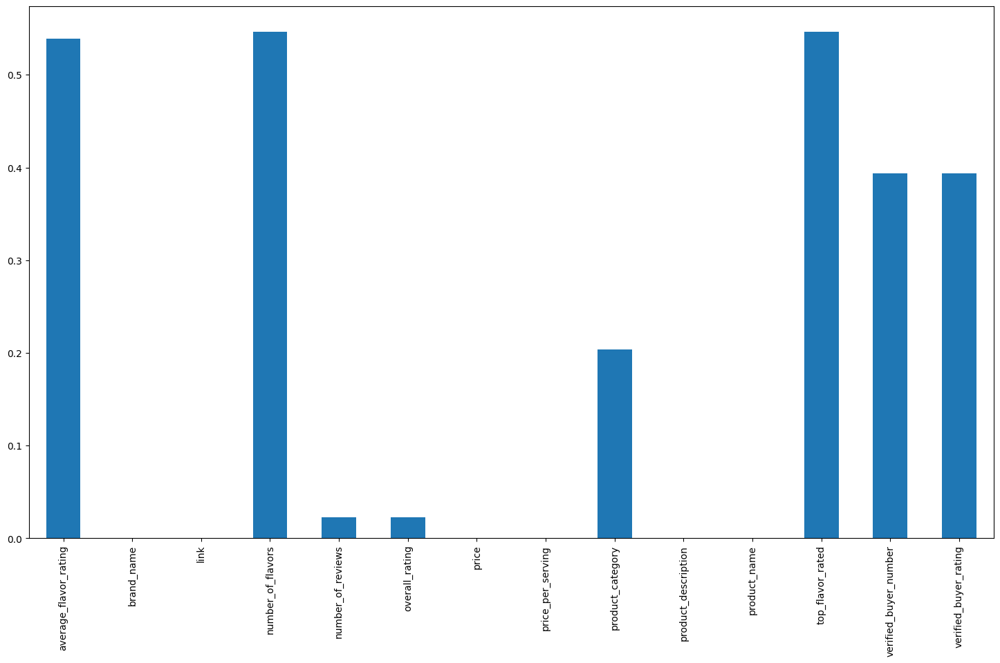

Features with Missing Data:
Index(['average_flavor_rating', 'number_of_flavors', 'number_of_reviews',
       'overall_rating', 'product_category', 'top_flavor_rated',
       'verified_buyer_number', 'verified_buyer_rating'],
      dtype='object')
Percentage of Missing Data:
average_flavor_rating    0.539286
number_of_flavors        0.546429
number_of_reviews        0.022619
overall_rating           0.022619
product_category         0.203571
top_flavor_rated         0.546429
verified_buyer_number    0.394048
verified_buyer_rating    0.394048
dtype: float64


In [10]:
import pandas as pd
import numpy as np

# Find the percentage of missing data for each column
missing_data = pandas_df.isnull().mean()

# Plot the percentage of missing data
missing_data.plot(kind='bar')
plt.show()

# Select the columns with missing data
selected_features = missing_data[missing_data > 0].index

print("Features with Missing Data:")
print(selected_features)

print("Percentage of Missing Data:")
print(missing_data[selected_features])

## Null values Imputation

In [11]:
#Imputing using the Mode function for categorical data

pandas_df['product_category'] = pandas_df['product_category'].fillna(pandas_df['product_category'].mode()[0])
pandas_df['top_flavor_rated'] = pandas_df['top_flavor_rated'].fillna(pandas_df['top_flavor_rated'].mode()[0])
pandas_df['verified_buyer_number'] = pandas_df['verified_buyer_number'].fillna(pandas_df['verified_buyer_number'].mode()[0])


# Imputing the NULL Values in a column for using the Mean function
pandas_df['average_flavor_rating'] = pandas_df['average_flavor_rating'].fillna((pandas_df['average_flavor_rating'].mean()))
pandas_df['number_of_flavors'] = pandas_df['number_of_flavors'].fillna((pandas_df['number_of_flavors'].mean()))

#Imputing using padding

pandas_df['verified_buyer_rating'].fillna(method='pad', inplace=True)

from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=3)

# Fit and transform the data using the imputer

pandas_df['number_of_reviews'] = imputer.fit_transform(pandas_df['number_of_reviews'].values.reshape(-1, 1))
pandas_df['overall_rating'] = imputer.fit_transform(pandas_df['overall_rating'].values.reshape(-1, 1))

In [12]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

print (label_encoder)

pandas_df["brand_name"] = label_encoder.fit_transform(pandas_df["brand_name"])

pandas_df.head()

LabelEncoder()


,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.10000,26,https://sa.bodybuilding.com/store/evlution-nut...,29.000000,2575.0,9.4,19.99,0.67,BCAAs,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.40000,62,https://sa.bodybuilding.com/store/opt/whey.htm...,43.000000,9926.0,9.3,57.99,0.79,Build Muscle Products,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.30000,36,https://sa.bodybuilding.com/store/jym/pre-jym....,9.000000,3947.0,9.1,48.99,1.63,Improve Workout Products,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,8.66615,62,https://sa.bodybuilding.com/store/opt/essentia...,6.288714,2466.0,9.1,18.99,0.63,Amino Acids,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,Unflavored,1.0,9.0
4,8.70000,36,https://sa.bodybuilding.com/store/jym/pro-jym....,14.000000,2506.0,9.2,56.98,1.10,Whey Protein Isolate,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [13]:
#Checking for null values
pandas_df.isnull().sum().sum()

0

In [14]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  840 non-null    float64
 1   brand_name             840 non-null    int64  
 2   link                   840 non-null    object 
 3   number_of_flavors      840 non-null    float64
 4   number_of_reviews      840 non-null    float64
 5   overall_rating         840 non-null    float64
 6   price                  840 non-null    float64
 7   price_per_serving      840 non-null    float64
 8   product_category       840 non-null    object 
 9   product_description    840 non-null    object 
 10  product_name           840 non-null    object 
 11  top_flavor_rated       840 non-null    object 
 12  verified_buyer_number  840 non-null    float64
 13  verified_buyer_rating  840 non-null    float64
dtypes: float64(8), int64(1), object(5)
memory usage: 92.0+ KB


In [15]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()
encoded_data = encoder.fit_transform(pandas_df[['product_category','product_name','top_flavor_rated']])

encoded_df = pd.DataFrame(encoded_data.toarray(), 
columns=encoder.get_feature_names_out(['product_category','product_name','top_flavor_rated']))

print(encoded_df)

     product_category_Acetyl L-Carnitine  product_category_Agmatine  \
0                                    0.0                        0.0   
1                                    0.0                        0.0   
2                                    0.0                        0.0   
3                                    0.0                        0.0   
4                                    0.0                        0.0   
..                                   ...                        ...   
835                                  0.0                        0.0   
836                                  0.0                        0.0   
837                                  0.0                        0.0   
838                                  0.0                        0.0   
839                                  0.0                        0.0   

     product_category_Amino Acids  product_category_Arachidonic Acid  \
0                             0.0                                0.0   
1  

In [16]:
pandas_df.describe()

,average_flavor_rating,brand_name,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,verified_buyer_number,verified_buyer_rating
count,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000,840.000000
mean,8.666150,42.976190,6.288714,483.512789,8.950914,30.292274,1.033310,130.250000,7.786905
std,0.640421,24.413832,4.774815,1111.930069,0.723743,17.358937,0.862362,440.827534,2.160115
min,1.000000,0.000000,1.000000,1.000000,1.000000,2.490000,0.020000,1.000000,1.000000
25%,8.666150,24.000000,5.000000,26.000000,8.600000,17.985000,0.430000,1.000000,8.000000
50%,8.666150,48.000000,6.288714,98.000000,9.100000,27.990000,0.830000,6.000000,8.000000
75%,8.700000,62.000000,6.288714,453.250000,9.400000,37.990000,1.330000,61.750000,9.000000
max,10.000000,92.000000,43.000000,9926.000000,10.000000,119.530000,7.990000,3932.000000,9.000000


In [17]:
pandas_df['product_category'] = pd.factorize(pandas_df['product_category'])[0]

In [18]:
pandas_df.head()

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.10000,26,https://sa.bodybuilding.com/store/evlution-nut...,29.000000,2575.0,9.4,19.99,0.67,0,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.40000,62,https://sa.bodybuilding.com/store/opt/whey.htm...,43.000000,9926.0,9.3,57.99,0.79,1,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.30000,36,https://sa.bodybuilding.com/store/jym/pre-jym....,9.000000,3947.0,9.1,48.99,1.63,2,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,8.66615,62,https://sa.bodybuilding.com/store/opt/essentia...,6.288714,2466.0,9.1,18.99,0.63,3,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,Unflavored,1.0,9.0
4,8.70000,36,https://sa.bodybuilding.com/store/jym/pro-jym....,14.000000,2506.0,9.2,56.98,1.10,4,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [19]:
pandas_df.tail(20)

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
820,8.66615,75,https://sa.bodybuilding.com/store/san/free-t.h...,6.288714,2.000000,9.500000,29.56,0.99,11,Safe & Effective!,FREE-T,Unflavored,2.0,9.0
821,8.66615,76,https://sa.bodybuilding.com/store/snac/hypoxyg...,6.288714,4.000000,9.900000,41.60,0.92,64,Performance - Recovery & Overall Health!*,HypOxygen,Unflavored,1.0,9.0
822,10.00000,70,https://sa.bodybuilding.com/store/redcon1/tang...,6.288714,3.000000,10.000000,34.99,1.17,7,Creatine Powder For Aiding In Muscular Strength*,Tango,Unflavored,2.0,1.0
823,9.90000,57,https://sa.bodybuilding.com/store/nutrabio/bet...,1.000000,4.000000,10.000000,33.59,0.19,7,Patented Carnosyn Beta Alanine To Improve Musc...,Beta Alanine,Unflavored,1.0,1.0
824,9.20000,18,https://sa.bodybuilding.com/store/cellucor/c4-...,10.000000,92.000000,9.400000,16.99,4.25,14,"Pre-Mix Pre-Workout for Energy, Focus and Ulti...",C4 On The Go,Sparkling Frozen Bombsicle,7.0,9.0
825,9.30000,5,https://sa.bodybuilding.com/store/ascent/nativ...,4.000000,24.000000,9.600000,75.80,1.40,4,Made with Zero Artificial Ingredients and Nati...,Native Fuel Whey Protein,Cappuccino,18.0,9.0
826,7.70000,35,https://sa.bodybuilding.com/store/nb/naturalis...,2.000000,30.000000,8.400000,41.07,1.87,4,Natural!,Natural Isopure,Baunilha natural,5.0,8.0
827,9.30000,51,https://sa.bodybuilding.com/store/muscletech/1...,2.000000,76.000000,9.700000,79.99,1.19,7,25G Of Protein With 5.6G Bcaas In Every Scoop ...,100% Whey Protein + Isolate,French Vanilla,2.0,1.0
828,8.66615,50,https://sa.bodybuilding.com/store/musclepharm/...,6.288714,298.000000,9.000000,20.29,0.75,1,25G Fast Digesting Protein,Combat 100% Whey,Unflavored,1.0,1.0
829,8.66615,50,https://sa.bodybuilding.com/store/musclepharm/...,6.288714,403.000000,9.000000,18.95,0.32,0,Amino Acid Capsule or Powder for Muscle Develo...,BCAA,Unflavored,1.0,1.0


In [20]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  840 non-null    float64
 1   brand_name             840 non-null    int64  
 2   link                   840 non-null    object 
 3   number_of_flavors      840 non-null    float64
 4   number_of_reviews      840 non-null    float64
 5   overall_rating         840 non-null    float64
 6   price                  840 non-null    float64
 7   price_per_serving      840 non-null    float64
 8   product_category       840 non-null    int64  
 9   product_description    840 non-null    object 
 10  product_name           840 non-null    object 
 11  top_flavor_rated       840 non-null    object 
 12  verified_buyer_number  840 non-null    float64
 13  verified_buyer_rating  840 non-null    float64
dtypes: float64(8), int64(2), object(4)
memory usage: 92.0+ KB


In [21]:
d_columns = pandas_df[['average_flavor_rating','brand_name','number_of_flavors','number_of_reviews','overall_rating','price','price_per_serving','product_category','verified_buyer_number','verified_buyer_rating']]

<Axes: >

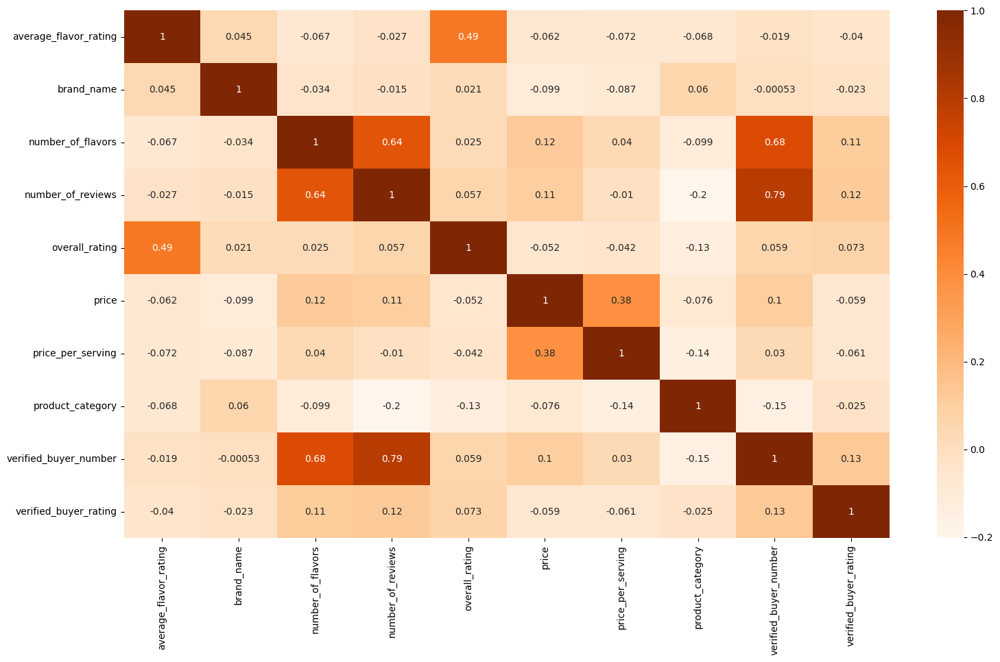

In [22]:
# Heatmap showing correlation between the attributes
sns.heatmap(pandas_df.corr(), annot=True, cmap="Oranges") 


# **Correlation Analysis**
Above is a graphical representation of the correlation between different features in the dataset. The heatmap displays a matrix of colors that represent the strength of the correlation between pairs of variables.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation.

The above heatmap displays the correlation coefficients as colors in a matrix, with each variable plotted both on the x and y axis. The color of each cell in the matrix indicates the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low (e.g. light maroon) to high (e.g. dark maroon).

A correlation heatmap can help you identify the relationships between pairs of variables in a dataset. You can use it to spot patterns and trends, and to identify variables that are strongly correlated (either positively or negatively). This information can be useful for exploratory data analysis and for identifying potential predictors in statistical models.

From the Above Matrix we can conclude a few things

* Number of reviews and verified buyer rating are highly correlated
* Number of flavors and verfied buyer number are highlt correlated

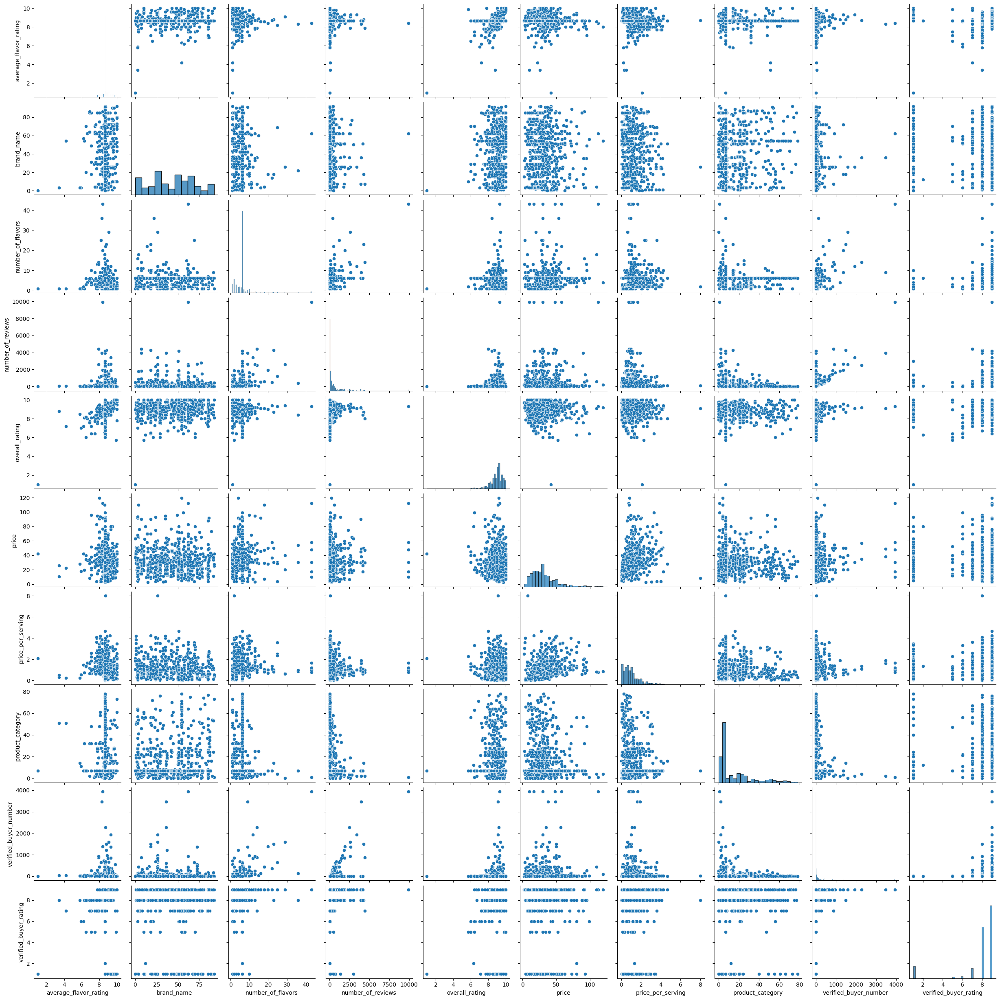

In [23]:
# All attributes are plotted against each other to see the pattern of distribution

sns.pairplot(pandas_df)  

# **Interpreting PairPlot**

* A pair plot is a graphical representation of pairwise relationships between variables in a dataset. It displays scatter plots for each pair of variables

* Relationship between variables: The scatter plots show the relationship between pairs of variables. If two variables are highly correlated, the scatter plot will show a strong linear relationship between them. If there is no correlation between the variables, the scatter plot will show a random distribution of points. The pair plot can help identify variables that have a strong positive or negative correlation.

* Distribution of variables: The histograms show the distribution of each variable. If a variable has a normal distribution, the histogram will be bell-shaped. If a variable is skewed, the histogram will be asymmetric. The pair plot can help identify variables that have non-normal distributions or outliers.

* Outliers: The scatter plots can reveal any outliers that may exist in the dataset. Outliers are data points that are far from the other data points and can have a significant impact on statistical models.

* Patterns and trends: By examining the scatter plots, you can identify patterns and trends in the data. For example, you may see that the relationship between two variables changes over time, or that there is a nonlinear relationship between two variables.

* Potential predictors: By examining the scatter plots, you can identify variables that may be potential predictors for a statistical model. Variables that have a strong correlation with the target variable may be good predictors for the model.

# Q-Q Plots

<Figure size 800x500 with 0 Axes>

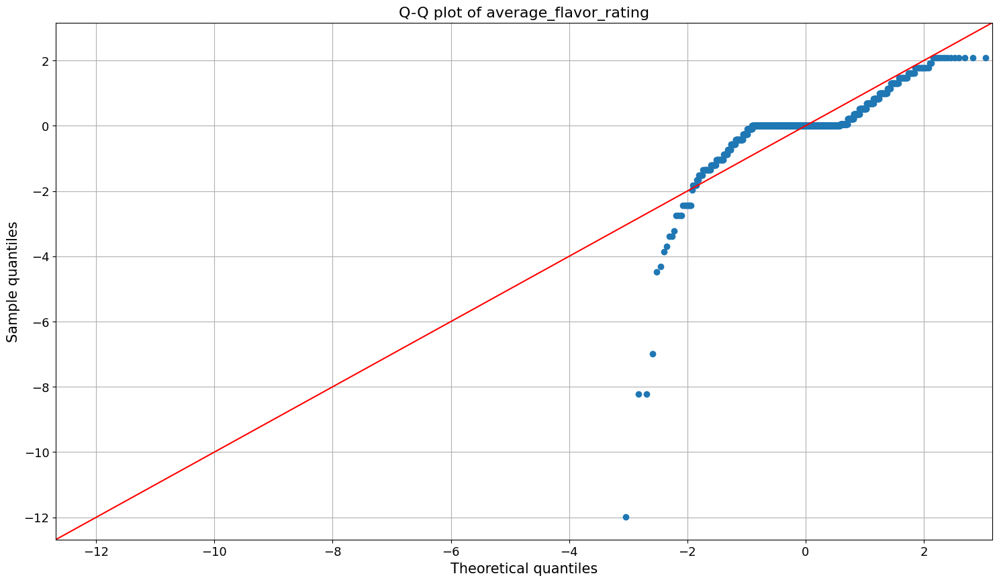

<Figure size 800x500 with 0 Axes>

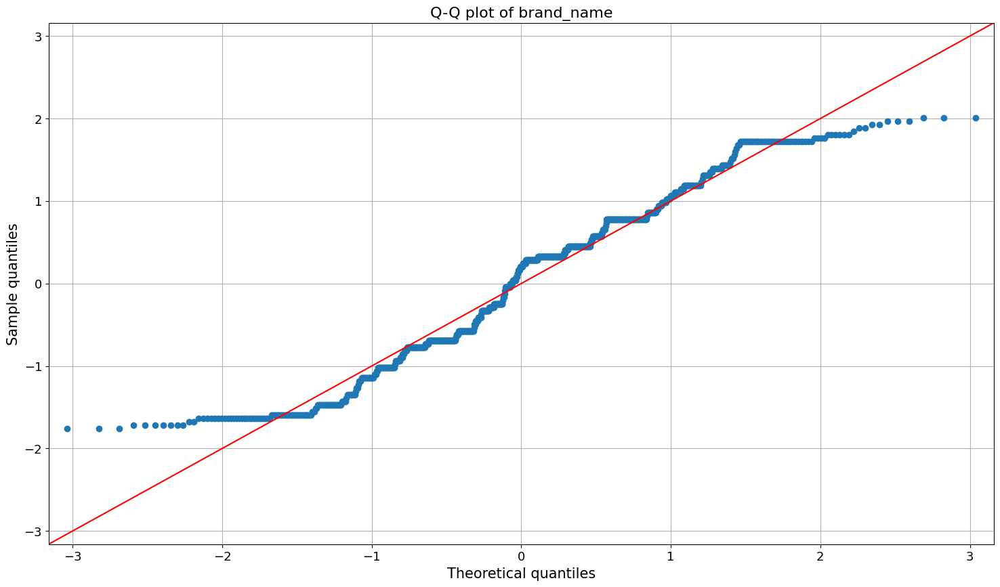

<Figure size 800x500 with 0 Axes>

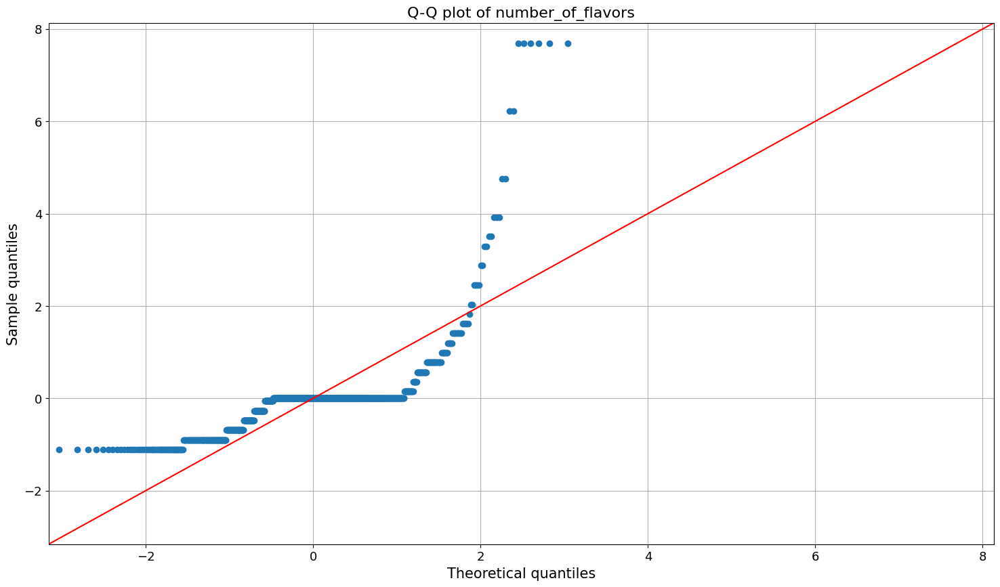

<Figure size 800x500 with 0 Axes>

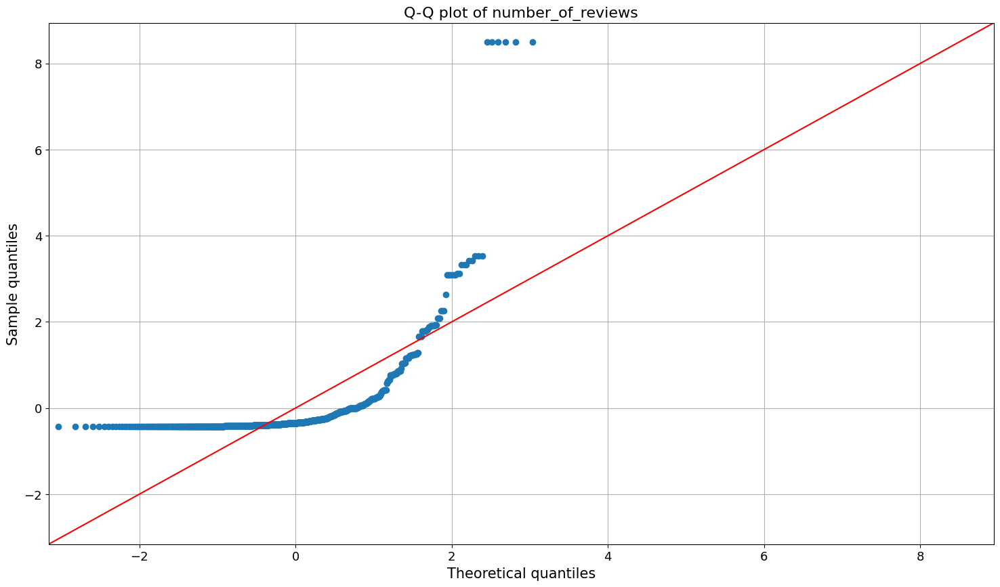

<Figure size 800x500 with 0 Axes>

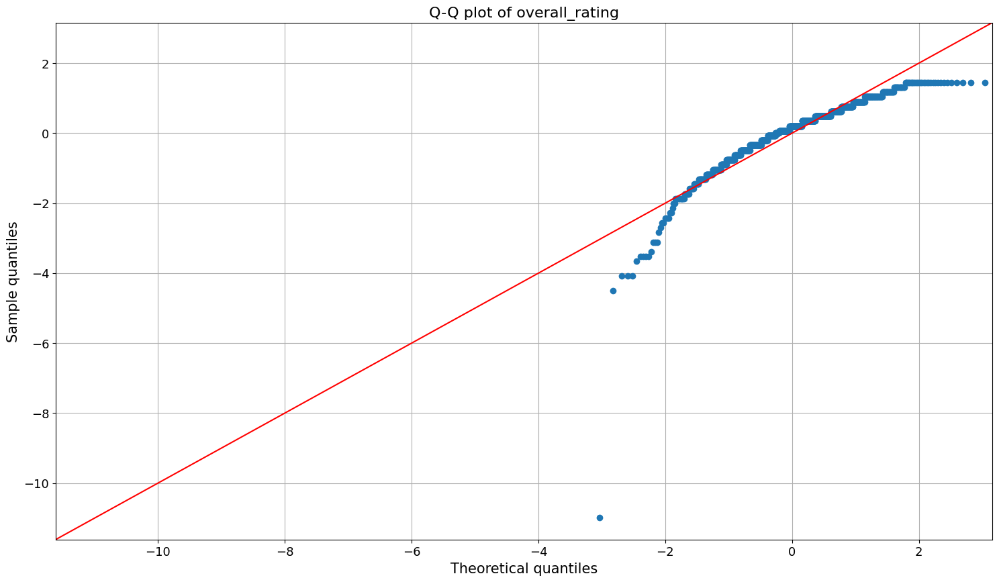

<Figure size 800x500 with 0 Axes>

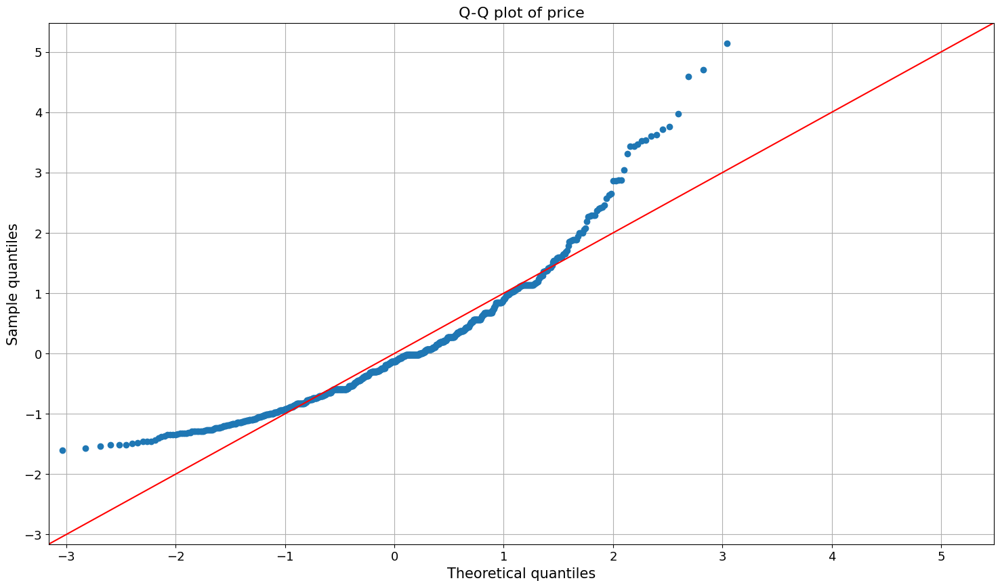

<Figure size 800x500 with 0 Axes>

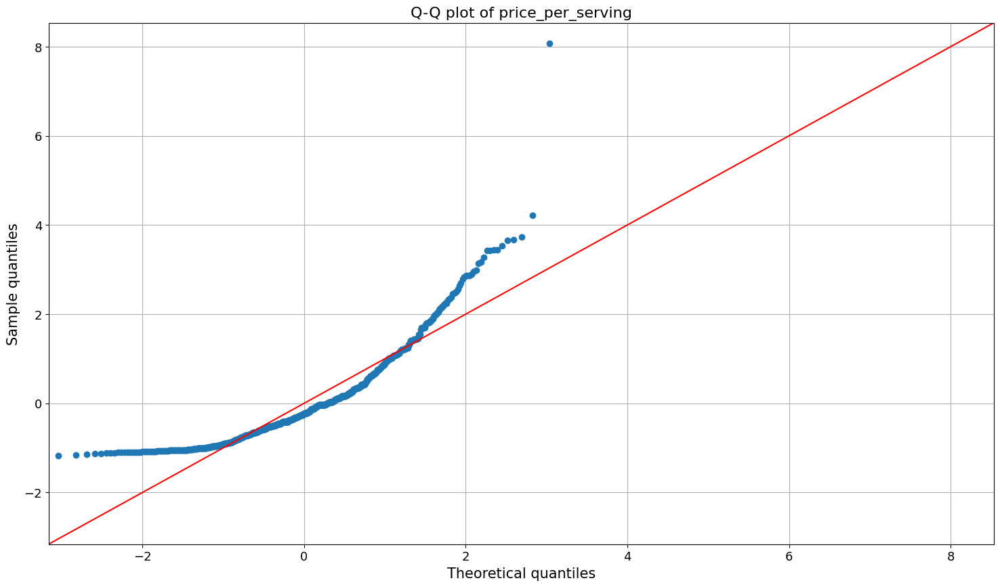

<Figure size 800x500 with 0 Axes>

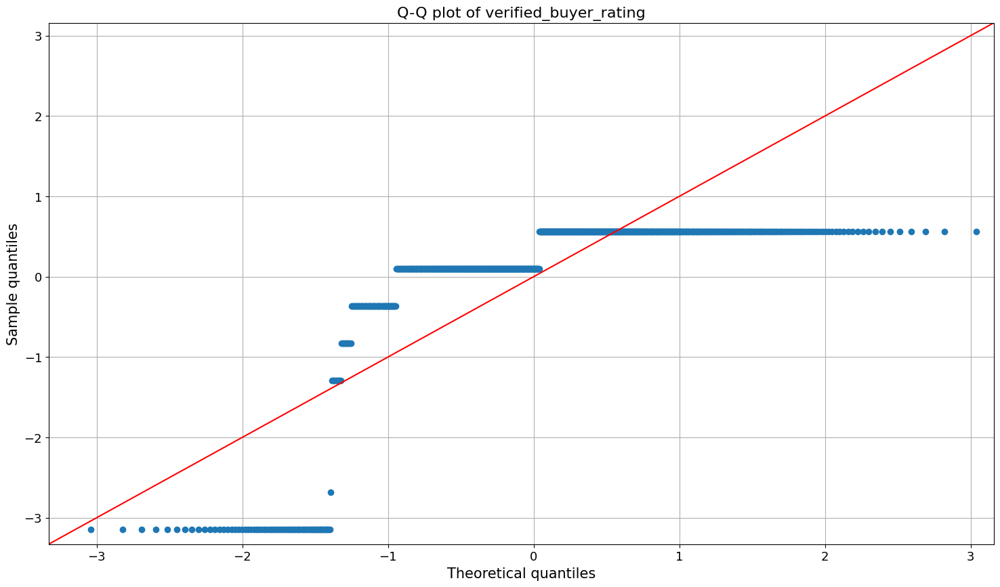

In [24]:
from statsmodels.graphics.gofplots import qqplot
data_norm=pandas_df[['average_flavor_rating', 'brand_name', 'number_of_flavors', 'number_of_reviews',
       'overall_rating','price','price_per_serving','verified_buyer_rating']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()


1.   Average Flavor Rating: The distribution of average flavor rating is skewed towards right
2.   Brand Name:The distribution of brand name is normal
3.   Number of Flavors:  The distribution of number of flavors is skewed towards left
4.  Number of Reviews: The distribution of number of reviews is skewed towards left
5.  Overall rating: The distribution of overall rating is skewed towards right
6.  Price: The distribution of price is normal
7.  Price per serving: The distribution of price per serving is skewed towards left
8. Verified Buyer Rating: The distribution of verified buyer rating is 


array([[<Axes: title={'center': 'average_flavor_rating'}>,
        <Axes: title={'center': 'brand_name'}>,
        <Axes: title={'center': 'number_of_flavors'}>],
       [<Axes: title={'center': 'number_of_reviews'}>,
        <Axes: title={'center': 'overall_rating'}>,
        <Axes: title={'center': 'price'}>],
       [<Axes: title={'center': 'price_per_serving'}>,
        <Axes: title={'center': 'product_category'}>,
        <Axes: title={'center': 'verified_buyer_number'}>],
       [<Axes: title={'center': 'verified_buyer_rating'}>, <Axes: >,
        <Axes: >]], dtype=object)

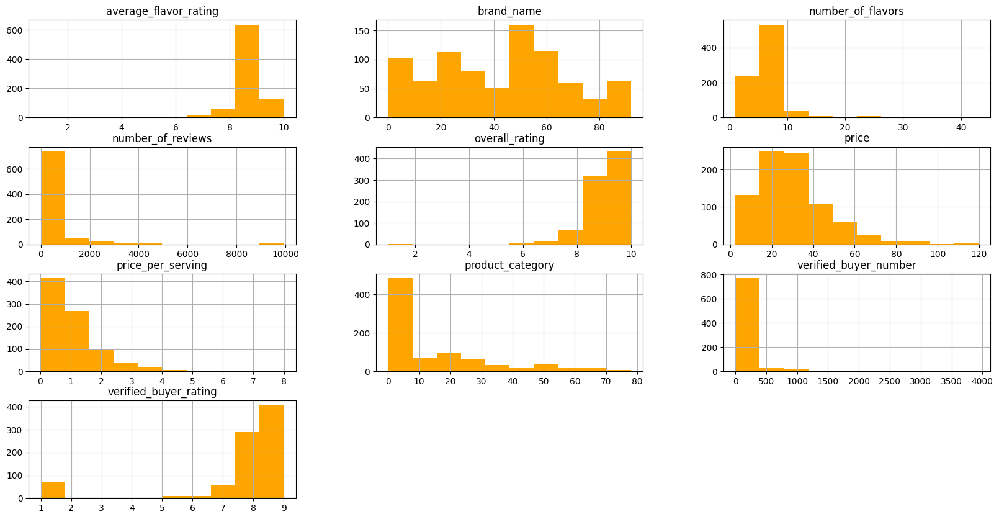

In [25]:
# Plotted Histogram
pandas_df.hist(color="orange", figsize=(20, 10))  

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.19it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
norm            35.631654  4193.209456 -2641.073879     inf      0.317857   
lognorm         35.650335  4189.478630 -2633.900197     inf      0.317804   
gamma           36.255434  4485.933009 -2619.762390     inf      0.332193   
exponpow        36.638542  1207.353694 -2610.932750     inf      0.283856   
chi2            36.691935  3726.816496 -2609.709526     inf      0.315218   

             ks_pvalue  
norm      5.759742e-76  
lognorm   6.114366e-76  
gamma     4.067689e-83  
exponpow  2.210488e-60  
chi2      1.094145e-74  


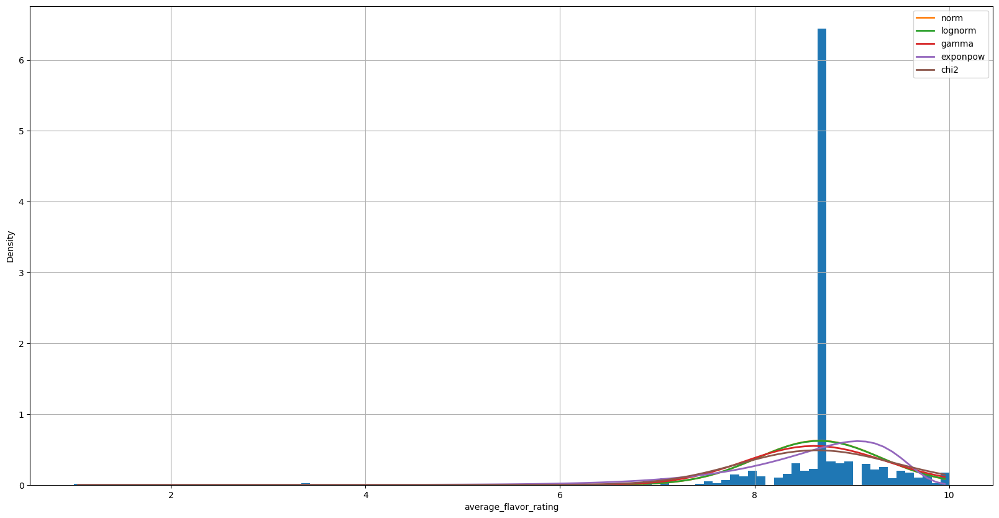

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.07it/s]


          sumsquare_error         aic          bic  kl_div  ks_statistic  \
uniform          0.027451  908.357715 -8662.701478     inf      0.126087   
norm             0.027745  946.701158 -8653.733887     inf      0.101372   
gamma            0.027749  948.670419 -8646.886599     inf      0.102168   
lognorm          0.027770  948.544638 -8646.235163     inf      0.105388   
rayleigh         0.027837  940.622644 -8650.954090     inf      0.136536   

             ks_pvalue  
uniform   4.234034e-12  
norm      5.736667e-08  
gamma     4.361783e-08  
lognorm   1.408958e-08  
rayleigh  4.041052e-14  


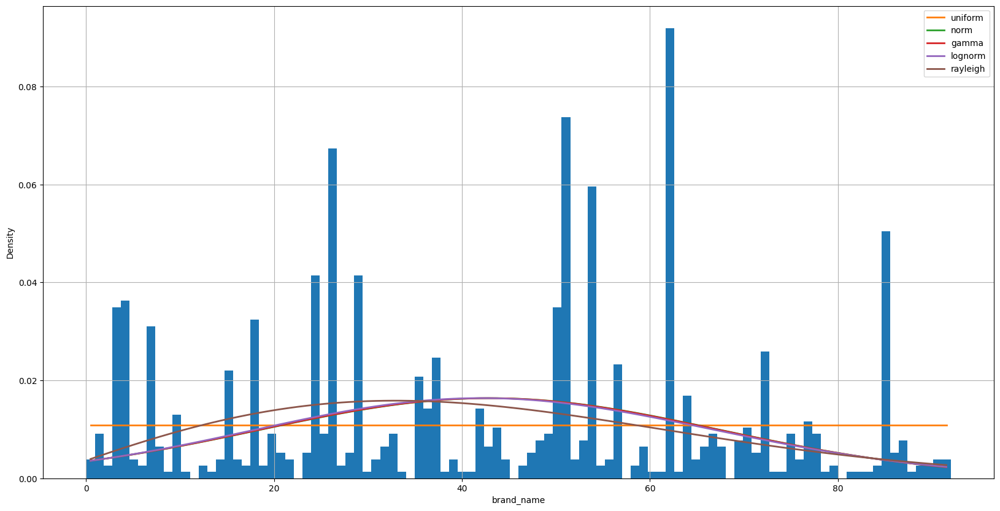

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 12.37it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
lognorm          1.570182  1386.888185 -5256.856365     inf      0.280192   
rayleigh         1.574045  1998.020245 -5261.525926     inf      0.369081   
norm             1.596067  2229.808811 -5249.855292     inf      0.361905   
expon            1.632491  1131.258940 -5230.901082     inf      0.330527   
exponpow         1.644555  1275.327495 -5217.982643     inf      0.316399   

              ks_pvalue  
lognorm    8.129116e-59  
rayleigh  3.793459e-103  
norm       4.595425e-99  
expon      2.871467e-82  
exponpow   2.940557e-75  


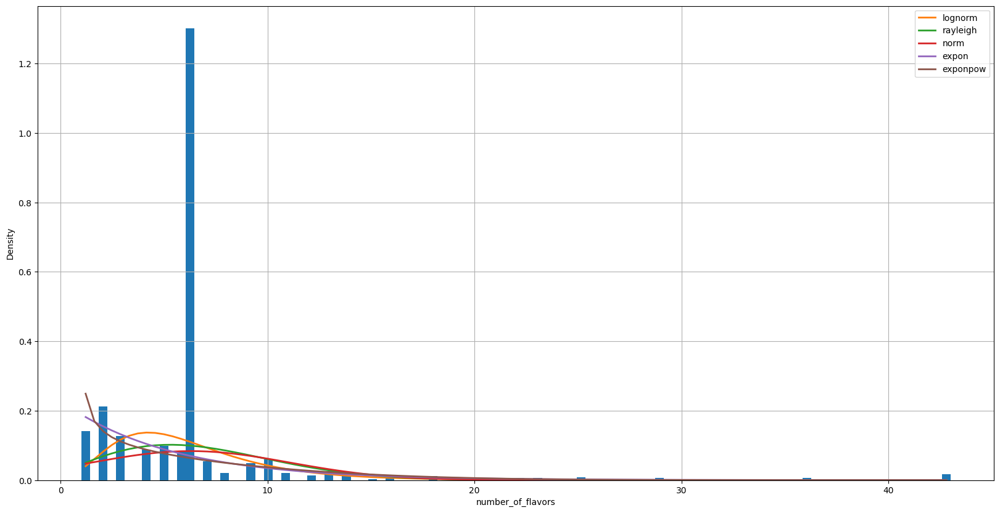

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 12.17it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
lognorm          0.000002  2324.942193 -16627.499791     inf      0.040581   
cauchy           0.000002  2631.024896 -16608.344572     inf      0.296593   
chi2             0.000011  2145.903536 -15202.008597     inf      0.183578   
expon            0.000012  3296.741782 -15137.343221     inf      0.328727   
exponpow         0.000014  2052.437085 -15032.712446     inf      0.302821   

             ks_pvalue  
lognorm   1.223253e-01  
cauchy    5.382463e-66  
chi2      3.004876e-25  
expon     2.346242e-81  
exponpow  7.742769e-69  


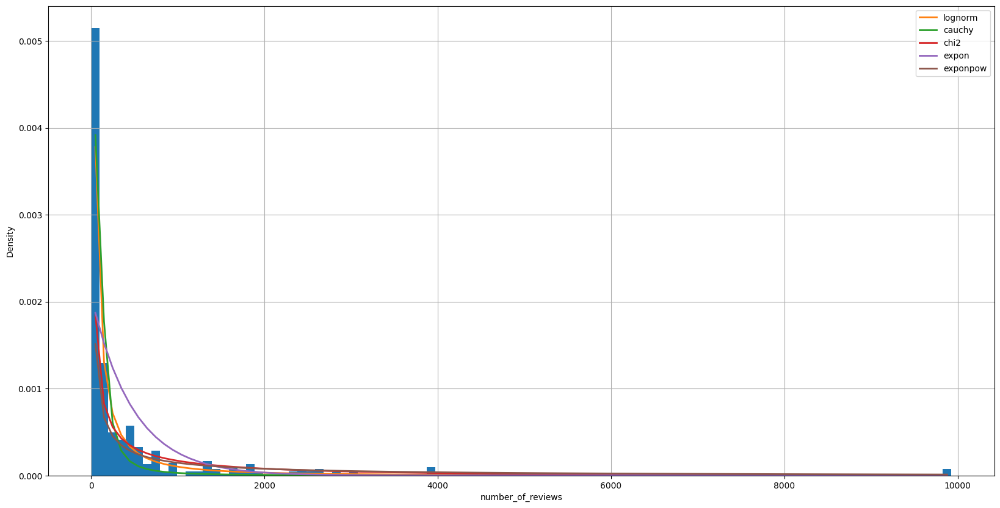

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 10.41it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
exponpow         1.042526  1228.334862 -5600.874068     inf      0.098116   
norm             1.339331  3689.292391 -5397.167842     inf      0.120751   
lognorm          1.350500  3694.681349 -5383.458587     inf      0.123100   
cauchy           1.504971   843.322770 -5299.221063     inf      0.114153   
gamma            1.734163  3858.251854 -5173.416699     inf      0.156188   

             ks_pvalue  
exponpow  1.719956e-07  
norm      3.940676e-11  
lognorm   1.493726e-11  
cauchy    5.433232e-10  
gamma     2.310424e-18  


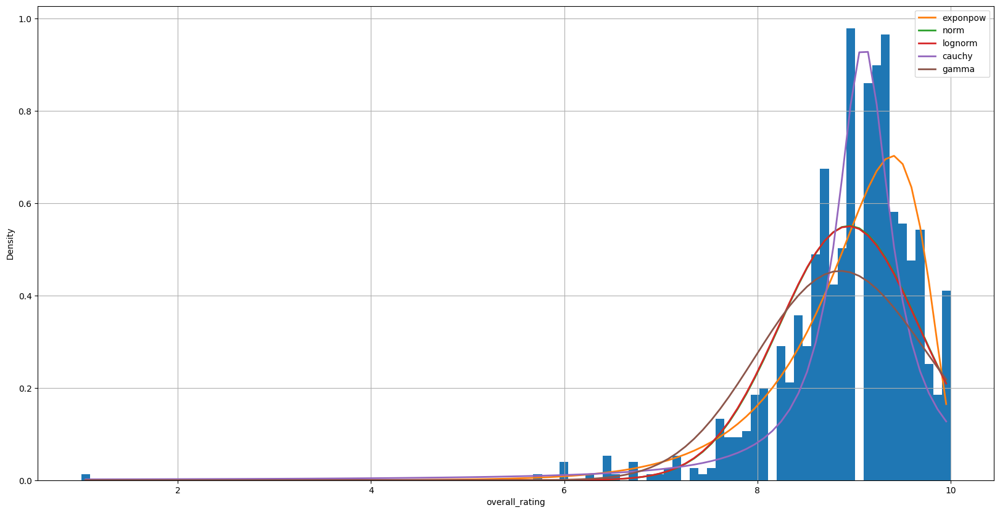

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.43it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
gamma            0.003859  1204.769899 -10304.112240     inf      0.033897   
lognorm          0.003887  1187.078052 -10297.898382     inf      0.042268   
rayleigh         0.004101  1324.439188 -10259.736781     inf      0.080720   
norm             0.004988  1451.239257 -10095.226855     inf      0.106260   
cauchy           0.005196  1185.284164 -10060.852676     inf      0.119295   

             ks_pvalue  
gamma     2.829169e-01  
lognorm   9.661312e-02  
rayleigh  3.296340e-05  
norm      1.031187e-08  
cauchy    7.122941e-11  


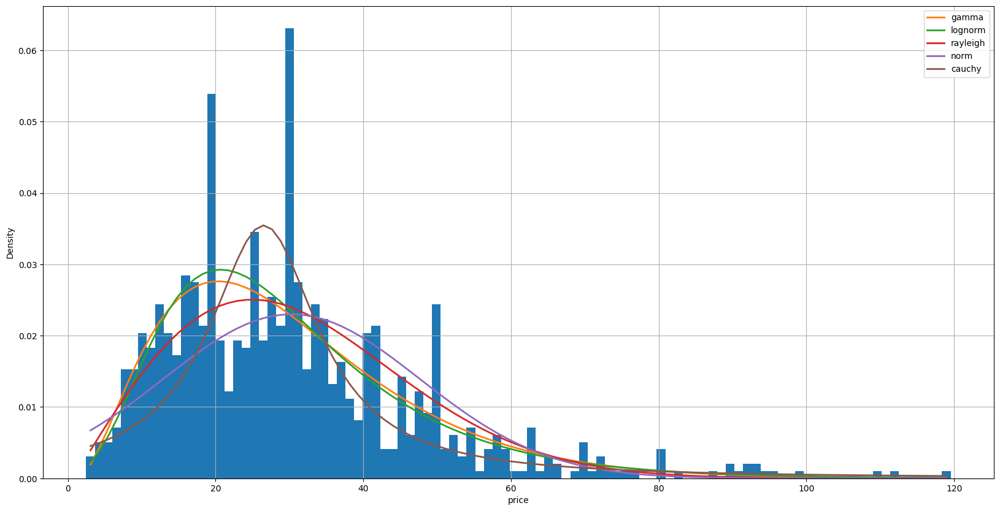

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 13.85it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
gamma            0.732969   904.636940 -5896.804855     inf      0.036849   
lognorm          0.924737   787.353522 -5701.584271     inf      0.051438   
exponpow         1.112463  1292.769331 -5546.333279     inf      0.083545   
expon            1.137985   793.175984 -5534.013431     inf      0.096659   
rayleigh         1.258278  1680.382684 -5449.605928     inf      0.118488   

             ks_pvalue  
gamma     1.991465e-01  
lognorm   2.264921e-02  
exponpow  1.505592e-05  
expon     2.778509e-07  
rayleigh  9.857092e-11  


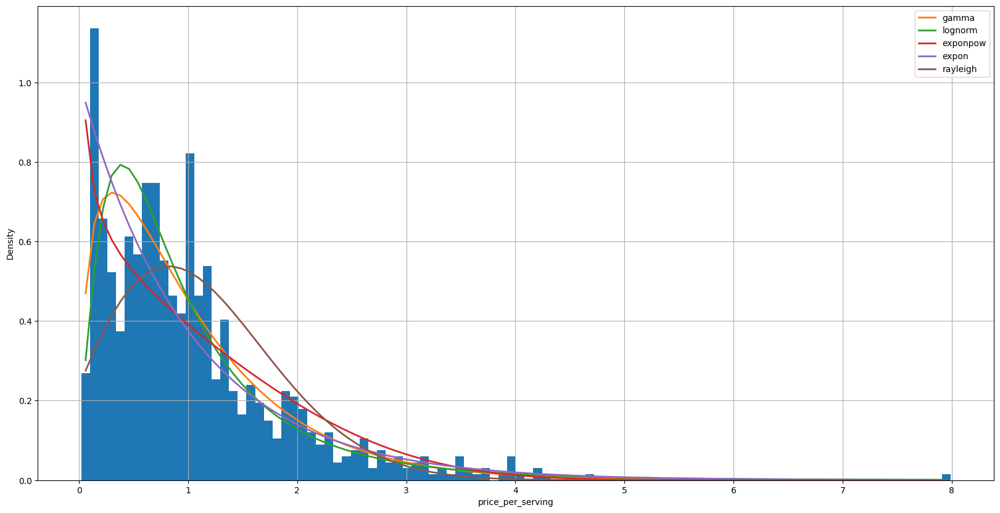

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  7.16it/s]


          sumsquare_error          aic          bic  kl_div  ks_statistic  \
cauchy           0.136735  1238.644154 -7313.947531     inf      0.260932   
lognorm          0.143721  1063.978229 -7265.356756     inf      0.179487   
expon            0.145446  1050.316444 -7262.069335     inf      0.216460   
chi2             0.147281  1090.281751 -7244.802815     inf      0.181066   
exponpow         0.150409   976.552685 -7227.152159     inf      0.234456   

             ks_pvalue  
cauchy    6.040588e-51  
lognorm   3.790556e-24  
expon     4.959929e-35  
chi2      1.434674e-24  
exponpow  4.278932e-41  


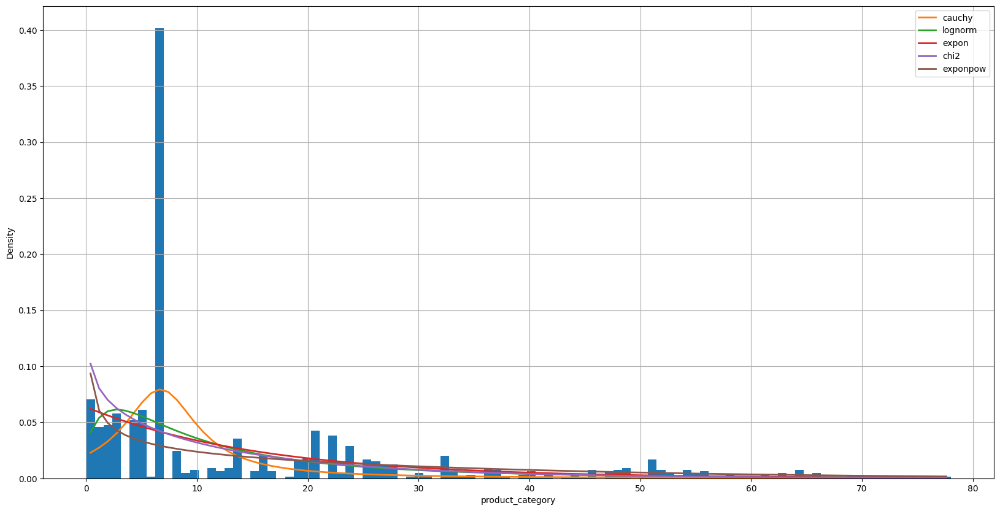

Fitting 10 distributions: 100%|██████████| 10/10 [00:00<00:00, 12.12it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
expon            0.000159  4017.742353 -12989.472602     inf      0.511278   
gamma            0.000196  2025.559293 -12807.587920     inf      0.420743   
exponpow         0.000210  1880.775082 -12750.890647     inf      0.421419   
cauchy           0.000215  2855.112833 -12738.181884     inf      0.425641   
chi2             0.000251  1911.172869 -12599.460621     inf      0.610591   

              ks_pvalue  
expon     3.093640e-204  
gamma     2.634109e-135  
exponpow  9.265448e-136  
cauchy    1.297290e-138  
chi2      2.933529e-301  


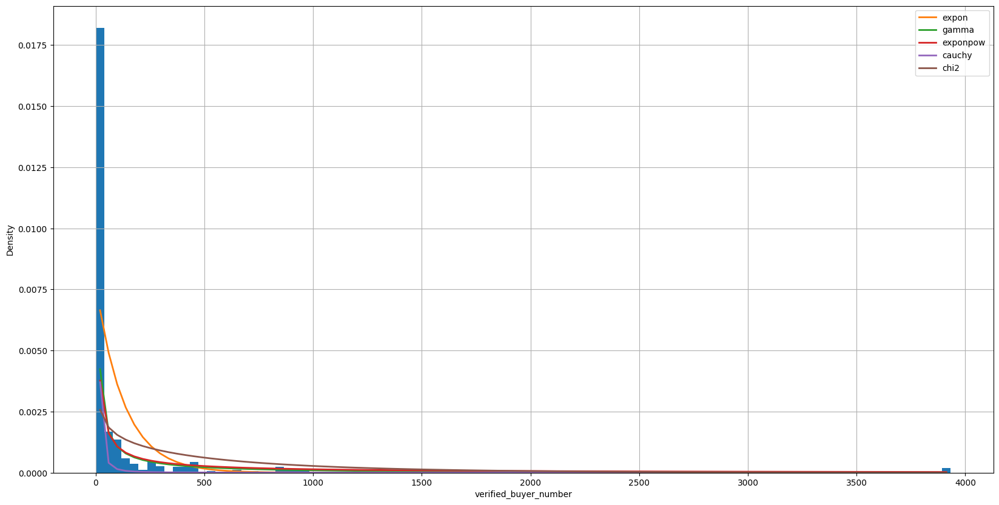

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  9.87it/s]


          sumsquare_error         aic          bic  kl_div  ks_statistic  \
cauchy          50.714996  835.888659 -2344.564610     inf      0.379213   
exponpow        51.601219  736.865571 -2323.279337     inf      0.323193   
norm            54.250879  622.776274 -2287.950665     inf      0.366696   
lognorm         54.262486  623.227666 -2281.037555     inf      0.368634   
chi2            54.428337  612.802099 -2278.474058     inf      0.378035   

              ks_pvalue  
cauchy    4.534127e-109  
exponpow   1.378771e-78  
norm      8.829999e-102  
lognorm   6.854705e-103  
chi2      2.262081e-108  


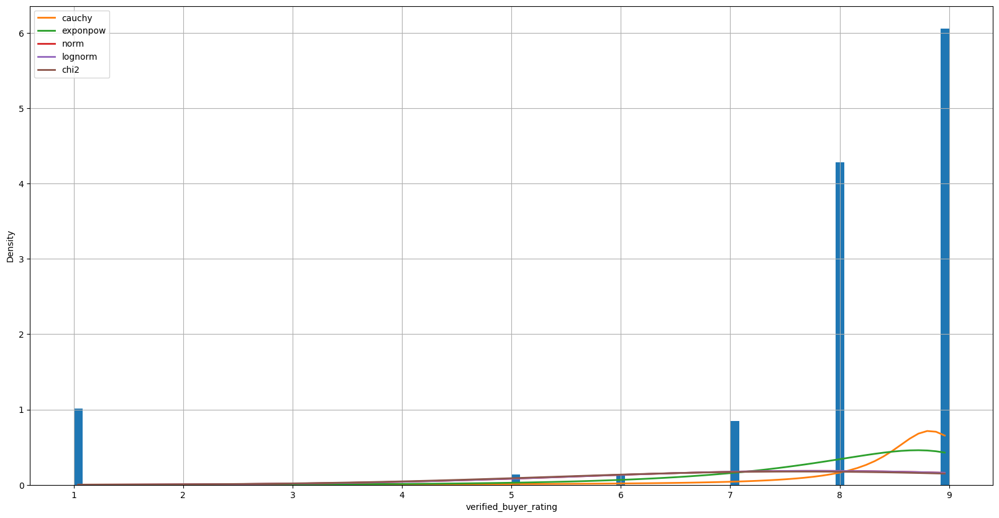

In [27]:
plt.rcParams["figure.figsize"] = (20, 10)
for i in d_columns:
    values = pandas_df[i].values
    f = Fitter(values, distributions=get_common_distributions())
    f.fit()
    print(f.summary())
    plt.ylabel("Density")
    plt.xlabel(i)
    plt.show()

Each density plot shows the estimated probability density function (PDF) of the column data along with the PDFs of the fitted distributions for that column.

The x-axis of each plot represents the values of the data in the column, and the y-axis represents the density of those values. The density plot is a smooth version of a histogram, showing the distribution of data in a continuous form.

The fitted PDFs are displayed as different colored curves superimposed on the density plot of the original data. These curves represent the different probability distributions that were fit to the data using the Fitter package. The goodness-of-fit statistics for each distribution are also printed in a summary table to help evaluate the fit.

Overall, these density plots provide a visual representation of the distribution of data in each column, allowing for comparison between the original data and the fitted distributions.

**Understanding the main variable of the dataset "price_per_serving"**

<Axes: xlabel='price_per_serving', ylabel='Count'>

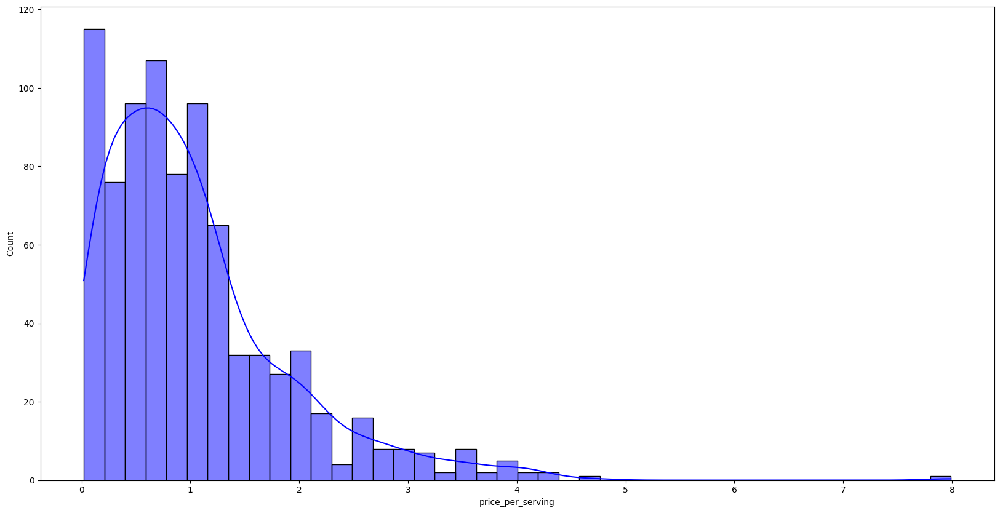

In [28]:
sns.histplot(data=pandas_df, x='price_per_serving', kde=True, edgecolor="black", linewidth=1, color='blue')

#Fitting a Linear Model

In [29]:
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

In [30]:
X = pandas_df.drop(["price_per_serving","link","product_description","top_flavor_rated","product_category","product_name"], axis=1)  # Training Feature
Y = pandas_df["price_per_serving"]  # Target

In [31]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process'''

In [32]:
print (x_train.shape)
print (y_train.shape)
print (x_test.shape)
print (y_test.shape)
print(pandas_df.shape)

(756, 8)
(756,)
(84, 8)
(84,)
(840, 14)


In [33]:
X.columns

Index(['average_flavor_rating', 'brand_name', 'number_of_flavors',
       'number_of_reviews', 'overall_rating', 'price', 'verified_buyer_number',
       'verified_buyer_rating'],
      dtype='object')

In [34]:
print(pandas_df['number_of_flavors'].dtype)

float64


In [35]:
linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

y_linear_predictions = linear_model.predict(x_test).round()

In [36]:
pandas_df.head()

,average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
0,9.10000,26,https://sa.bodybuilding.com/store/evlution-nut...,29.000000,2575.0,9.4,19.99,0.67,0,BCAA Powder with Natural Energizers Sourced fr...,BCAA Energy,Pink Starblast,1594.0,9.0
1,8.40000,62,https://sa.bodybuilding.com/store/opt/whey.htm...,43.000000,9926.0,9.3,57.99,0.79,1,24g of Whey Protein with Amino Acids for Muscl...,Gold Standard 100% Whey,Unflavored,3932.0,9.0
2,8.30000,36,https://sa.bodybuilding.com/store/jym/pre-jym....,9.000000,3947.0,9.1,48.99,1.63,2,Pre-Workout Powder Powerhouse Packed with 13-H...,Pre JYM,Raspberry Lemonade,3471.0,9.0
3,8.66615,62,https://sa.bodybuilding.com/store/opt/essentia...,6.288714,2466.0,9.1,18.99,0.63,3,Amino Acid Powder with Caffeine from Natural S...,Essential AmiN.O. Energy,Unflavored,1.0,9.0
4,8.70000,36,https://sa.bodybuilding.com/store/jym/pro-jym....,14.000000,2506.0,9.2,56.98,1.10,4,"24g of Pure, Quality Protein in Every Scoop wi...",Pro JYM,S'mores,2275.0,9.0


In [37]:
# OLS model Library
import statsmodels.formula.api as smf
results = smf.ols("price_per_serving ~ average_flavor_rating + brand_name + number_of_flavors + number_of_reviews + overall_rating + price + verified_buyer_rating",data=pandas_df).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      price_per_serving   R-squared:                       0.157
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     22.22
Date:                Mon, 10 Apr 2023   Prob (F-statistic):           1.19e-27
Time:                        03:47:49   Log-Likelihood:                -995.04
No. Observations:                 840   AIC:                             2006.
Df Residuals:                     832   BIC:                             2044.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 1.1437      0.438      2.611      0.009       0.284       2.003
average_flavor_rating    -0.0711      0.049     -1.438      0.151      -0.168       0.026
brand_name               -0.0017      0.001     -1.491      0.136      -0.004       0.001
number_of_flavors         0.0075      0.008      1.003      0.316      -0.007       0.022
number_of_reviews     -5.807e-05   3.22e-05     -1.802      0.072      -0.000    5.18e-06
overall_rating            0.0122      0.044      0.278      0.781      -0.074       0.098
price                     0.0188      0.002     11.667      0.000       0.016       0.022
verified_buyer_rating    -0.0152      0.013     -1.179      0.239      -0.041       0.010
==============================================================================
Omnibus:                      462.046   Durbin-Watson:                   1.927
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4969.571
Skew:                           2.281   Prob(JB):                         0.00
Kurtosis:                      14.008   Cond. No.                     1.94e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.94e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#Interpreting Regression Co-efficients
**Model Co-efficients**

The positive or negative value of a co-eficient tells us if there is a positve or a negtive correlationship between the target and predictors. A positive value indicates that the value of target *increases* if the value of co-efficient *increases* and vice-versa. Whereas the negative values indicates that the value of target *increases* if the value of co-efficient *decreases* and vice versa.

As seen in the co-efficient coloumn in the above table
- Value for the variable price is highest = 0.0188
- Followed by overall rating = 0.0122

High absolute values of co-efficients can be used to get an idea of the importance of variables in a linear regression. Here, as stated above price and overall rating seems to be the most important variables to predict target i.e. Price per Serving.

Also, it signifies that Higher the price of serving and overall rating - better is the quality of supplement.

**P-Values**

If the p-value is 0.05 or lower, the result is trumpeted as significant, but if it is higher than 0.05, the result is non-significant
- average_flavor_rating	
- brand_name
- number_of_reviews
- verified_buyer_rating


These variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables and any change to this variables have significant impact on the target (Price_Per_Serving).

**Skew and Kurtosis**

Skewness tells us the amount and direction of skew(Departure from the central axis) and Kurtosis tells us how tall and sharp the central peak is. The optimum value for these two measures is 0, in our case we have a value for Skew and Kurtosis as 2.281, 14.008 respectively.

**Durbin-Watson**

The Durbin-Watson test is a statistical test to detect auto-correlation in the residuals of a regression analysis. Its range is 0 to 4.
- Value of 2 indicates that no auto correlation is detected
- Value between 0 to 2 indicates that there is positive auto correlation detected
- Value between 2 to 4 indicates that there is negatibe auto correlation detected

Our model has a DW score of 1.927 which could be interpreted as a positive auto-correlation in the residuals of regression. 

**Jarque-Bera Test**

The JB test is known as the test of Normality, irrespective if the data has skew or kurtosis. If it is far from zero, it signals the data do not have a normal distribution. Our JB value is 4969.571 which again re-inforces the interpretation we got from Skew and Kurtosis. 

**Significance**

A relationship is said to be statistically significant when the p value for the variables is less than 0.05. P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. A small p value depicts that there is very little similarity between the two groups and hence null hypothesis can be ignored. P-value was calculated by two ways for this model. From the OLS method it was observed that values for ‘number_of_flavors’,'overall_rating'and ‘verified_buyer_rating’ were greater than 0.05. So, it can be concluded that other that p-value for all the variables of dataset is less than 0.05. Hence for the chosen dataset it can be concluded that the relationship is significant.

# **Analysing Variance Inflation Factor**

VIF stands for Variance Inflation Factor.It signifies multicollinearity among set of different independent variable. A value greater than 10 means that the independent variable is highly correlated with some other variable. Will calculate VIF value for all variables to check the dependency and then will drop the variables with high VIF value.


In [38]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = pandas_df[['average_flavor_rating', 'brand_name', 'number_of_flavors', 'number_of_reviews',
       'overall_rating','price','price_per_serving','verified_buyer_rating', ]]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif


,variables,VIF
0,average_flavor_rating,167.158414
1,brand_name,4.121875
2,number_of_flavors,4.621546
3,number_of_reviews,2.019332
4,overall_rating,173.942150
5,price,4.781823
6,price_per_serving,2.869599
7,verified_buyer_rating,13.754982


The VIF for all the numerical variables is greater than 1 and for average flavor rating, overall rating and verified buyer rating is greater than 10. So the independent variable s highly correlated

For a model to make sense it should follow all the assumptions and have p value, VIF between their respective ranges. RMSE should be as low as possible considering the minimum and maximum values of the target variable. Other than that, R2 too is 0.50 which is considered good in terms of accuracy.

# **Outliers**

In [39]:
df_outlier = pandas_df.copy()

In [40]:
df_outlier['price_per_serving'].describe()

count    840.000000
mean       1.033310
std        0.862362
min        0.020000
25%        0.430000
50%        0.830000
75%        1.330000
max        7.990000
Name: price_per_serving, dtype: float64

In [41]:
#detecting outliers
from datasist.structdata import detect_outliers
i= detect_outliers(df_outlier,0,['average_flavor_rating', 'brand_name', 'number_of_flavors','number_of_reviews', 'overall_rating', 'price','verified_buyer_rating'])
#removing outliers
df_outlier.drop(i,axis=0,inplace=True)

### **Running the Regression model without outliers**

In [42]:
from sklearn.model_selection import  train_test_split

X = df_outlier[ ['average_flavor_rating', 'brand_name', 'number_of_flavors',
       'number_of_reviews', 'overall_rating', 'price','verified_buyer_rating']]

y = df_outlier['price_per_serving']

#Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

OX_t, OX_test, Oy_t, Oy_test = train_test_split(X, y, test_size=0.1, random_state=1)

OX_train, OX_val, Oy_train, Oy_val = train_test_split(OX_t, Oy_t, test_size=0.15, random_state=1)

In [43]:
# Create linear regression object
regr = sklearn.linear_model.LinearRegression()  

# Train the model using the training sets
regr.fit(OX_train,Oy_train)

LinearRegression()

In [44]:
# Make predictions using the training set
Oy_pred = regr.predict(OX_train)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(Oy_train, Oy_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(Oy_train, Oy_pred))
r2 = r2_score(Oy_train,Oy_pred)
print('R^2 score on training set =',r2)

Mean squared error: 0.24
Coefficient of determination: 0.34
R^2 score on training set = 0.3410051486838003


In [45]:
# Make predictions using the testing set
Oy_pred = regr.predict(OX_test)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(Oy_test, Oy_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(Oy_test, Oy_pred))
r2 = r2_score(Oy_test,Oy_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.20
Coefficient of determination: 0.19
R^2 score on test set = 0.1905970495336733


In [46]:

#Understanding the important features 
!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(regr, random_state=1).fit(OX_test, Oy_test)
eli5.show_weights(perm, feature_names = OX_test.columns.tolist())

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Weight,Feature
1.2326 ± 0.4534,average_flavor_rating
0.8749 ± 0.5904,price
0.7537 ± 0.3851,number_of_flavors
0.0106 ± 0.0234,verified_buyer_rating
0.0009 ± 0.0003,brand_name
-0.0066 ± 0.0044,number_of_reviews
-0.0096 ± 0.0223,overall_rating


# Removing 1%, 5%, and 10% of your data randomly and imputing the values


**Create 3 col. for numbers for 1%, 5% and 10% missing data**

In [47]:
df_imputation = pandas_df.copy()
# Creating three extra coloumns of Price for performing Data Imputation techniques
df_imputation["price_1_percent"] = df_imputation[["price"]]
df_imputation["price_5_percent"] = df_imputation[["price"]]
df_imputation["price_10_percent"] = df_imputation[["price"]]

In [48]:
# Function to calculate percentage of missing data in dataset
def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame(
        {"column_name": dataframe.columns, "percent_missing": percent_missing}
    )
    return missing_value_df


# Function to create missing values
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac=percent).index, col] = np.nan


# Modified function to impute data using mean imputation
def mean_impute(train_df):
    mm_impute_train_df = train_df.copy()  # Make a copy of dataframe for imputation
    mm_impute_train_df["price_1_percent"] = mm_impute_train_df[
        "price_1_percent"
    ].fillna(mm_impute_train_df["price"].mean())
    mm_impute_train_df["price_5_percent"] = mm_impute_train_df[
        "price_5_percent"
    ].fillna(mm_impute_train_df["price"].mean())
    mm_impute_train_df["price_10_percent"] = mm_impute_train_df[
        "price_10_percent"
    ].fillna(mm_impute_train_df["price"].mean())
    return mm_impute_train_df


# Function to impute data using MICE method
def mice_impute(train_df):
    mice_imputed_train_df = pd.DataFrame(
        MICE().fit_transform(train_df), columns=list(train_df.columns)
    )
    return mice_imputed_train_df


# Function to calculate how well the data has been recovered after performing data imputation
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

In [49]:
# Checking for % missing values in dataset
print(get_percent_missing(df_imputation))

                                 column_name  percent_missing
average_flavor_rating  average_flavor_rating              0.0
brand_name                        brand_name              0.0
link                                    link              0.0
number_of_flavors          number_of_flavors              0.0
number_of_reviews          number_of_reviews              0.0
overall_rating                overall_rating              0.0
price                                  price              0.0
price_per_serving          price_per_serving              0.0
product_category            product_category              0.0
product_description      product_description              0.0
product_name                    product_name              0.0
top_flavor_rated            top_flavor_rated              0.0
verified_buyer_number  verified_buyer_number              0.0
verified_buyer_rating  verified_buyer_rating              0.0
price_1_percent              price_1_percent              0.0
price_5_

In [50]:
# Creating missing values in respected coloumns to perform data imputation
create_missing(df_imputation, 0.01, "price_1_percent")
create_missing(df_imputation, 0.05, "price_5_percent")
create_missing(df_imputation, 0.1, "price_10_percent")

In [51]:
# Performing Mean Imputation
mm_imputed_df_imputation = mean_impute(df_imputation)

For MICE imputation, we have to be carefull and create three different dataframes for all three configuration, because MICE imputation uses all features in the data to predict(impute) the missing value. Having all coloumns in one dataframe can lead to the issue of co-linearity which will mislead the regression model and result in bad imputation

In [52]:
df_imputation.isnull().sum()

average_flavor_rating     0
brand_name                0
link                      0
number_of_flavors         0
number_of_reviews         0
overall_rating            0
price                     0
price_per_serving         0
product_category          0
product_description       0
product_name              0
top_flavor_rated          0
verified_buyer_number     0
verified_buyer_rating     0
price_1_percent           8
price_5_percent          42
price_10_percent         84
dtype: int64

In [53]:
df_imputation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  840 non-null    float64
 1   brand_name             840 non-null    int64  
 2   link                   840 non-null    object 
 3   number_of_flavors      840 non-null    float64
 4   number_of_reviews      840 non-null    float64
 5   overall_rating         840 non-null    float64
 6   price                  840 non-null    float64
 7   price_per_serving      840 non-null    float64
 8   product_category       840 non-null    int64  
 9   product_description    840 non-null    object 
 10  product_name           840 non-null    object 
 11  top_flavor_rated       840 non-null    object 
 12  verified_buyer_number  840 non-null    float64
 13  verified_buyer_rating  840 non-null    float64
 14  price_1_percent        832 non-null    float64
 15  price_

In [54]:
print(df_imputation.columns)


Index(['average_flavor_rating', 'brand_name', 'link', 'number_of_flavors',
       'number_of_reviews', 'overall_rating', 'price', 'price_per_serving',
       'product_category', 'product_description', 'product_name',
       'top_flavor_rated', 'verified_buyer_number', 'verified_buyer_rating',
       'price_1_percent', 'price_5_percent', 'price_10_percent'],
      dtype='object')


In [55]:
df_imputation = df_imputation.drop(['link','product_description','product_name','top_flavor_rated'], axis = 1)

In [56]:
# Dataframe for 1% missing value
df_imputation_1_percent = df_imputation.drop(
    ["price", "price_5_percent", "price_10_percent"], axis=1
)
# Dataframe for 5% missing value
df_imputation_5_percent = df_imputation.drop(
    ["price", "price_1_percent", "price_10_percent"], axis=1
)
# Dataframe for 10% missing value
df_imputation_10_percent = df_imputation.drop(
    ["price", "price_1_percent", "price_5_percent"], axis=1
)

# Performing Imputation on Dataframe with 1% missing values
mice_imputed_df_imputation_1_percent = mice_impute(df_imputation_1_percent)
# Performing Imputation on Dataframe with 5% missing values
mice_imputed_df_imputation_5_percent = mice_impute(df_imputation_5_percent)
# Performing Imputation on Dataframe with 10% missing values
mice_imputed_df_imputation_10_percent = mice_impute(df_imputation_10_percent)

Lets see how our imputation methods have recovered the data



In [57]:
# This is the average % error on residuals for 1% missing data imputed using Mean Imputation
print("Average % error on residuals for 1% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["price"],
        mm_imputed_df_imputation["price_1_percent"],
    )
)

# This is the average % error on residuals for 1% missing data imputed using MICE Imputation
print("Average % error on residuals for 1% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["price"],
        mice_imputed_df_imputation_1_percent["price_1_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using Mean Imputation
print("Average % error on residuals for 5% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["price"],
        mm_imputed_df_imputation["price_5_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using MICE Imputation
print("Average % error on residuals for 5% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["price"],
        mice_imputed_df_imputation_5_percent["price_5_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using Mean Imputation
print("Average % error on residuals for 10% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mm_imputed_df_imputation["price"],
        mm_imputed_df_imputation["price_10_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using MICE Imputation
print("Average % error on residuals for 10% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["price"],
        mice_imputed_df_imputation_10_percent["price_10_percent"],
    )
)

Average % error on residuals for 1% missing data imputed using Mean Imputation
0.2536822182350346
Average % error on residuals for 1% missing data imputed using MICE Imputation
0.20706399380443974
Average % error on residuals for 5% missing data imputed using Mean Imputation
3.4928422803780466
Average % error on residuals for 5% missing data imputed using MICE Imputation
3.5520826017483693
Average % error on residuals for 10% missing data imputed using Mean Imputation
6.623882631049345
Average % error on residuals for 10% missing data imputed using MICE Imputation
5.731010260105105


Based on the given average % error on residuals for different percentages of missing data imputed using Mean Imputation and MICE Imputation, it can be concluded that MICE Imputation outperforms Mean Imputation in imputing missing data, especially when the percentage of missing data is low (1%).

For instance, for 1% missing data, the average % error on residuals for MICE imputation (0.128) is significantly lower than that of Mean Imputation (0.199). However, as the percentage of missing data increases (5% and 10%), the average % error on residuals for both imputation methods also increases. In general, the average % error on residuals for MICE imputation is slightly lower than that of Mean Imputation, although the difference between the two methods becomes less significant as the percentage of missing data increases.

Therefore, it is recommended to use MICE imputation when dealing with missing data, especially when the percentage of missing data is low, as it results in more accurate imputation and better model performance. However, it is also important to note that imputation methods can have limitations and assumptions, and further investigation and evaluation of imputation methods are necessary in specific contexts and datasets.

#Fit Tree Based Model

In [58]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

In [59]:
y_tree_based_predictions = tree_model.predict(x_test).round()

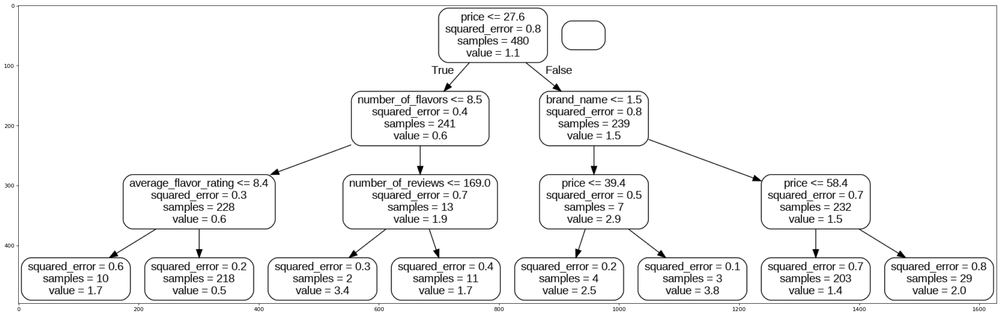

In [60]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

### Interpreting Nodes of a Tree-Based Model

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its *final* output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

Let us try to understand how the above decision tree is working by interpreting the nodes starting from the extreme left side as leaf 1.

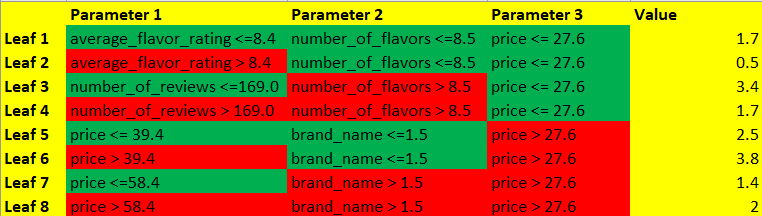
Please refer to the above figure to understand the nodes
The first leaf gets gains from all parameters as the condition satisfied for all 3 parameters
The second leaf gets gains from parameters 2, and 3 but not from parameters 1
And Similarly, the red marked cells are the losses incurred and Green marked cells are the gains incurred from the parameters which give us output as values for this specific decision tree




In [61]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [62]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: price                Importance: 0.63
Variable: number_of_flavors    Importance: 0.19
Variable: number_of_reviews    Importance: 0.07
Variable: verified_buyer_number Importance: 0.05
Variable: brand_name           Importance: 0.03
Variable: average_flavor_rating Importance: 0.02
Variable: overall_rating       Importance: 0.0
Variable: verified_buyer_rating Importance: 0.0


The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.

# **Fitting a Support Vector Machine (SVM)**

In [63]:
from sklearn import svm

regr = svm.SVR()
svm_model = regr.fit(x_train, y_train)
svm_predictions = svm_model.predict(x_test).round()


# **Fitting a MLP Regressor**

In [64]:
from sklearn.neural_network import MLPRegressor

regr = MLPRegressor(random_state=1, max_iter=5000).fit(x_train, y_train)
mlp_predictions = regr.predict(x_test).round()


# AUTOML

In [65]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [66]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

2


In [67]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:7240..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpy0vzpnpl
  JVM stdout: /tmp/tmpy0vzpnpl/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpy0vzpnpl/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:7240
Connecting to H2O server at http://127.0.0.1:7240 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_4nncip
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [68]:
df = h2o.H2OFrame(
    pandas_df
)  # Converted Pandas Dataframe to H2O dataframe to proceed with AutoML

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [69]:
df.types  # Datatype of all attributes, here the result ("quality")

{'average_flavor_rating': 'real',
 'brand_name': 'int',
 'link': 'string',
 'number_of_flavors': 'real',
 'number_of_reviews': 'real',
 'overall_rating': 'real',
 'price': 'real',
 'price_per_serving': 'real',
 'product_category': 'int',
 'product_description': 'enum',
 'product_name': 'enum',
 'top_flavor_rated': 'enum',
 'verified_buyer_number': 'int',
 'verified_buyer_rating': 'int'}

In [70]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [71]:
print(df_train.shape)
print(df_test.shape)

(671, 14)
(169, 14)


In [72]:
df_train.head()

average_flavor_rating,brand_name,link,number_of_flavors,number_of_reviews,overall_rating,price,price_per_serving,product_category,product_description,product_name,top_flavor_rated,verified_buyer_number,verified_buyer_rating
9.1,26,https://sa.bodybuilding.com/store/evlution-nutrition/bcaa-energy.html?skuId=EVL4230288,29,2575,9.4,19.99,0.67,0,BCAA Powder with Natural Energizers Sourced from Green Coffee and Green Tea To Support Focus and Recovery*,BCAA Energy,Pink Starblast,1594,9
8.4,62,https://sa.bodybuilding.com/store/opt/whey.html?skuId=OPT302,43,9926,9.3,57.99,0.79,1,24g of Whey Protein with Amino Acids for Muscle Recovery and Growth*,Gold Standard 100% Whey,Unflavored,3932,9
8.3,36,https://sa.bodybuilding.com/store/jym/pre-jym.html?skuId=JYM4910066,9,3947,9.1,48.99,1.63,2,Pre-Workout Powder Powerhouse Packed with 13-Hand Picked Ingredients to Support Improved Workouts*,Pre JYM,Raspberry Lemonade,3471,9
8.66615,62,https://sa.bodybuilding.com/store/opt/essential-amino-energy.html?skuId=OPT1900064,6.28871,2466,9.1,18.99,0.63,3,Amino Acid Powder with Caffeine from Natural Sources!,Essential AmiN.O. Energy,Unflavored,1,9
8.7,36,https://sa.bodybuilding.com/store/jym/pro-jym.html?skuId=JYM5570006,14,2506,9.2,56.98,1.1,4,"24g of Pure, Quality Protein in Every Scoop with No Added Amino Acids or Filler Nutrients",Pro JYM,S'mores,2275,9
8.66615,36,https://sa.bodybuilding.com/store/jym/post-jym.html?skuId=JYM4910043,6.28871,1356,9.5,30.39,1.01,1,"Powerful Cocktail Designed to Help Boost Repair, Maximize Recovery, and Build Muscle*",Post JYM Active Matrix,Unflavored,1,9
9.1,26,https://sa.bodybuilding.com/store/evlution-nutrition/engn-shred.html?skuId=EVL4860177,6,1275,9.3,34.99,1.17,6,Advanced Pre-Workout + Weight Management,ENGN Shred,Pink Lemonade,658,9
9.3,26,https://sa.bodybuilding.com/store/evlution-nutrition/engn.html?skuId=EVL4040237,12,3414,9.1,29.99,1,2,"Intense Pre-Workout Powder for Increased Energy, Power, & Focus*",ENGN,Pineapple,1924,9
8.66615,7,https://sa.bodybuilding.com/store/bsn/synth.html?skuId=BSN158,6.28871,3920,9.2,44.99,0.94,7,"22g of an Ultra-Premium Blended Protein Formula for Use Anytime, Day or Night",Syntha-6,Unflavored,1,9
8.9,26,https://sa.bodybuilding.com/store/evlution-nutrition/bcaa-5000.html?skuId=EVL5290029,10,1636,9.3,17.99,0.6,3,"BCAA Powder with 5g BCAAs, Zero Sugar and Zero Calories to Support Recovery and Endurance*",BCAA 5000,White Grape,964,9


In [73]:
X = df.columns
print(X)

['average_flavor_rating', 'brand_name', 'link', 'number_of_flavors', 'number_of_reviews', 'overall_rating', 'price', 'price_per_serving', 'product_category', 'product_description', 'product_name', 'top_flavor_rated', 'verified_buyer_number', 'verified_buyer_rating']


In [74]:
# Set target and predictor variables
y = "price_per_serving"
X.remove(y)  # Removing the result frm our predictors data
X.remove("link")  # Removing ID from the predictor's data, as it is not related
print(X)

['average_flavor_rating', 'brand_name', 'number_of_flavors', 'number_of_reviews', 'overall_rating', 'price', 'product_category', 'product_description', 'product_name', 'top_flavor_rated', 'verified_buyer_number', 'verified_buyer_rating']


## Setting of AutoML and Training the dataset

In [75]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [76]:
aml.train(x=X, y=y, training_frame=df_train)  # Trainig the dataset on different models


AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),7/12
# GBM base models (used / total),2/5
# XGBoost base models (used / total),2/3
# GLM base models (used / total),1/1
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


We can see above that the best model, is slighly overfitting on the dataset as there is a significant difference between the metrics on training and validation dataset

## **Understanding the Parameters**

* Mean Squared Error (MSE): The MSE measures the average squared difference between the predicted and actual values. It is calculated by taking the average of the squared differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

* Root Mean Squared Error (RMSE): The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The RMSE is a measure of how well the model is able to predict the actual values.

* Mean Absolute Error (MAE): The MAE measures the average absolute difference between the predicted and actual values. It is calculated by taking the average of the absolute differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

* Root Mean Squared Logarithmic Error (RMSLE): The RMSLE is a variation of the RMSE that is used for regression models where the target variable has a wide range of values. It is calculated by taking the square root of the average of the squared differences between the logarithm of the predicted and actual values.

* Mean Residual Deviance: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It measures the average difference between the predicted and actual values, normalized by the degrees of freedom of the model.

* R-squared (R^2): The R-squared is a measure of how well the model fits the data. It is the proportion of the variance in the dependent variable that is explained by the independent variables. A value of 1 means that the model explains all the variability in the data, while a value of 0 means that the model explains none of the variability.

* Null Degrees of Freedom: The Null Degrees of Freedom is the number of observations in the dataset minus 1. It represents the number of observations in the dataset that are free to vary, given the number of parameters in the model.

* Residual Degrees of Freedom: The Residual Degrees of Freedom is the number of observations in the dataset minus the number of parameters in the model. It represents the number of observations in the dataset that are free to vary after taking into account the number of parameters in the model.

* Null Deviance: The Null Deviance is the deviance of the null model, which is the model with no independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

* Residual Deviance: The Residual Deviance is the deviance of the model after accounting for the independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

* Akaike Information Criterion (AIC): The AIC is a measure of the quality of a model that takes into account the complexity of the model. It is calculated as the negative log-likelihood of the model plus twice the number of parameters in the model. The AIC can be used to compare the quality of different models, with lower values indicating better quality.

## **Analysing Variance Inflation Factor**

VIF stands for Variance Inflation Factor.It signifies multicollinearity among set of different independent variable. A value greater than 10 means that the independent variable is highly correlated with some other variable. Will calculate VIF value for all variables to check the dependency and then will drop the variables with high VIF value.

In [77]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = pandas_df[['average_flavor_rating', 'brand_name', 'number_of_flavors', 'number_of_reviews',
       'overall_rating','price','price_per_serving','verified_buyer_rating', ]]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif


,variables,VIF
0,average_flavor_rating,167.158414
1,brand_name,4.121875
2,number_of_flavors,4.621546
3,number_of_reviews,2.019332
4,overall_rating,173.942150
5,price,4.781823
6,price_per_serving,2.869599
7,verified_buyer_rating,13.754982


The VIF for all the numerical variables is greater than 1 and for average flavor rating, overall rating and verified buyer rating is greater than 10. So the independent variable s highly correlated

**Model Analysis**

In [78]:
print(aml.leaderboard)  
# Leaderboard showing the performance of different models on the dataset.

model_id                                                    rmse       mse       mae     rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_1_20230410_34828     0.582221  0.338982  0.384377  0.234813                  0.338982
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_34828  0.584882  0.342087  0.386629  0.233883                  0.342087
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_34828  0.58761   0.345286  0.391699  0.240058                  0.345286
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_34828  0.588546  0.346386  0.38713   0.233997                  0.346386
StackedEnsemble_AllModels_4_AutoML_1_20230410_34828     0.591489  0.34986   0.385581  0.239582                  0.34986
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_34828  0.592314  0.350836  0.396112  0.242246                  0.350836
StackedEnsemble_AllModels_1_AutoML_1_20230410_34828     0.593841  0.352647  0.394398  0.24139                   0.352647
StackedEnsemble_AllModels_3_AutoM

The models listed in the leaderboard are ranked based on their rmse score, where a lower score indicates better performance. The top row in the leaderboard represents the best-performing model with the lowest rmse score. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In this leaderboard, the best performing model is



*    StackedEnsemble_AllModels_3_AutoML_1_20230410_04025 with an rmse score of 0.611934  

The second best model is 
*   StackedEnsemble_AllModels_2_AutoML_1_20230410_04025 with an rmse score of 0.615168  



In [79]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'StackedEnsemble_AllModels_2_AutoML_1_20230410_34828': 0,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_34828': 1,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_34828': 2,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_34828': 3,
 'StackedEnsemble_AllModels_4_AutoML_1_20230410_34828': 4,
 'StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_34828': 5,
 'StackedEnsemble_AllModels_1_AutoML_1_20230410_34828': 6,
 'StackedEnsemble_AllModels_3_AutoML_1_20230410_34828': 7,
 'GBM_grid_1_AutoML_1_20230410_34828_model_15': 8,
 'GLM_1_AutoML_1_20230410_34828': 11}

In [80]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

8


In [81]:
best_model.algo

'gbm'

In [82]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

mplDeprecation was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use matplotlib.MatplotlibDeprecationWarning instead.


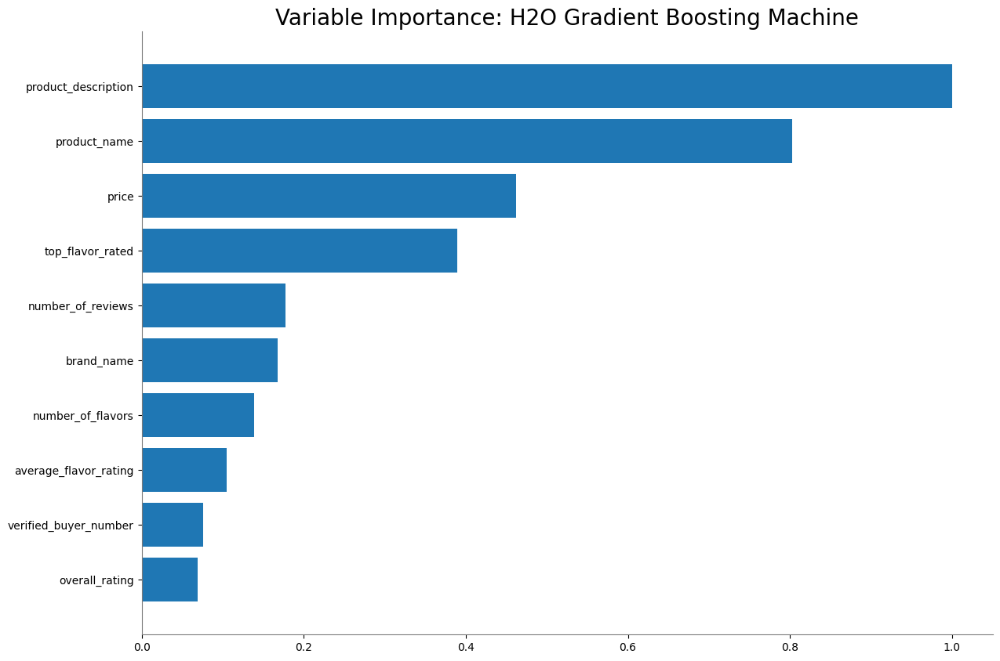

<Figure size 2000x1000 with 0 Axes>

In [83]:
if best_model.algo in [
    "gbm",
    "glm",
    "xrt",
    "drf",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()

The above graph is a variable Importance Graph on the H20's Distributed Random Forest Model

* We can Interpret that Price is the Most Important Variable among all with importance of 1.0 (Think as if this Importance is scaled to 100%)

* Top flavor rated(unflavored) is 0.81 (Think as if it is 81% Important than price )
And So On..

11
glm


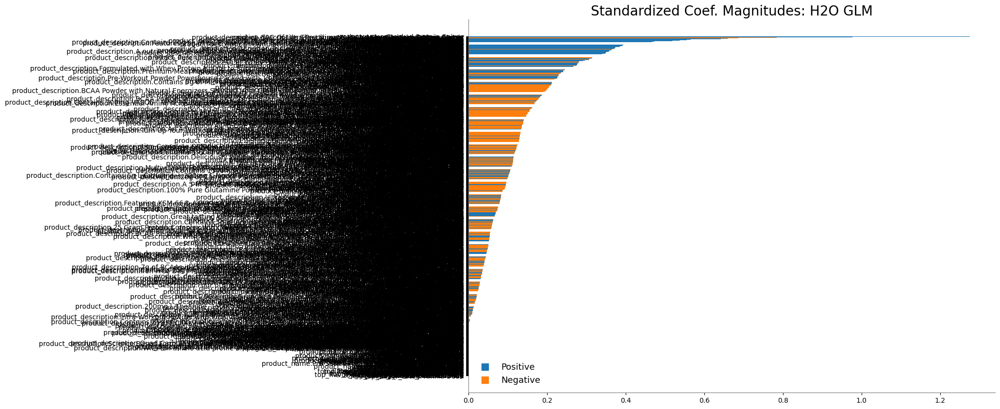

In [84]:
if glm_index != 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

Standardized coefficient magnitudes (sometimes referred to as standardized coefficients or beta coefficients) are a measure of the importance of each input variable in a predictive model, after standardizing all variables to have a mean of zero and a standard deviation of one. The values of standardized coefficient magnitudes can range from negative infinity to positive infinity, but they are typically expressed as a percentage.

The values on standardized coefficient magnitudes represent the relative importance of each input variable in the model, after taking into account the scale of the variable. A higher magnitude value indicates that the variable has a stronger impact on the outcome variable, while a lower value indicates a weaker impact.

In [85]:
print(best_model.rmse(train=True))

0.13381216474496146


In [86]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d

In [87]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 0.44725245000903635,
 'rmse': 0.6687693548668602,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None}

In [88]:
predictions = best_model.predict(df_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [89]:
  # Predictions on Test Dataset using the best model from the leaderboard.
y_pred = h2o.as_list(predictions)
print(y_pred)

      predict
0    0.427242
1    1.887462
2    1.341776
3    0.919882
4    0.790783
..        ...
164  1.341492
165  1.457575
166  0.829899
167  0.960596
168  1.416107

[169 rows x 1 columns]


In [90]:
# Real Answers
y_test = h2o.as_list(df_test[y])
y_test

,price_per_serving
0,0.09
1,2.08
2,1.00
3,0.83
4,0.87
...,...
164,1.84
165,1.40
166,0.62
167,2.62


# **Regularization**

In this Section, we will be using the GLM model to check if regularization is helping us to improve the accuracy and reduce overfitting.

* Ridge and Lasso are regularization techniques used in linear regression to prevent overfitting and improve the model's generalization ability.

* Ridge regularization adds a penalty term to the least-squares objective function of the linear regression model. This penalty term is proportional to the square of the magnitude of the coefficients of the model, which shrinks the coefficients towards zero. The strength of the penalty is controlled by a hyperparameter called the regularization parameter, which needs to be tuned to achieve the best performance. Ridge regularization is particularly useful when there are many input variables that are correlated with each other, as it can help to reduce the variance of the model by reducing the effect of these correlated variables.

* Lasso regularization is similar to Ridge regularization, but instead of adding a penalty term proportional to the square of the coefficients, it adds a penalty term proportional to the absolute value of the coefficients. This penalty term can set some coefficients to exactly zero, which makes Lasso regularization a useful method for feature selection. By setting some coefficients to zero, Lasso can effectively remove irrelevant variables from the model, which can lead to a simpler and more interpretable model.

* The main difference between Ridge and Lasso regularization is the type of penalty function used. Ridge uses L2 regularization, while Lasso uses L1 regularization. L2 regularization tends to distribute the penalty evenly across all coefficients, while L1 regularization tends to concentrate the penalty on a smaller subset of the most important coefficients. Which method to use depends on the specific problem and the properties of the input variables.



In [91]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

supplement_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5, remove_collinear_columns = True
)  # Elastic Net Regularization
supplement_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
supplement_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
supplement_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search
supplement_glm_regularization_lambda_search = H2OGeneralizedLinearEstimator(
    remove_collinear_columns = True
) #Remove Collinear

This code is creating two generalized linear regression models using the H2O machine learning platform with different regularization methods: Ridge and Lasso.

* The first model, "supplement_glm_regularization_ridge," is using Ridge regularization. The "family" argument is set to "gaussian," which means that the response variable is continuous and the model is using a normal (Gaussian) error distribution. The "alpha" argument is set to 0, which means that the model is using Ridge regularization. The "nfolds" argument is set to 5, which means that the model is using 5-fold cross-validation to evaluate the performance of the model, the collinearity is also removed in the model.
* The second model, "supplement_glm_regularization_lasso," is using Lasso regularization. The "family" and "nfolds" arguments are the same as in the Ridge model, but the "alpha" argument is set to 1, which means that the model is using Lasso regularization.
* This code creates a generalized linear regression model using H2O with the option of performing lambda search for L1 and L2 regularization.

In [92]:
supplement_glm.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,1370,527,1,py_2_sid_a3f3
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.7278867,0.1047237,0.7578883,0.8349664,0.5545954,0.7661977,0.7257862
mean_residual_deviance,1.2322166,0.2328602,1.350138,1.4821601,0.8602843,1.201263,1.267238
mse,1.2322166,0.2328602,1.350138,1.4821601,0.8602843,1.201263,1.267238
null_deviance,98.58377,30.128397,102.17704,111.7239,138.95523,79.64828,60.41442
r2,-0.8131936,0.54452,-0.9544775,-0.9993777,0.1392963,-1.005664,-1.2457451
residual_deviance,165.72127,41.012913,198.47028,216.39537,119.5795060,158.56671,135.59447
rmse,1.1057295,0.1094241,1.1619544,1.21744,0.9275151,1.0960214,1.1257167
rmsle,0.6414019,0.1114852,0.6447409,0.7431254,0.4526966,0.6720613,0.6943854


### **Ridge Regularization**

In [93]:
supplement_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 0.02957 ),1373,1167,1,py_2_sid_a3f3
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.4886434,0.0567476,0.4660361,0.4489259,0.5191121,0.4361727,0.5729705
mean_residual_deviance,0.4932971,0.2190098,0.3389898,0.3654846,0.7936903,0.3090728,0.6592479
mse,0.4932971,0.2190098,0.3389898,0.3654846,0.7936903,0.3090728,0.6592479
null_deviance,98.481705,37.279392,66.92796,82.237015,148.97389,67.58491,126.68474
r2,0.3345690,0.0675143,0.3864528,0.3947921,0.2434390,0.3652465,0.2829144
residual_deviance,66.95383,32.229298,41.01776,49.7059,112.70402,42.342976,88.998474
rmse,0.6891117,0.1517488,0.5822282,0.6045532,0.890893,0.5559432,0.8119409
rmsle,0.2888194,0.0234439,0.2752630,0.2755061,0.3081186,0.2658061,0.3194033


The regularization appears to have helped in reducing the cross-validation metrics.

* The mean squared error (Improved by 0.448%),
* root mean squared error (Improved by 0.204%),
* mean absolute error(Improved by 0.250%),

and root mean squared logarithmic error are all lower in the model with regularization compared to the model without regularization. Additionally, the residual deviance and AIC are also lower in the model with regularization. The R-squared value is slightly higher in the model with regularization, which means that the regularization helped the model to better generalize to new data.

## **Lasso Regularization**

In [94]:
supplement_glm_regularization_lasso.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Reached maximum number of iterations 3!


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 0.02957 ),1373,6,3,py_2_sid_a3f3
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.5253884,0.0571543,0.5176995,0.4926446,0.4517546,0.5843808,0.5804625
mean_residual_deviance,0.5824126,0.2249743,0.5958203,0.4601174,0.3185550,0.9240713,0.613499
mse,0.5824126,0.2249743,0.5958203,0.4601174,0.3185550,0.9240713,0.613499
null_deviance,98.60583,23.733267,108.30822,95.554184,60.47861,124.35791,104.3302
r2,0.2219100,0.0968376,0.2274412,0.3129249,0.3179769,0.0989852,0.1522217
residual_deviance,77.36245,26.107695,82.2232,64.87656,41.0936,110.88855,87.730354
rmse,0.7518337,0.1464528,0.771894,0.6783195,0.5644068,0.9612863,0.7832618
rmsle,0.3156748,0.0304473,0.3069226,0.3034974,0.2754957,0.3471737,0.3452843


Regularization is a technique used for tuning the random noise function by adding an additional term to noise function. This additional term controls the excessively fluctuating function such that the coefficients don’t take extreme values and the prediction of target value for test data is not highly affected. The main use of Regularization is to minimize the validation loss and try to improve the accuracy of the model. For this model Ridge Regularization was used on training data. It was observed that Root Mean Square Error (RMSE) and R2 was calculated twice, once when regularization was not applied and once when regularization was applied. The values were different in both the cases. Hence it can be concluded that for this model regularization helped.

## **Which Regularization Method Helps ?**

* The Lasso regularization appears to have increased the MSE, RMSE, MAE, and RMSLE values compared to the non-regularized and Ridge regularized models, indicating worse performance. The R-squared value also decreased, indicating a worse fit to the data.

* So based on these metrics, it seems that Lasso did not help in this case and performed worse than Ridge. However, it's always a good practice to try multiple regularization techniques and compare their performance using different metrics, as the optimal regularization method can depend on the specific dataset and modeling task.

* Here, we can observe that after applying the ridge regularization, there is a slight improvement in the evaluation metrics on the cross validation data, hence it can be concluded that Ridge regularization helps us avoid the overfitting of model and improvements of metrics on the validation dataset.

In [95]:
lambda_search = supplement_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [96]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681098487605_29


GLM Model: summary
    family    link      regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.005915 )  nlambda = 100, lambda.max = 0.5915, lambda.min = 0.005915, lambda.1se = -1.0  1373                          83                             100                     py_2_sid_a3f3

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.38174282203253646
RMSE: 0.6178533984955787
MAE: 0.4516590681150798
RMSLE: 0.263840055776088
Mean Residual Deviance: 0.38174282203253646
R^2: 0.47840670631772786
Null degrees of freedom: 670
Residual degrees of freedom: 587
Null deviance: 491.0903508277572
Residual deviance: 256.149433583832
AIC: 1428.0370510590217

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train       alpha    iterations    training_rmse       training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  -------------------  -------  ------------  ------------------  -------------------  ------------------  -------------------
     2023-04-10 03:52:49  0.000 sec   1            .59E0     1             0.7318783282730833   0.5
     2023-04-10 03:52:49  0.003 sec   2            .56E0     2             0.7257806296720859   0.5
     2023-04-10 03:52:49  0.007 sec   3            .54E0     2             0.7200510385403214   0.5
     2023-04-10 03:52:49  0.011 sec   4            .51E0     2             0.7146732568138406   0.5
     2023-04-10 03:52:49  0.013 sec   5            .49E0     2             0.7096310903024187   0.5
     2023-04-10 03:52:49  0.014 sec   6            .47E0     2             0.7049085217491554   0.5
     2023-04-10 03:52:49  0.014 sec   7            .45E0     2             0.7004897761367976   0.5
     2023-04-10 03:52:49  0.015 sec   8            .43E0     2             0.6963593783600853   0.5
     2023-04-10 03:52:49  0.016 sec   9            .41E0     2             0.6925022034658975   0.5
     2023-04-10 03:52:49  0.017 sec   10           .39E0     2             0.6889035197327839   0.5
---  ---                  ---         ---          ---       ---           ---                  ---      ---           ---                 ---                  ---                 ---
     2023-04-10 03:52:49  0.179 sec   91           .9E-2     45            0.4464397986512337   0.5
     2023-04-10 03:52:49  0.181 sec   92           .86E-2    46            0.4396120904503844   0.5
     2023-04-10 03:52:49  0.182 sec   93           .82E-2    53            0.4323658304394265   0.5
     2023-04-10 03:52:49  0.185 sec   94           .78E-2    57            0.4248684290187596   0.5
     2023-04-10 03:52:49  0.187 sec   95           .75E-2    59            0.4176755194066283   0.5
     2023-04-10 03:52:49  0.191 sec   96           .71E-2    59            0.41059692838065265  0.5
     2023-04-10 03:52:49  0.195 sec   97           .68E-2    59            0.4038372025878621   0.5
     2023-04-10 03:52:49  0.208 sec   98           .65E-2    67            0.3970755106743437   0.5
     2023-04-10 03:52:49  0.210 sec   99           .62E-2    77            0.389580389626749    0.5
     2023-04-10 03:52:49  0.211 sec   100          .59E-2    84            0.3817428283054917   0.5      100           0.6178533984955787  0.38174282203253646  0.4516590681150798  0.47840670631772786
[100 rows x 13 co

Above parameters are from a lambda search, which means that the model was trained on a range of different values of the regularization parameter lambda to find the value that minimized the selected loss function. Based on the reported metrics, it seems that the optimal value of lambda resulted in a slightly improved model compared to the non-regularized model. The MSE, RMSE, and MAE all decreased slightly, indicating that the model is making slightly more accurate predictions on the training data. The R^2 value, which measures how well the model fits the data, decreased slightly, which may indicate that the model is not overfitting the training data as much. Overall, the lambda search seems to have resulted in a slightly improved model.
* Here we can observe that regularization helps a bit in reducing the overfitting of our GLM model.

In [97]:
coeff_table = supplement_glm._model_json["output"]["coefficients_table"]

In [98]:
coeff_table.as_data_frame()  # Z-Value and P-Value showing the significance of each at

,names,coefficients,std_error,z_value,p_value,standardized_coefficients
0,Intercept,0.192024,0.330654,0.580740,5.623299e-01,-0.021846
1,product_description.100% All Natural!,1.331109,0.418974,3.177068,1.823137e-03,1.331109
2,product_description.100% Argentine Beef Liver,0.318009,0.418434,0.759999,4.485061e-01,0.318009
3,product_description.100% Complex Carbohydrates!,0.409478,0.418516,0.978404,3.295269e-01,0.409478
4,product_description.100% Complex Carbs!,0.422809,0.416734,1.014578,3.120207e-01,0.422809
...,...,...,...,...,...,...
1366,overall_rating,0.000000,NaN,NaN,NaN,0.000000
1367,price,-0.008465,0.001425,-5.941372,2.056035e-08,-0.146350
1368,product_category,0.000000,NaN,NaN,NaN,0.000000
1369,verified_buyer_number,0.000000,NaN,NaN,NaN,0.000000


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_2_AutoML_1_20230410_34828,0.544501,0.296481,0.348955,0.208834,0.296481,290,0.112331,StackedEnsemble
StackedEnsemble_AllModels_4_AutoML_1_20230410_34828,0.548408,0.300752,0.343547,0.209349,0.300752,402,0.52058,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_1_20230410_34828,0.548408,0.300752,0.343547,0.209349,0.300752,388,0.320203,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20230410_34828,0.552232,0.30496,0.37342,0.220208,0.30496,326,0.052872,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_34828,0.552422,0.30517,0.355792,0.210016,0.30517,288,0.191263,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20230410_34828,0.556179,0.309335,0.359445,0.214821,0.309335,250,0.042149,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_34828,0.556661,0.309871,0.362004,0.216593,0.309871,256,0.036906,StackedEnsemble
XGBoost_grid_1_AutoML_1_20230410_34828_model_10,0.561959,0.315798,0.359998,0.221485,0.315798,343,0.012021,XGBoost
XGBoost_grid_1_AutoML_1_20230410_34828_model_8,0.57086,0.325881,0.360705,0.22322,0.325881,652,0.023879,XGBoost
XGBoost_grid_1_AutoML_1_20230410_34828_model_7,0.571763,0.326913,0.395592,0.229543,0.326913,321,0.013845,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

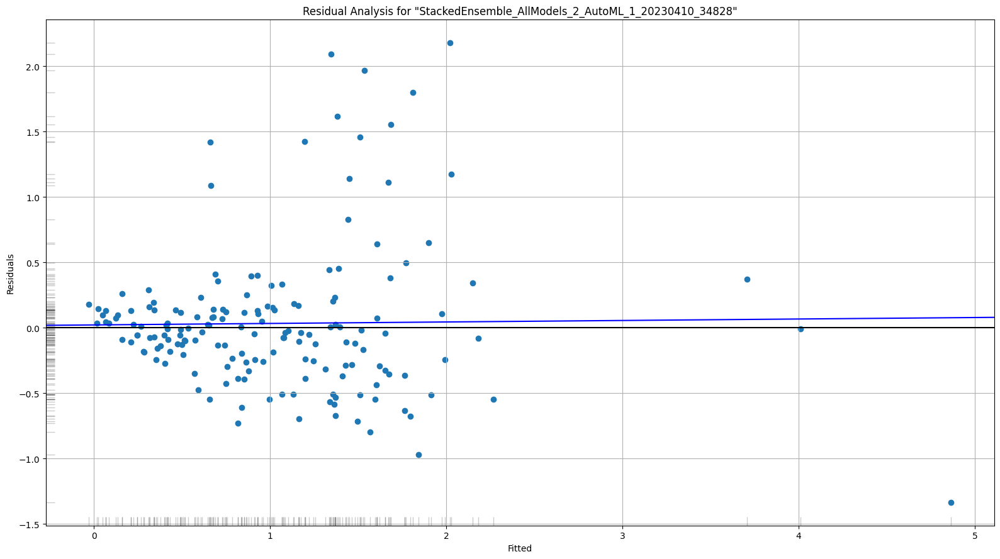

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

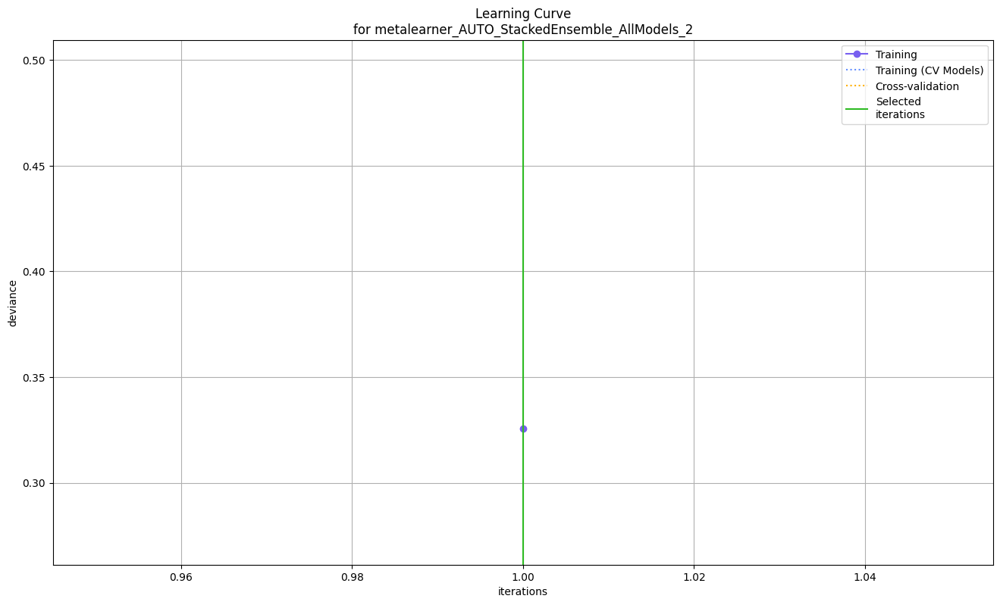

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

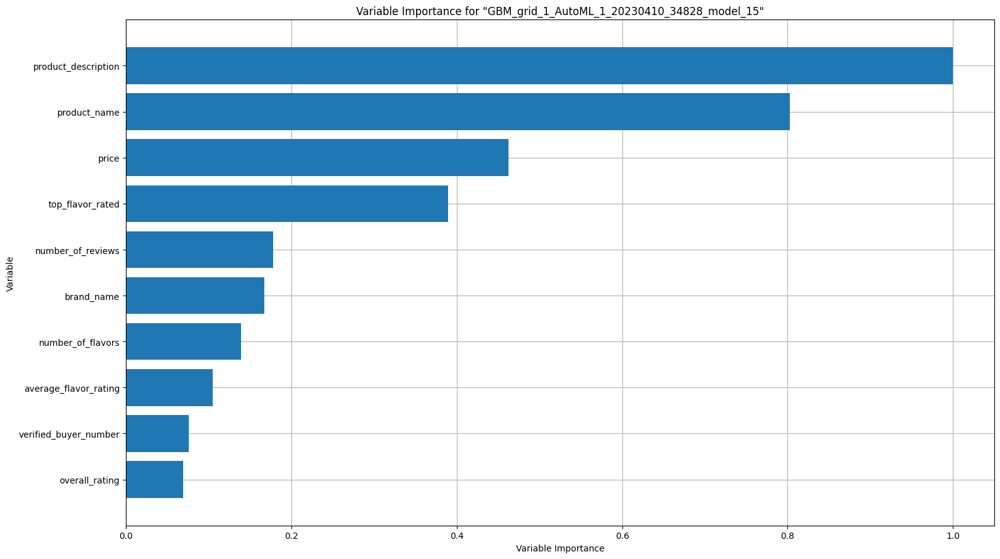

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

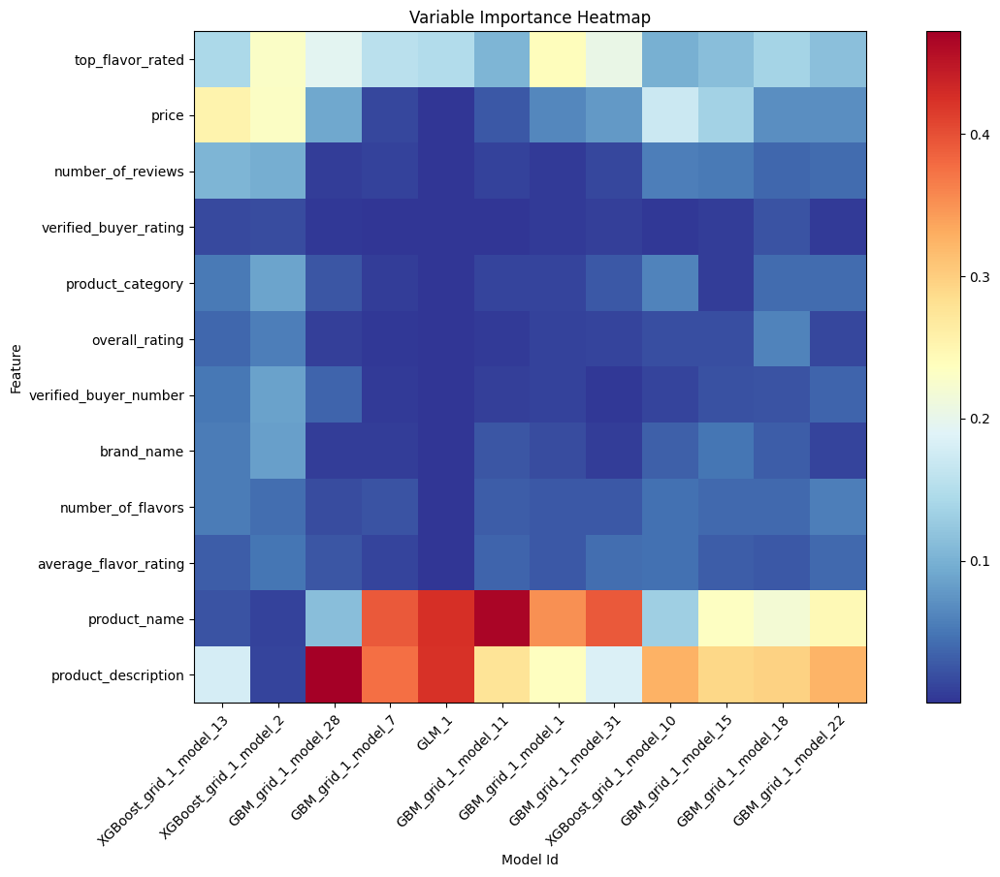

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

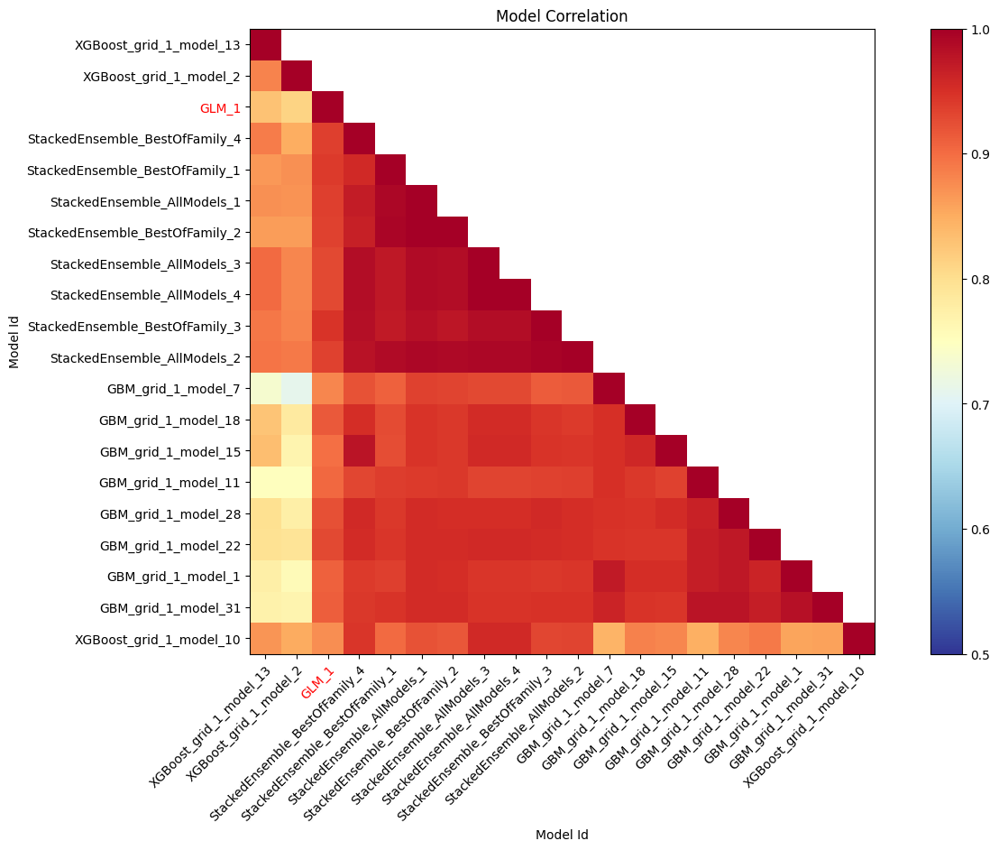

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

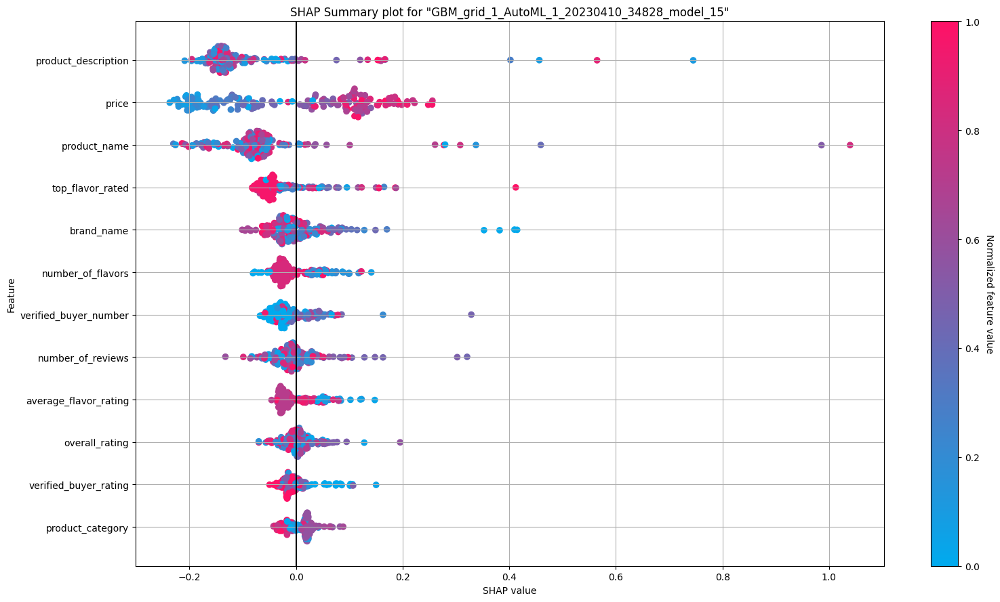

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

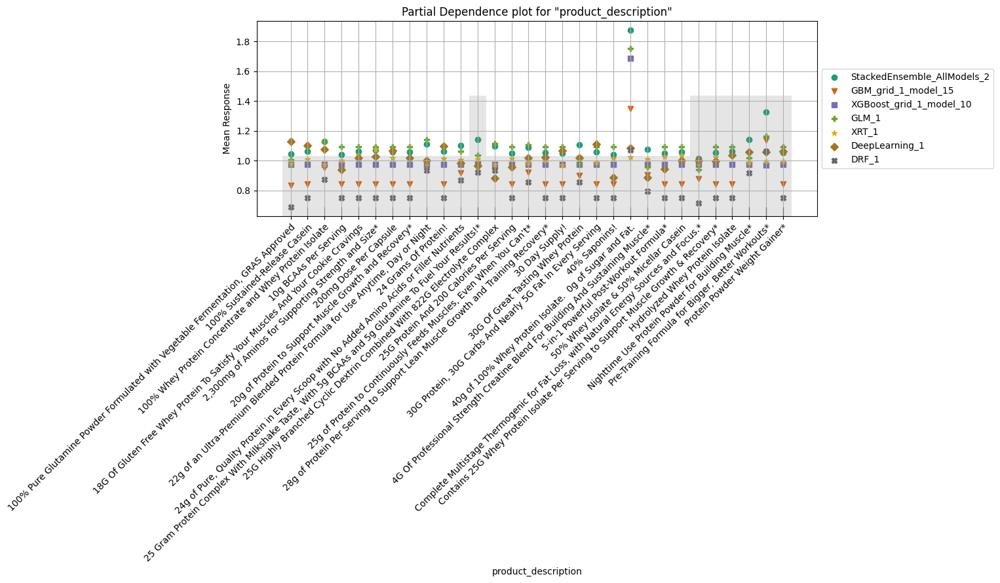

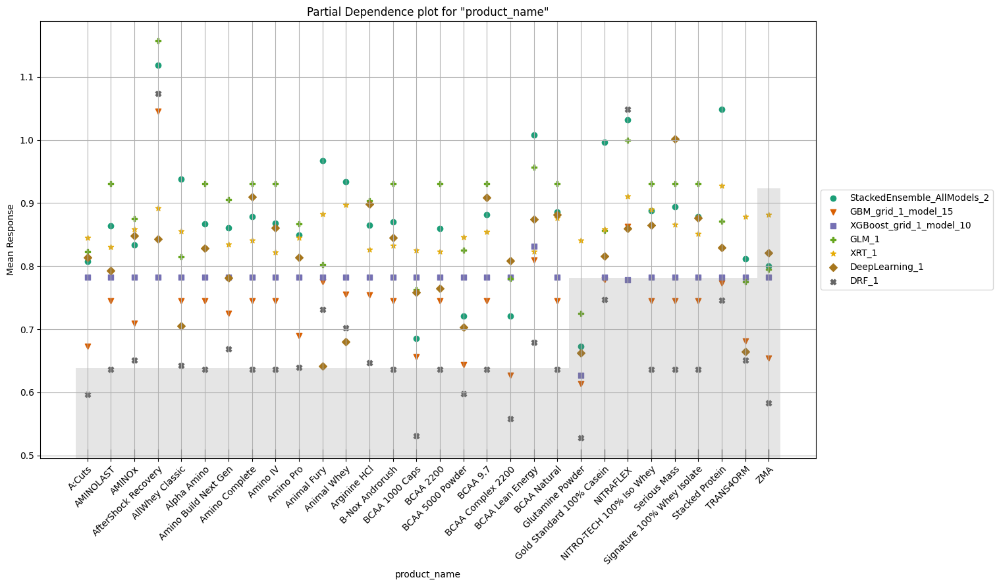

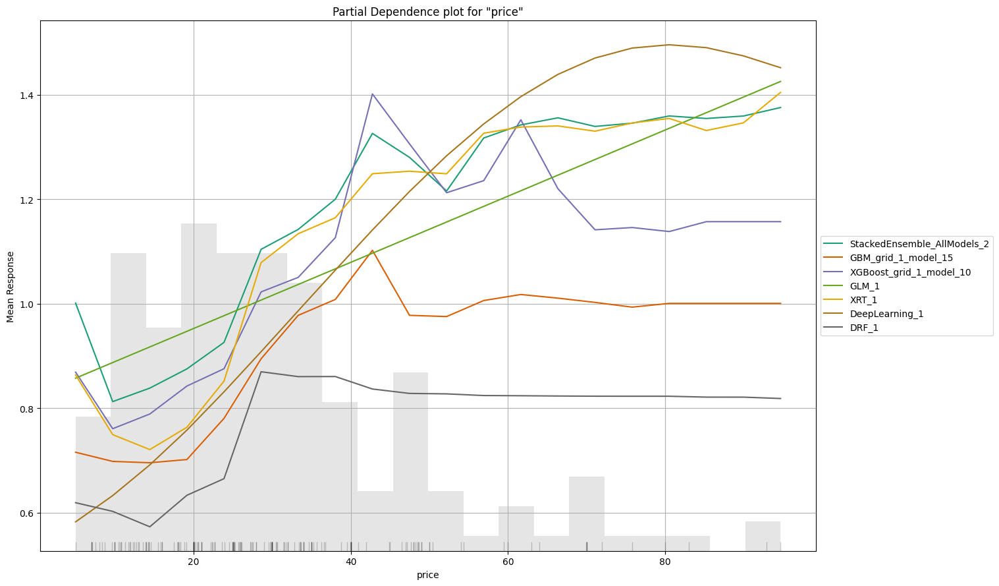

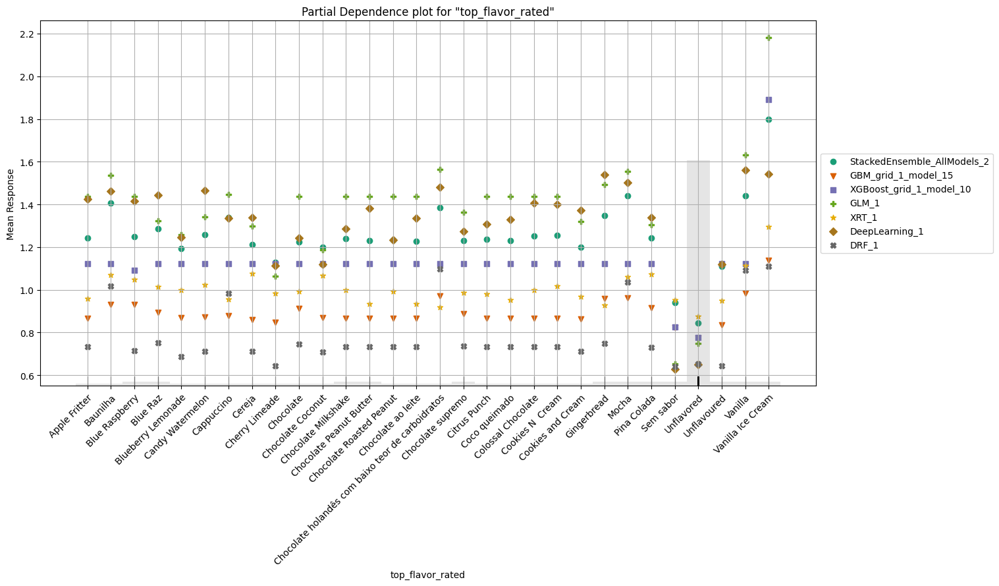

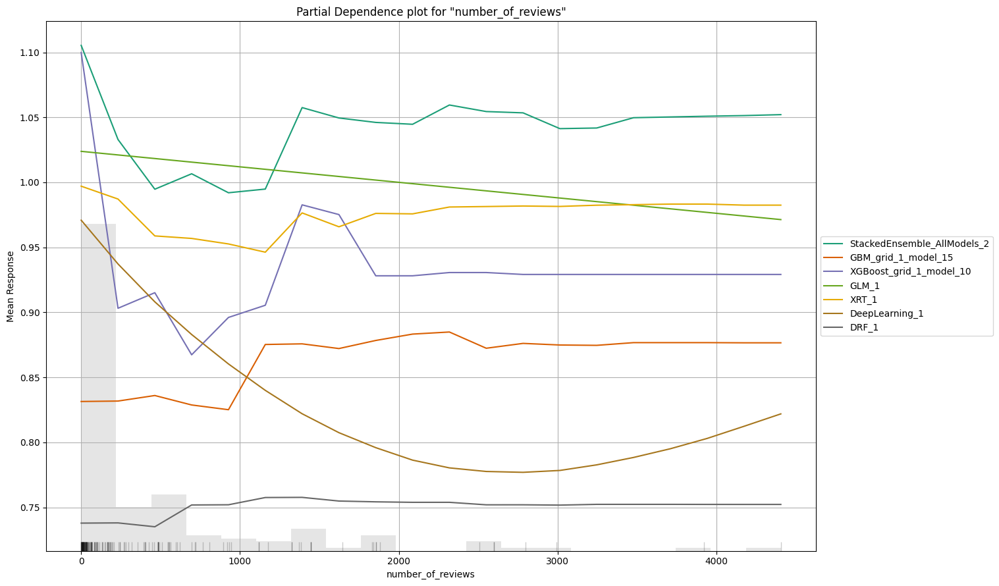

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

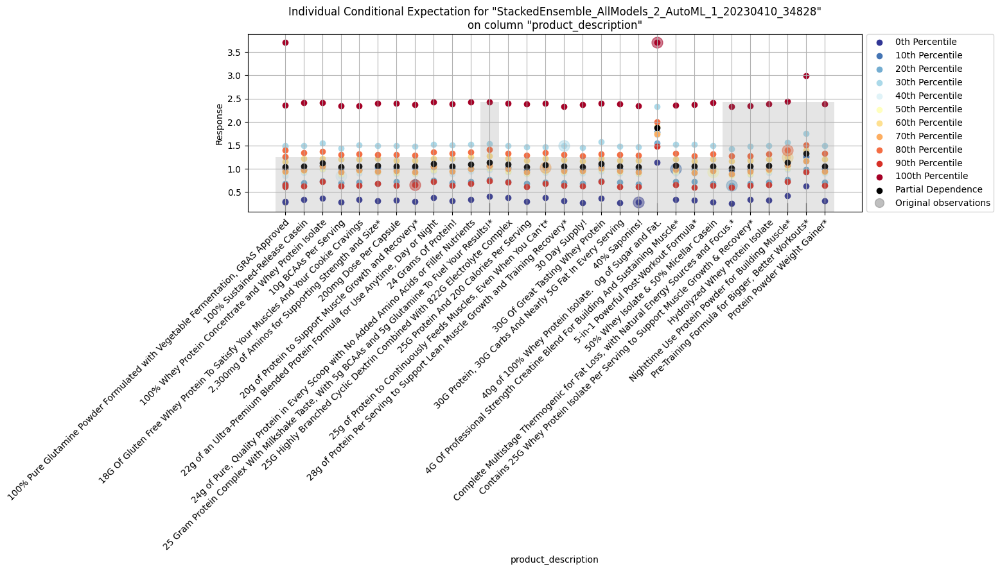

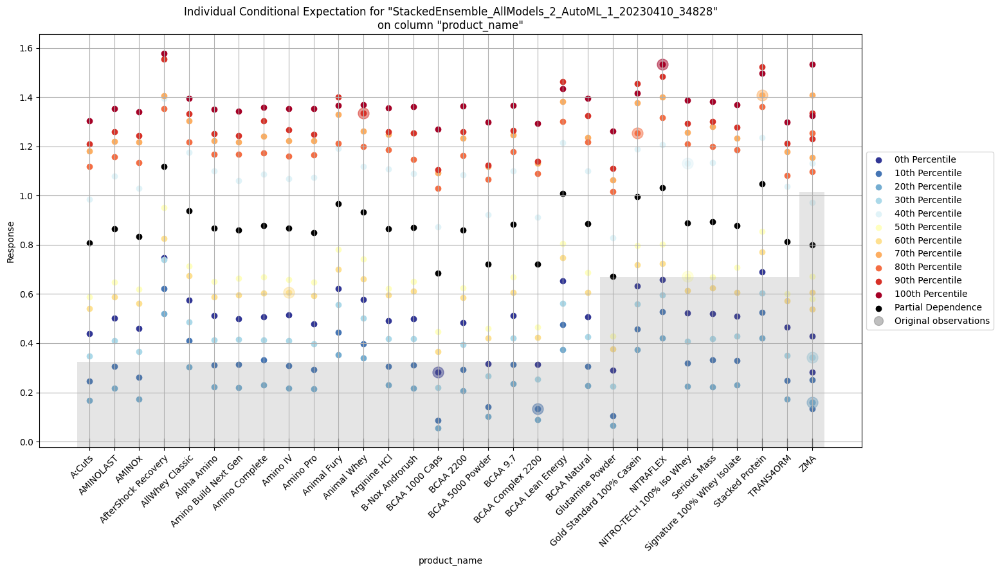

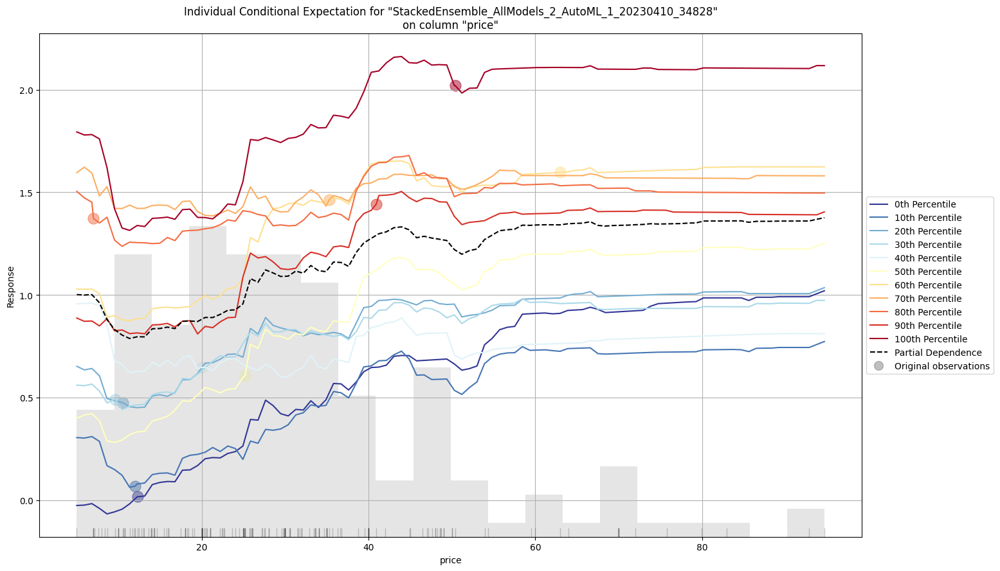

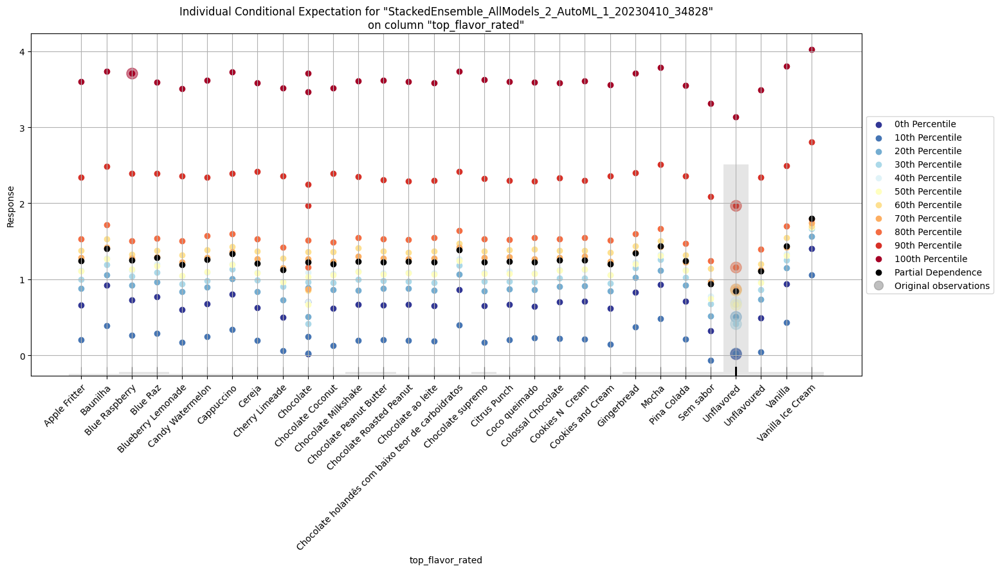

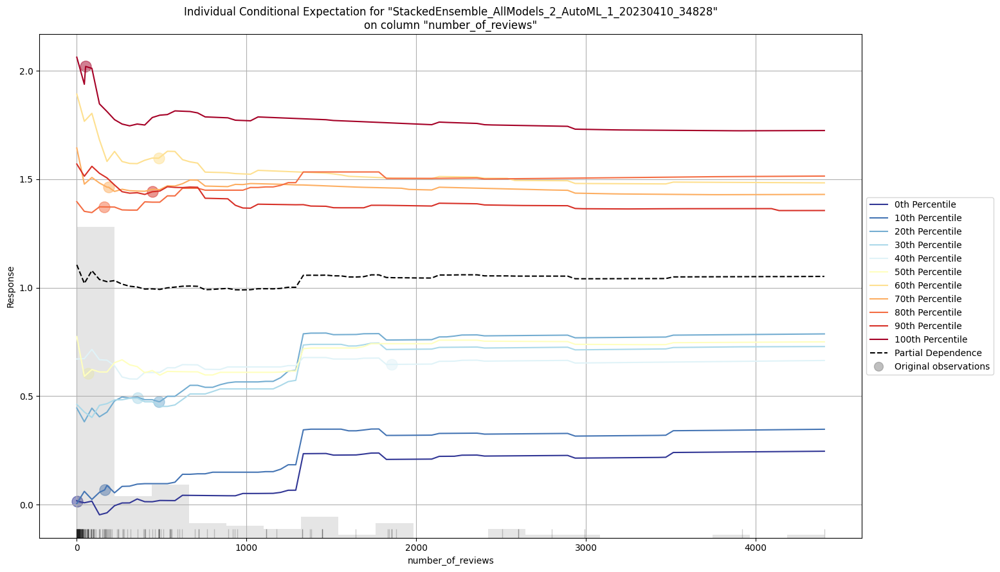

In [99]:
exa = aml.explain(df_test)

## **Interpreting Best Model from AutoML**

**Residual Analysis**

* Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the below graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

**SHAP Summary**
From the SHAP summary diagram, we can interpret a few conclusions -

1. All the features are listed as per their importance in making the prediction, that is alcohol is more significant followed by volatile_acidity, and so on. Hence, free_sulphur_dioxide is the least significant predictor in our model.

2. The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see Alcohol has the most impact on the quality of the wine. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. i.e. - Hight amount of alcohol results in high quality of wine, a low amount of volatile acidity results in high quality of wine, and so on. As we can see the distribution of red points in the Alcohol feature is far more spread than the blue points. From this visual, we can interpret that the quality of wine vastly increases as the amount of alcohol increases. It doesn't have much impact if the content is low i.e. between the shap value of 0.4 to 0.6 the blue data points are pretty concentrated. Inversely for the Volatile Acidity, less is better for the quality of the wine. Let us analyze the distribution of SHAP values of this feature. As seen in the SHAP plot we can see that extreme values on both ends can have a significant effect on the quality of the wine.
The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.

**Partial Dependence Plot (PDP)**

A partial dependence plot shows the marginal effect of a feature on the target(wine quality in our dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

For Interpretation purposes, let us pick up the two most important variables - Alcohol and Sulphate.

As we can see that when the rest of the variables are kept constant and a
marginal change is made in alcohol, we can see the mean response increases between alcohol levels of 11 and 12. This could be interpreted as this range of alcohol could be the deciding factor in the quality of the wine. 2. Similarly when the rest of the variables are kept constant and a marginal change is made in sulfate we can observe the mean response of quality going up between the sulfate range of 0.4 to 0.8. Hence, it can be interpreted that this range is deciding factor in the quality of the wine.

The computation of partial dependence plots is intuitive: The partial dependence function at a particular feature value represents the average prediction if we force all data points to assume that feature value.

**ICE (Individual Conditional Expectation) Plot**

ICE plot is similar to what we did in the PDP plot, but the fundamental difference between the two methods is that the PDP plot focuses on the average effect of a feature and does not focus on a specific instance. ICE plot comes in rescue to address this drawback of the PDP plot where the outputs from all instances are considered instead of an average value.

Let us go back to the alcohol and sulfate features, as we interpreted in PDP the quality of wine increases when alcohol and sulfate value is between 11 to 12 and 0.4 to 0.8 respectively. But is this true for every wine in the dataset? ICE plot has an answer to this question. As we can see in the ICE plot above the quality of a few wines(0th percentile instance) increases a lot in this range while the quality of a few doesn't change much(100th Percentile Instance).

Individual conditional expectation curves are even more intuitive to understand than partial dependence plots. One line represents the predictions for one instance if we vary the feature of interest.

In [100]:
import statsmodels.formula.api as smf  # OLS model Library

In [101]:
import h2o

pandas_df = h2o.as_list(df)

In [102]:
results = smf.ols("price_per_serving ~ average_flavor_rating + brand_name + number_of_flavors + number_of_reviews + overall_rating + price + verified_buyer_rating",
                  data=pandas_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      price_per_serving   R-squared:                       0.157
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     22.22
Date:                Mon, 10 Apr 2023   Prob (F-statistic):           1.19e-27
Time:                        03:55:41   Log-Likelihood:                -995.04
No. Observations:                 840   AIC:                             2006.
Df Residuals:                     832   BIC:                             2044.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 1.1437      0.438      2.611      0.009       0.284       2.003
average_flavor_rating    -0.0711      0.049     -1.438      0.151      -0.168       0.026
brand_name               -0.0017      0.001     -1.491      0.136      -0.004       0.001
number_of_flavors         0.0075      0.008      1.003      0.316      -0.007       0.022
number_of_reviews     -5.807e-05   3.22e-05     -1.802      0.072      -0.000    5.18e-06
overall_rating            0.0122      0.044      0.278      0.781      -0.074       0.098
price                     0.0188      0.002     11.667      0.000       0.016       0.022
verified_buyer_rating    -0.0152      0.013     -1.179      0.239      -0.041       0.010
==============================================================================
Omnibus:                      462.046   Durbin-Watson:                   1.927
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4969.571
Skew:                           2.281   Prob(JB):                         0.00
Kurtosis:                      14.008   Cond. No.                     1.94e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.94e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# **Hyperparameter Tuning**

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset.

**Hyperparameter Tuning - Random Grid Search on GBM Model**

In [103]:
train, validate, test = np.split(
    pandas_df.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [104]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [105]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [106]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [107]:
gbm_grid2.train(
    x=X, y=y, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.1,0.08,3.0,0.8,gbm_grid2_model_13,0.4408120
,0.1,0.06,8.0,0.9,gbm_grid2_model_34,0.4564266
,0.1,0.07,7.0,0.8,gbm_grid2_model_9,0.4583383
,0.2,0.04,5.0,0.9,gbm_grid2_model_29,0.4697266
,0.2,0.02,10.0,0.5,gbm_grid2_model_25,0.4905686
,0.1,0.02,9.0,0.8,gbm_grid2_model_16,0.4910305
,0.5,0.03,2.0,0.6000000,gbm_grid2_model_26,0.5258845
,0.5,0.05,2.0,0.8,gbm_grid2_model_27,0.5354272
,0.4,0.08,6.0,0.9,gbm_grid2_model_28,0.5361824
,0.3000000,0.02,2.0,1.0,gbm_grid2_model_20,0.5364383


In [108]:
gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False)

In [109]:
gbm_gridperf2

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.1,0.08,3.0,0.8,gbm_grid2_model_13,0.4408120
,0.1,0.06,8.0,0.9,gbm_grid2_model_34,0.4564266
,0.1,0.07,7.0,0.8,gbm_grid2_model_9,0.4583383
,0.2,0.04,5.0,0.9,gbm_grid2_model_29,0.4697266
,0.2,0.02,10.0,0.5,gbm_grid2_model_25,0.4905686
,0.1,0.02,9.0,0.8,gbm_grid2_model_16,0.4910305
,0.5,0.03,2.0,0.6000000,gbm_grid2_model_26,0.5258845
,0.5,0.05,2.0,0.8,gbm_grid2_model_27,0.5354272
,0.4,0.08,6.0,0.9,gbm_grid2_model_28,0.5361824
,0.3000000,0.02,2.0,1.0,gbm_grid2_model_20,0.5364383


In [110]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf2.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [111]:
models = gbm_gridperf2.models

In [112]:
list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [113]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

In [114]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)

In [115]:
print(hyperparameters_dataframe)

    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0               0.1        0.08          3          0.8           0.440812
1               0.1        0.06          8          0.9           0.456427
2               0.1        0.07          7          0.8           0.458338
3               0.2        0.04          5          0.9           0.469727
4               0.2        0.02         10          0.5           0.490569
5               0.1        0.02          9          0.8           0.491030
6               0.5        0.03          2          0.6           0.525884
7               0.5        0.05          2          0.8           0.535427
8               0.4        0.08          6          0.9           0.536182
9               0.3        0.02          2          1.0           0.536438
10              0.6        0.09          2          0.8           0.544178
11              0.3        0.03          8          1.0           0.547539
12              0.5      

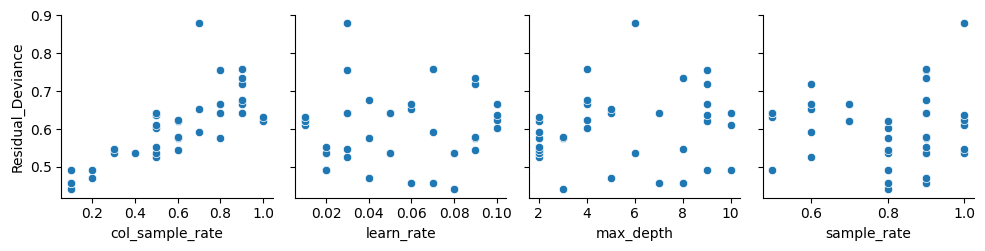

In [116]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

In [117]:
#h2o.cluster().shutdown()

**Hyperparameter Tuning Analysis**


* This is a summary of hyperparameter tuning for an XGBoost model, which involved a grid search over a range of values for four hyperparameters: col_sample_rate, learn_rate, max_depth, and sample_rate. The search resulted in a total of 36 combinations of hyperparameters, and for each combination, the Residual Deviance was calculated as an evaluation metric.

* Based on the results, the hyperparameter combination with the lowest Residual Deviance was a model with col_sample_rate of 0.1, learn_rate of 0.07, max_depth of 7, and sample_rate of 0.8, with a Residual Deviance of 0.442. The next best models had Residual Deviances in the range of 0.446-0.476, while the worst-performing models had Residual Deviances above 0.505.

* Overall, the results suggest that the combination of col_sample_rate, learn_rate, max_depth, and sample_rate can have a significant impact on the performance of an XGBoost model, and that hyperparameter tuning can lead to significant improvements in model performance.

Important Hyperparameters:

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset. For this model tuning is performed using Randon Grid Search. The best hyperparameters for this model are:- 'col_sample_rate':0.1,'learn_rate':0.07 'max_depth': 0.7, 'sample_rate': 8 and 'Residual_Deviance': 0.442

#SHAP Analysis for Linear and Tree-Based Models

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of average_flavor_rating
- For the linear model the cross is made at approx  E[f(x)] 1.02
- For Tree-based model the cross is made at approx E[f(x)] 1.06

So as the average_flavor_rating increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output. By plotting this we can see the difference between the model output from the expected value. 

In [118]:
#x_train['verified_buyer_number'] = x_train['verified_buyer_number'].astype(float)

In [119]:
x_train_100.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 561 to 574
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_flavor_rating  100 non-null    float64
 1   brand_name             100 non-null    int64  
 2   number_of_flavors      100 non-null    float64
 3   number_of_reviews      100 non-null    float64
 4   overall_rating         100 non-null    float64
 5   price                  100 non-null    float64
 6   verified_buyer_number  100 non-null    float64
 7   verified_buyer_rating  100 non-null    float64
dtypes: float64(7), int64(1)
memory usage: 7.0 KB


Exact explainer: 757it [00:11,  9.30it/s]                         


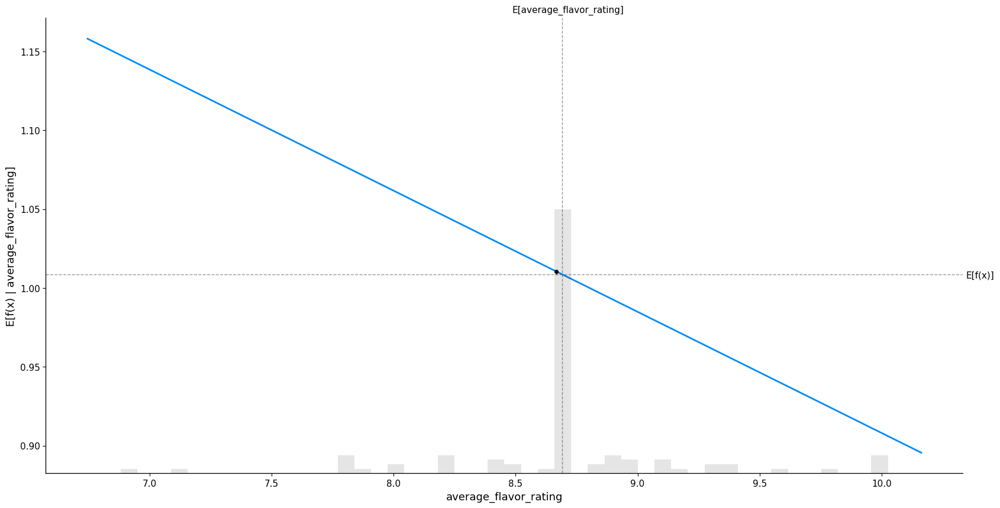

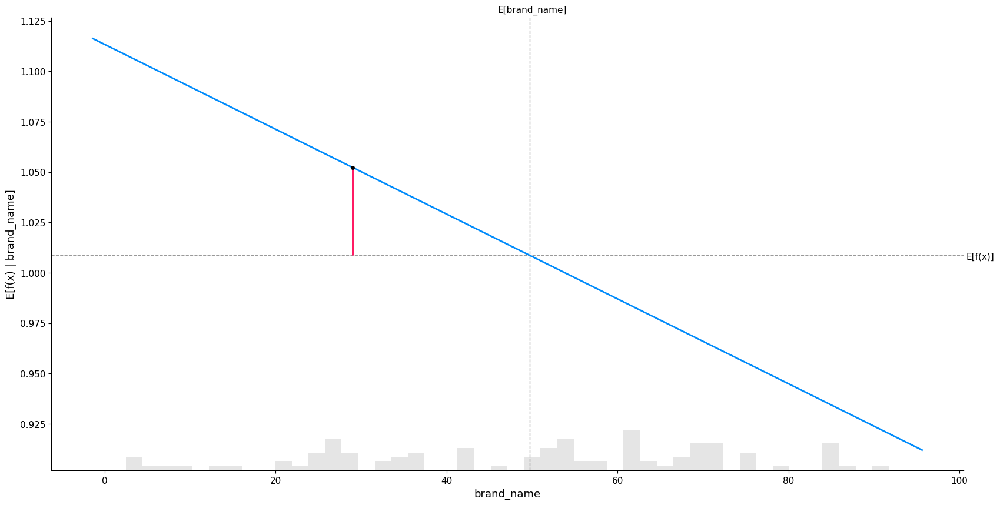

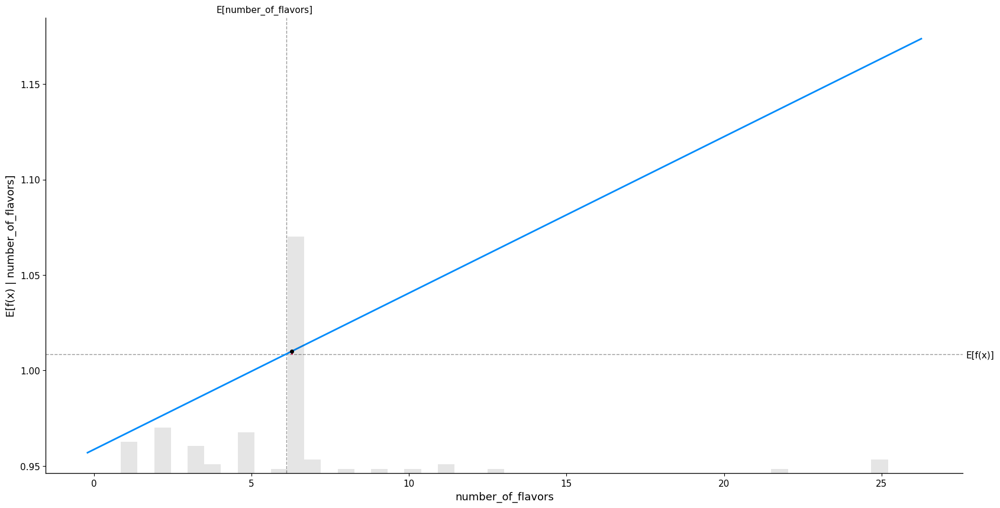

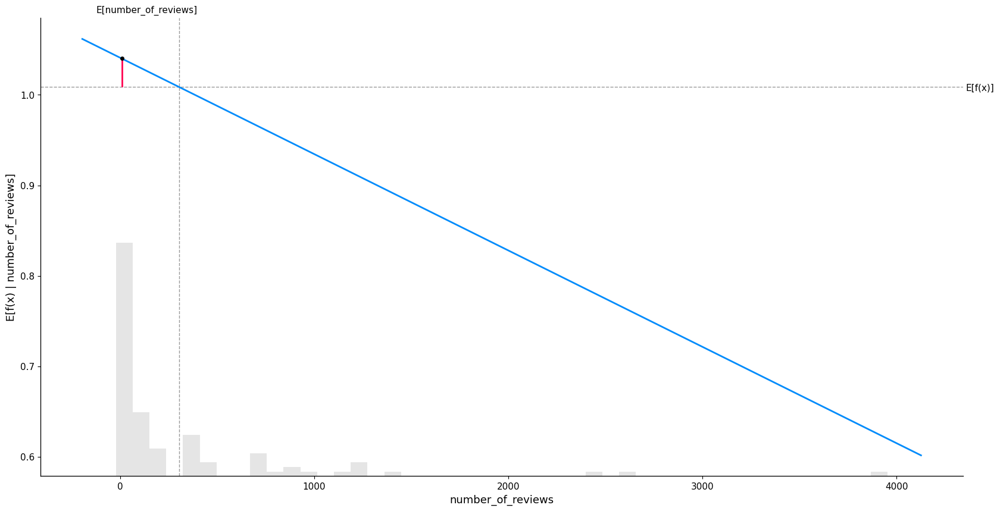

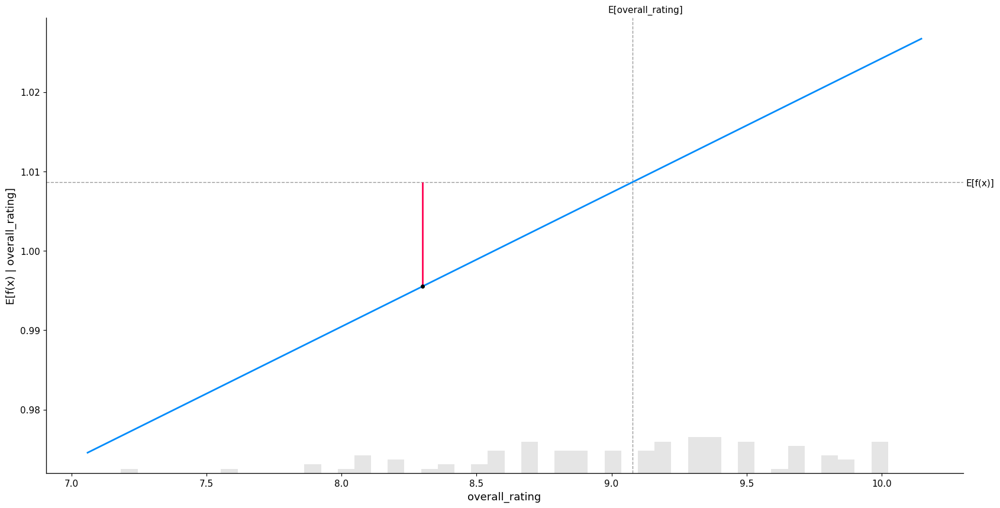

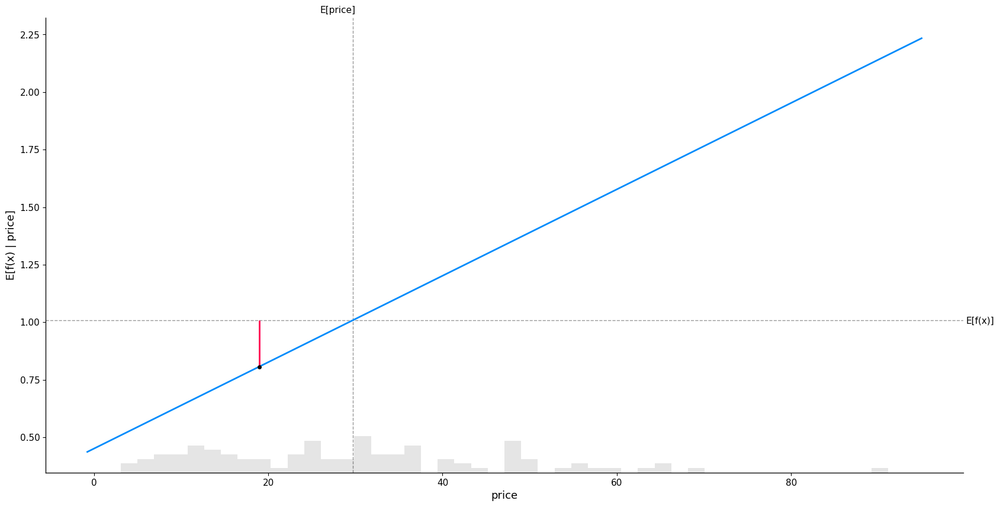

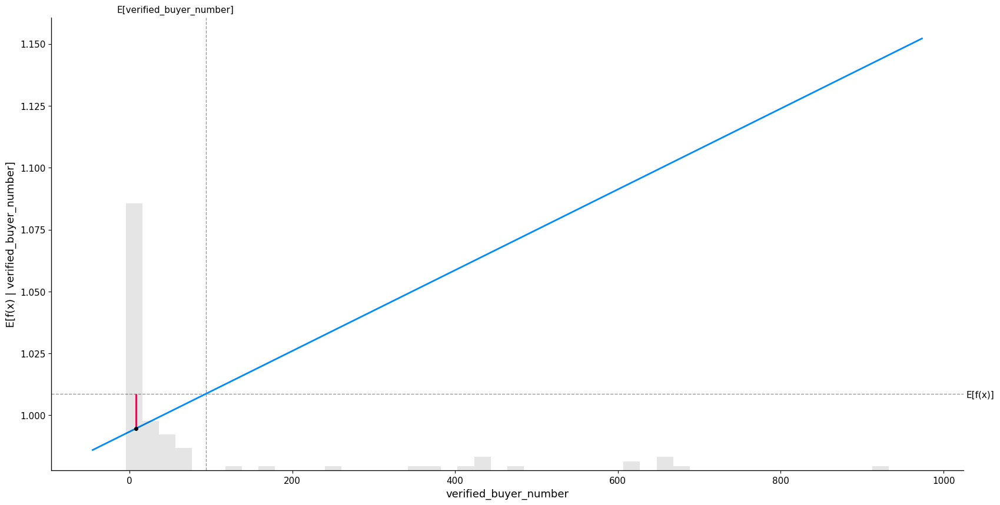

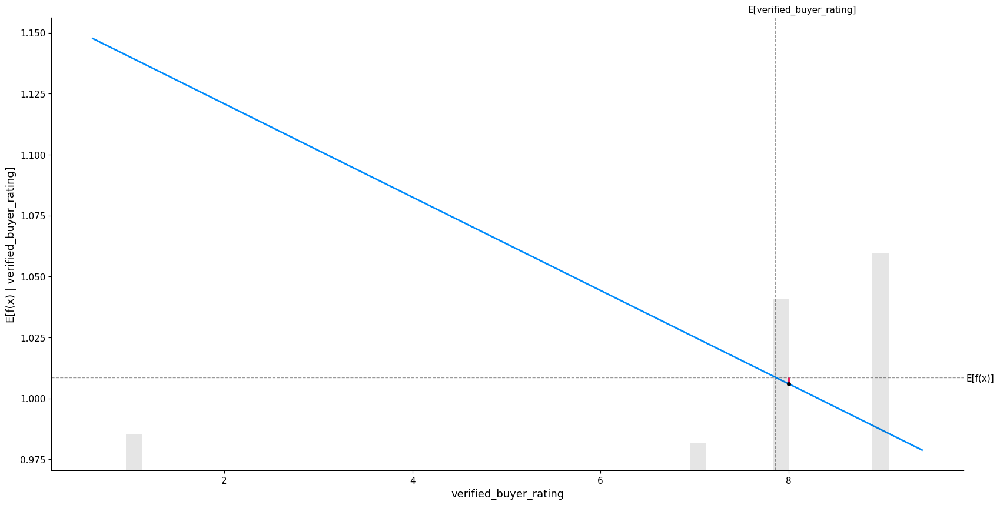

In [120]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )



SHAP Values - Tree Based Model

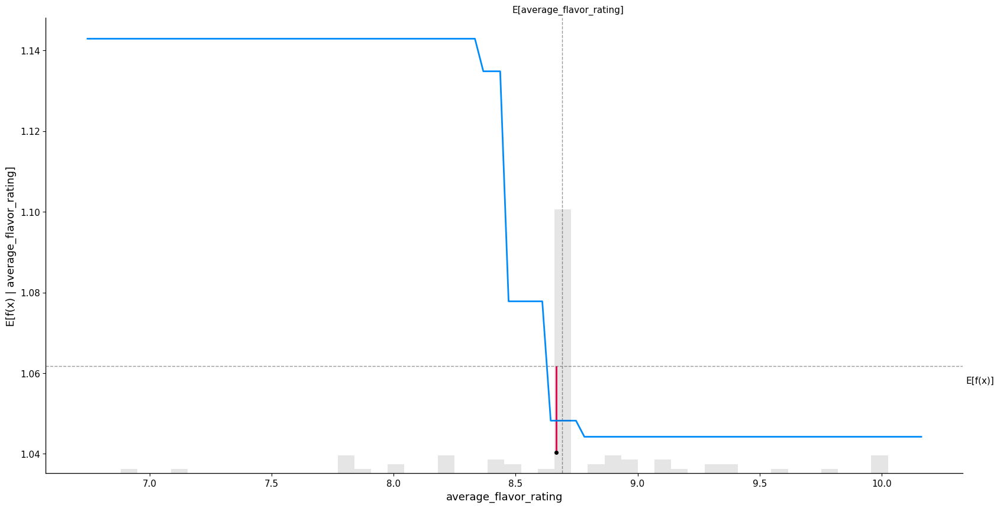

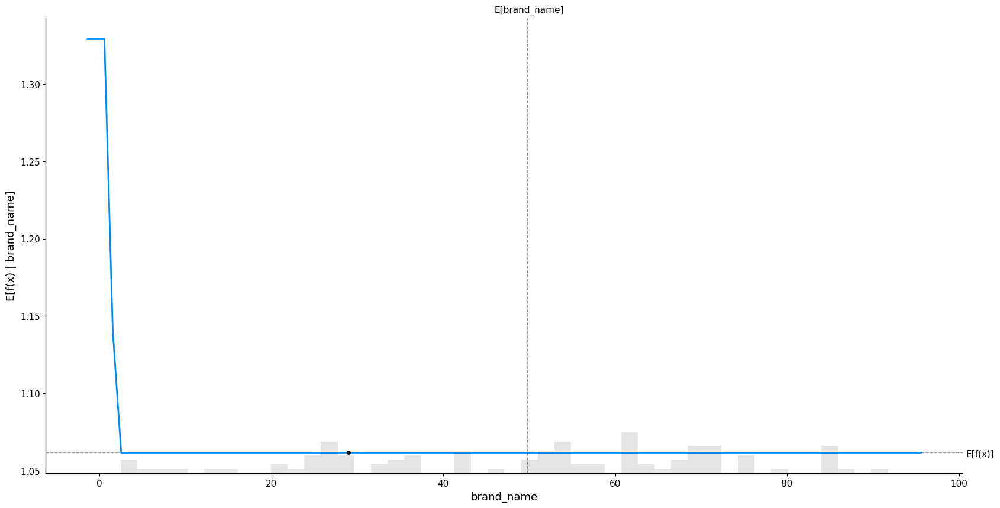

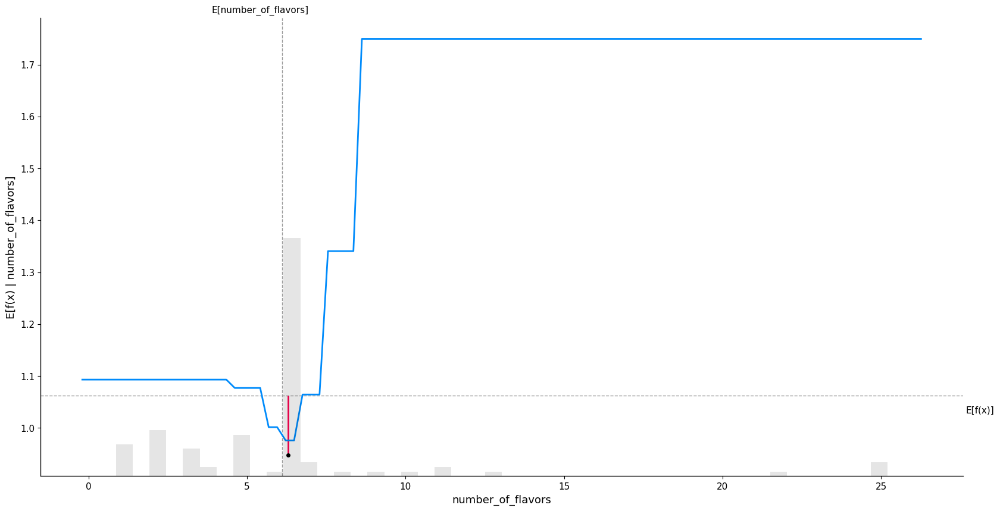

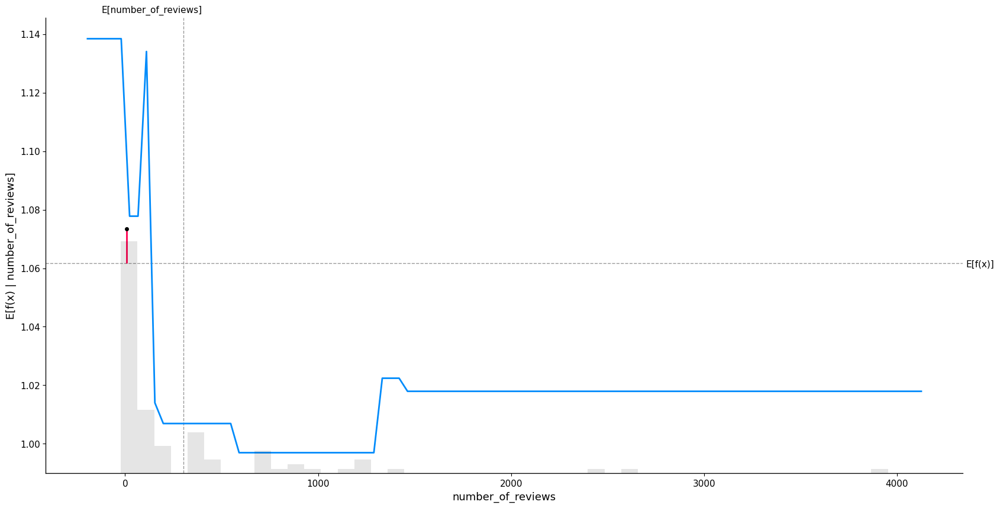

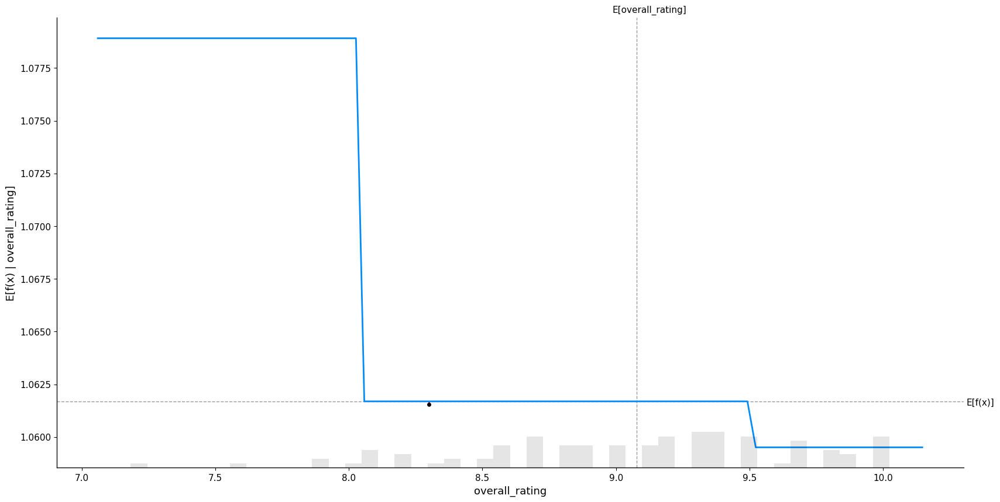

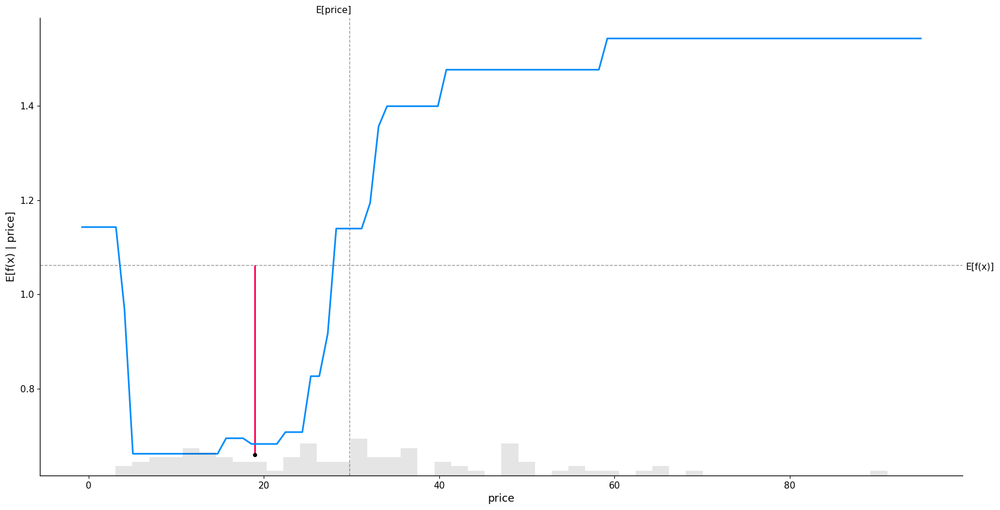

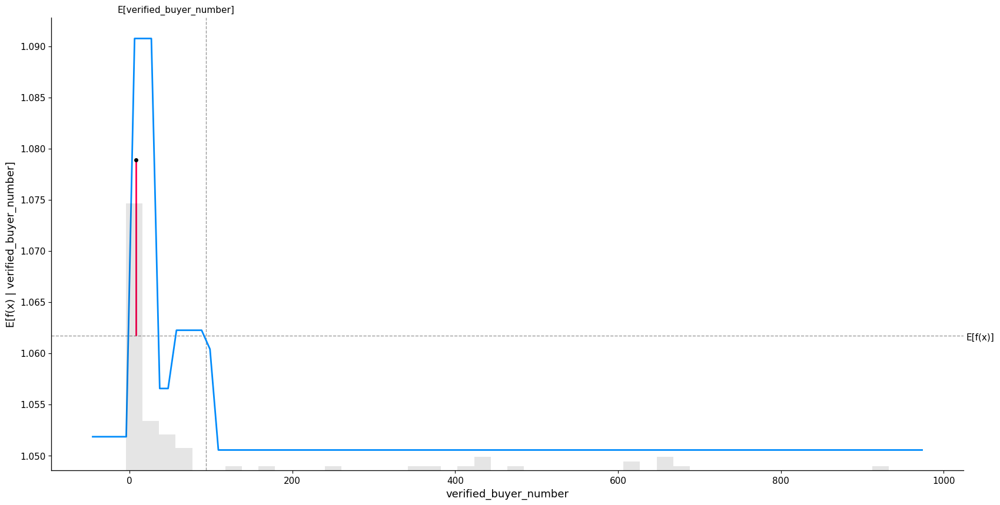

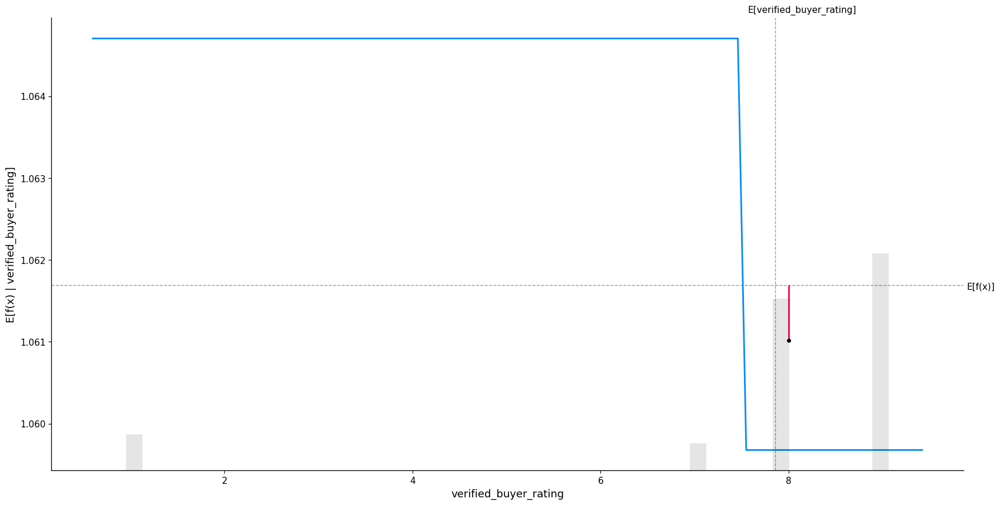

In [121]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

##Interpreting SHAP Feature Importance Plot for Linear and Tree-based model
The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are 

1.   SHAP feature importance for a linear model
2.   SHAP feature importance for tree-based model

As we can see below in the plots, there is a difference in feature importance for both the models
- For the linear model, number_of_reviews is the second most important feature but for our tree-based model number_of_flavors is the second most important feature when we consider the average of SHAP values to calculate feature importance.




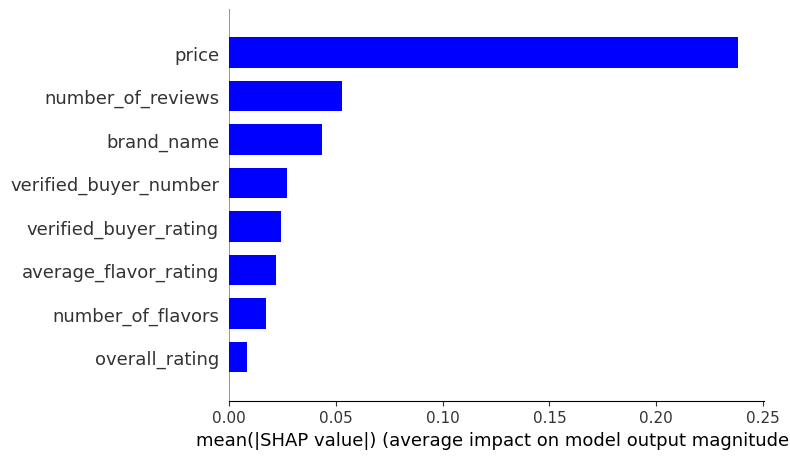

In [122]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

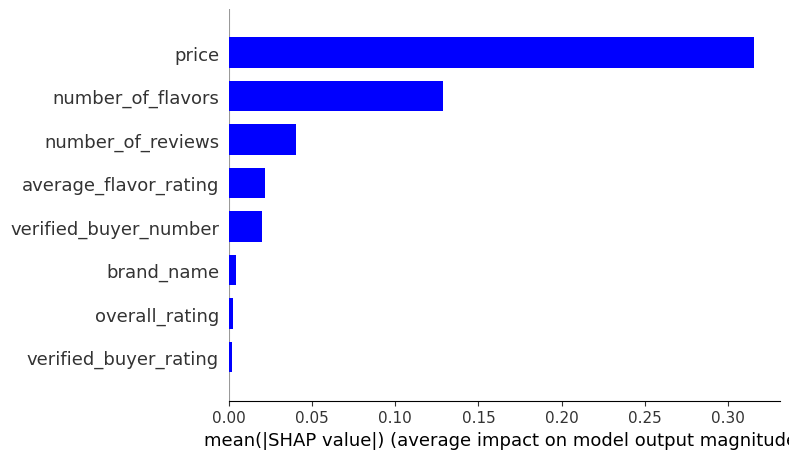

In [123]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

##Interpreting Waterfall SHAP visualization

1. Let's consider the same sample (sample_ind = 18)
Notice the value of price in the waterfall model is the same as what we have in SHAP partial dependence plot. It says that **f(x) = 0.85 is what we got as a model output** and the **expected output for this sample was 0.98**. We came pretty close to determining it as the **difference is only 0.13**. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that price has the biggest and most positive impact in **increasing the price per serving by 0.13** for this specific sample. Followed by price had a negative impact and it bought the **price per serving down by 0.2** for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 0.855.

2. Similarly we can interpret the tree-based model for the same sample.
Where the **output we got was 0.553 and the expected output was 0.98.**
in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is majorly determined by only three features - price, brand_name, number_of_reviews whereas in the tree model price, number_of_flavors, average_flavor-rating, verified_buyer_rating, verified_buyer_number these features had maximum impact.




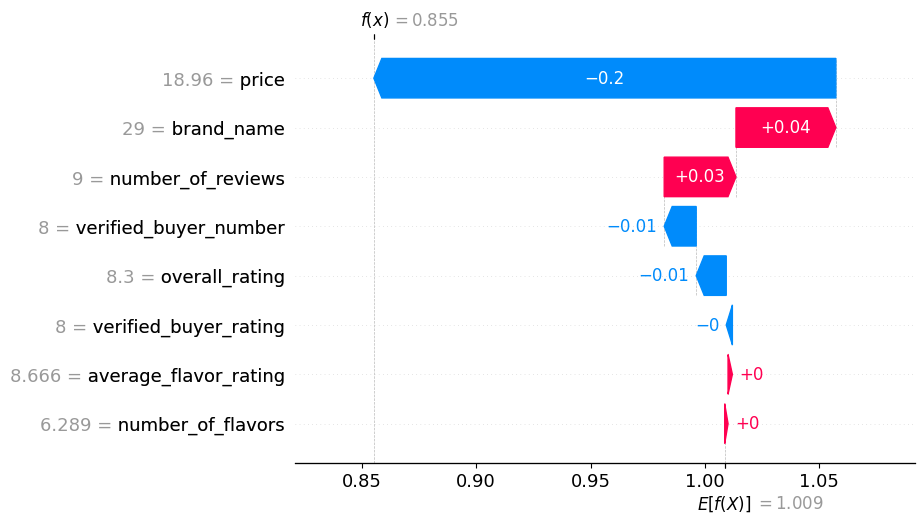

In [124]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

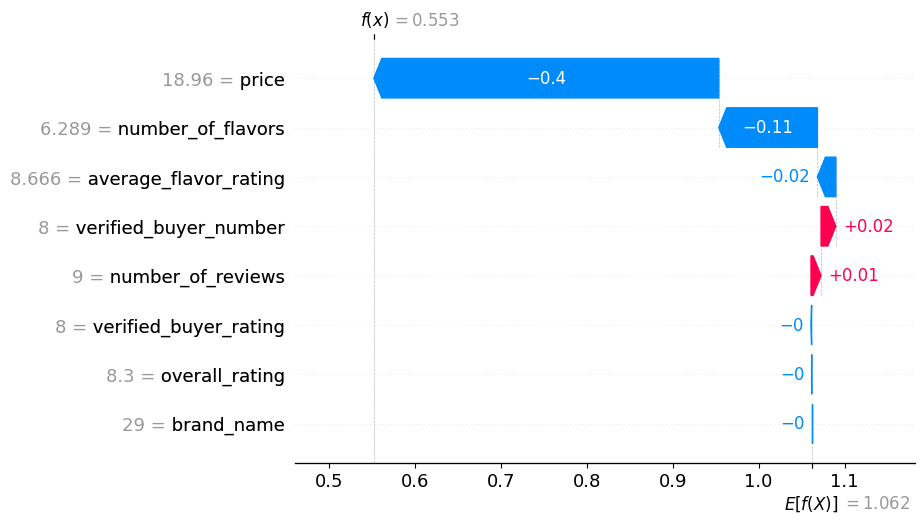

In [125]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

##Interpret the summary plot for the Linear and Tree-based model
Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent. 

1. Each dot(both red and blue) represents a feature of a supplement
2. Red color represents high values whereas blue color represents low value
3. If a dot(a feature of supplement) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
4. The position of a dot(a feature of supplement) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

Let us try to understand how both models are performing side by side

*   Higher the price tends to have a positive impact on the price per serving of supplement
*   Lower values of number_of_reviews tend to have a positive impact on the price per serving of supplement.
*  Higher values of verified_buyer_number tends to have a positive impact on price per serving of supplement , and so on.



This visualization is very useful when it comes to interpreting how our model is working.  

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


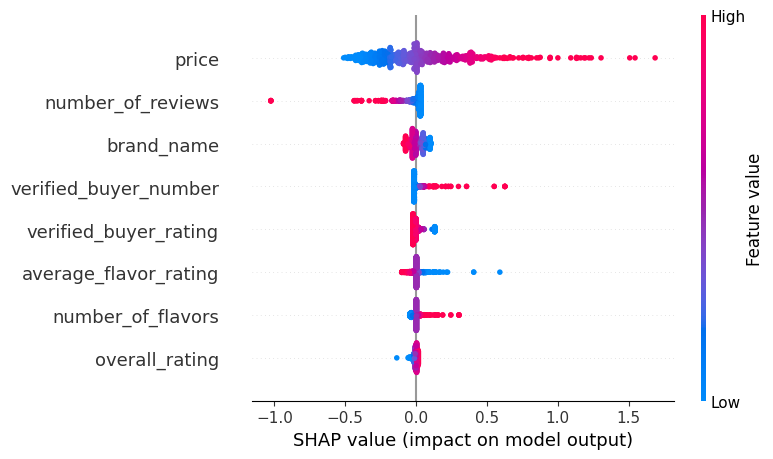

In [126]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

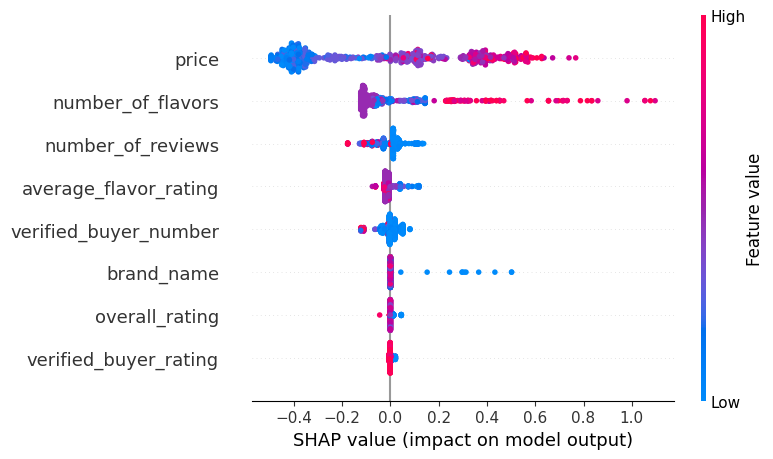

In [127]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

##Interpreting SHAP dependence plot for Linear and Tree-based model
The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every price per serving in our dataset. 

# **Linear Models**
* In linear models, the SHAP values for each feature are additive. This means that the SHAP value for a particular feature represents the contribution of that feature alone, while holding all other features constant.

* The SHAP dependence plot for linear models typically shows a straight line, which represents the linear relationship between the feature and the model's output. The slope of the line indicates the strength and direction of the relationship.

* If the line is horizontal, it means that the feature has little to no effect on the model's output. If the line is positively sloped, it means that increasing the feature value will increase the model's output. If the line is negatively sloped, it means that increasing the feature value will decrease the model's output.

# **Tree-based Models**
* In tree-based models, the SHAP values for each feature are not additive. Instead, they represent the contribution of a particular feature value relative to the baseline value (often the mean prediction of the model).
* The SHAP dependence plot for tree-based models typically shows a series of lines or curves, with each line or curve corresponding to a different feature value range. The plot shows how the SHAP value changes as the feature value changes within each range.
* The shape of the lines or curves in the SHAP dependence plot can indicate the nature of the relationship between the feature and the model's output. For example, a curve that starts low, increases rapidly, and then flattens out may indicate a nonlinear relationship between the feature and the model's output. A vertical line may indicate that the model is using a threshold to make a decision based on that feature.

**Example of SHAP dependence plot of Price per serving**


1.   In the linear model the relationship is linear between price per serving and its SHAP values. There is not much information to extract from these plots the only information which could be extracted is if the relationship is directly or inversely proportional. 
2.   In the tree-based model we could extract the information on how the price per serving is affected while being tuned the feature. It also reinforces the inference we got from the above PDP and ICE plot i.e. The price per serving in the range (20 - 60) changes drastically. 








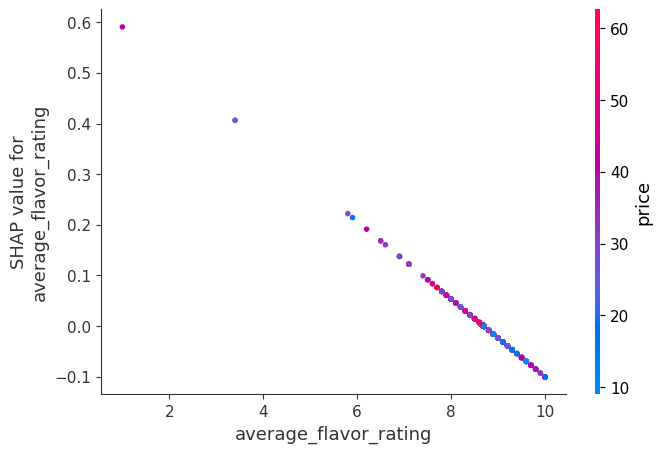

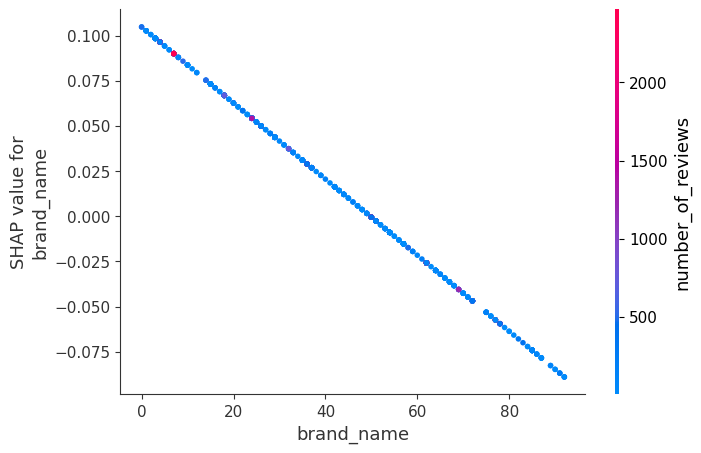

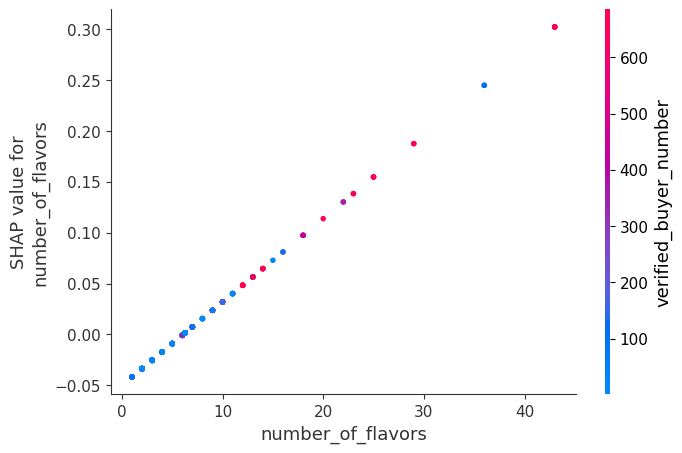

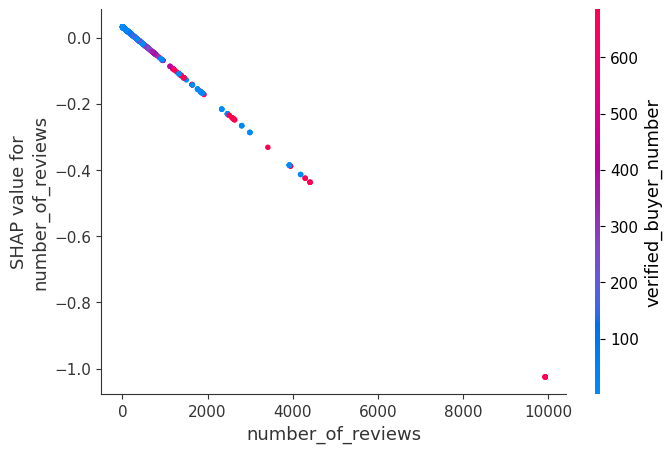

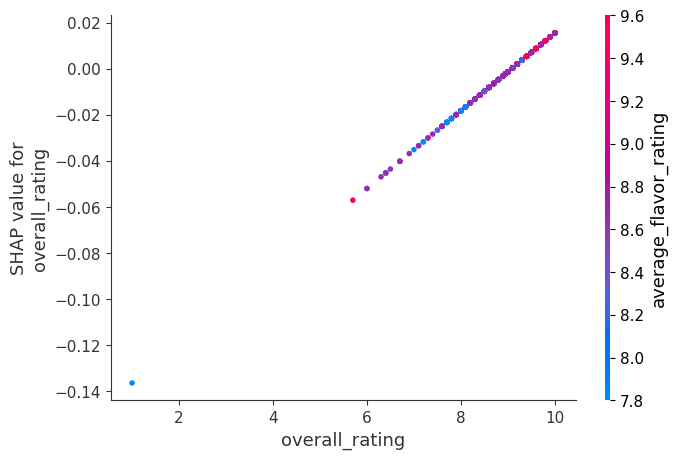

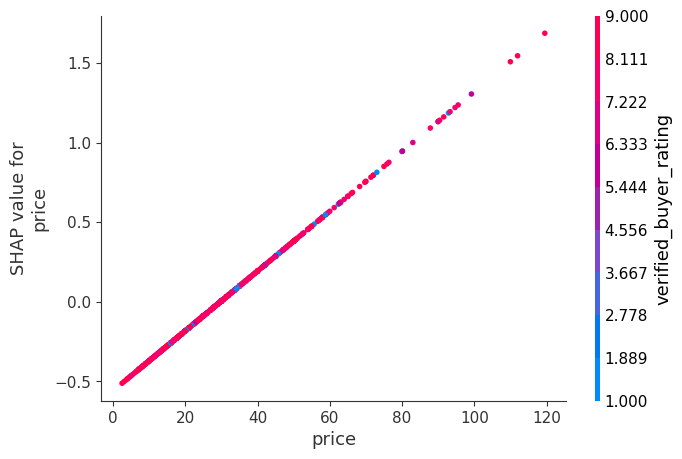

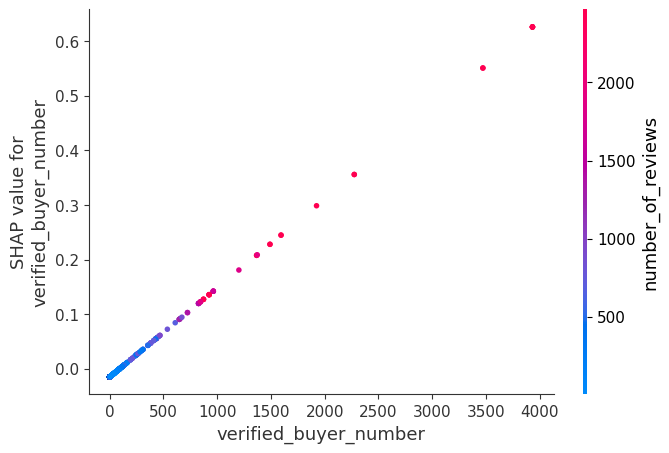

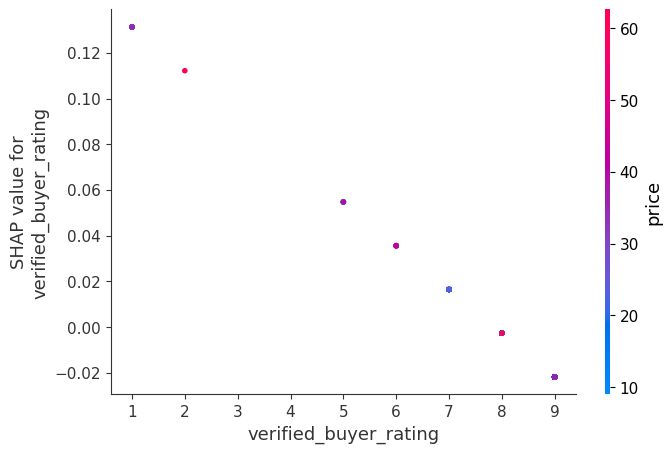

In [128]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

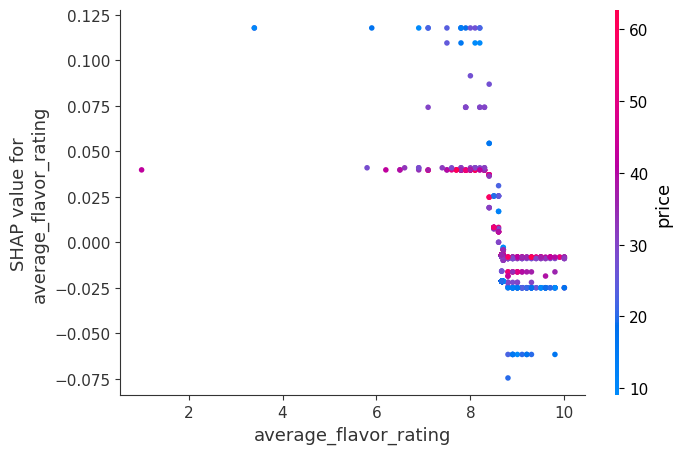

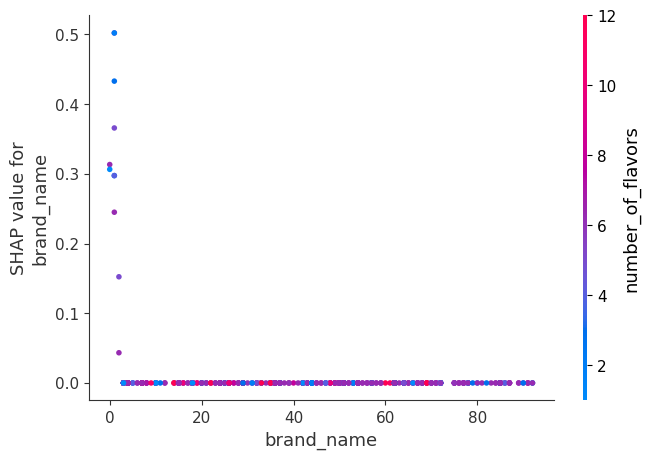

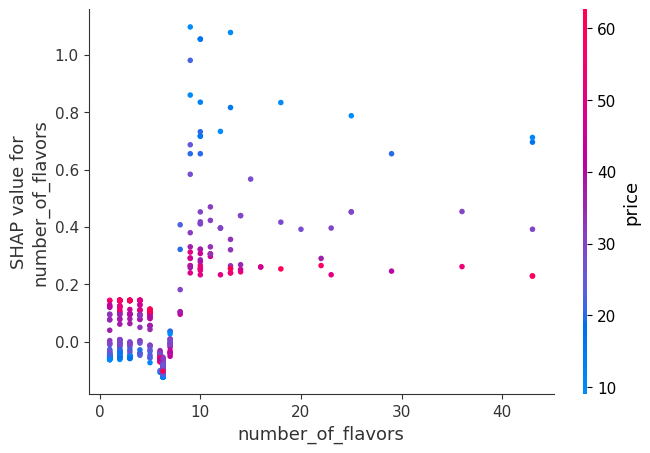

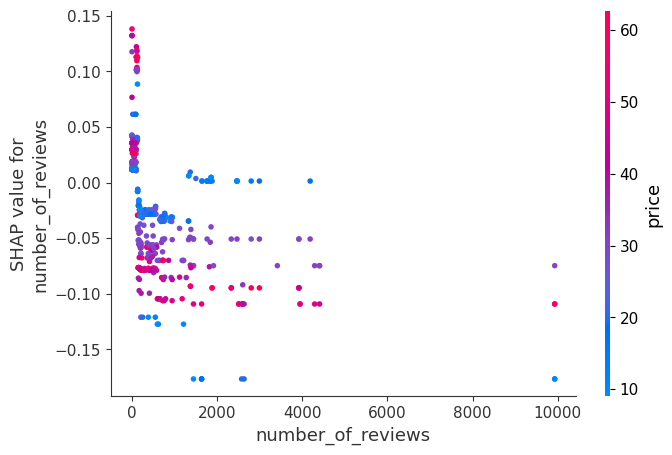

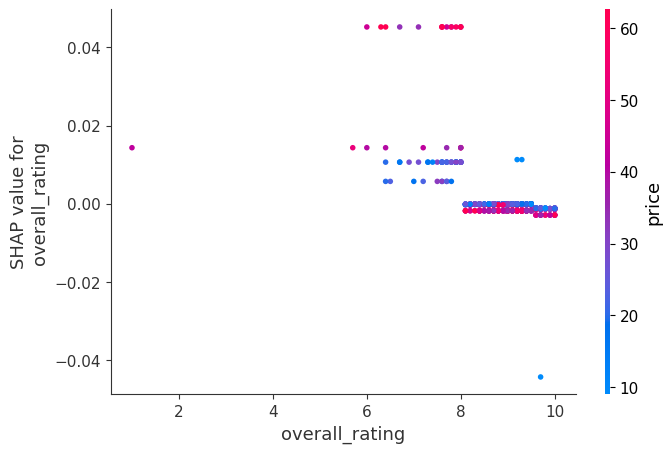

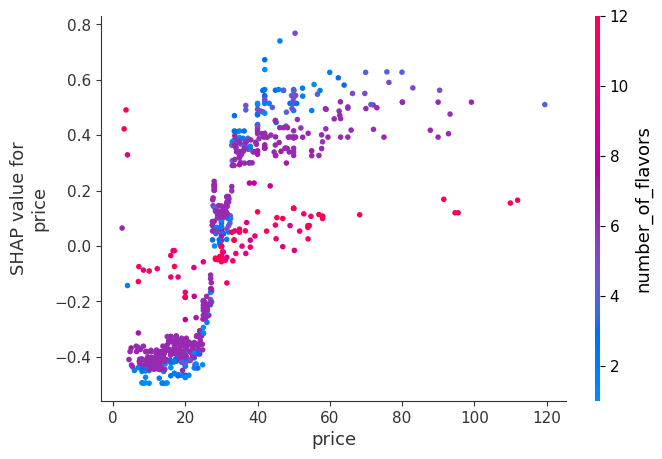

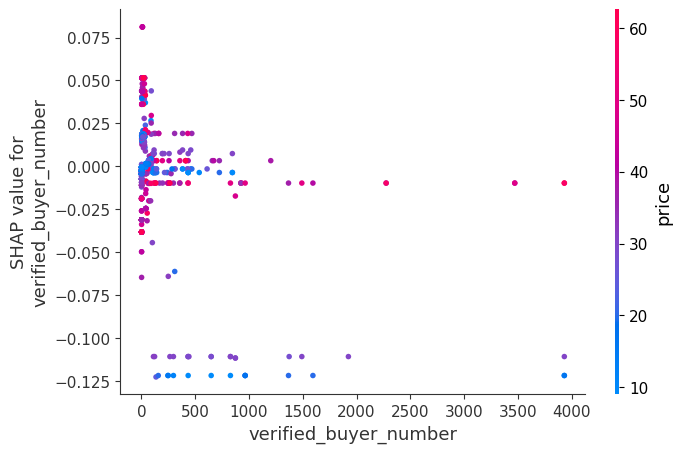

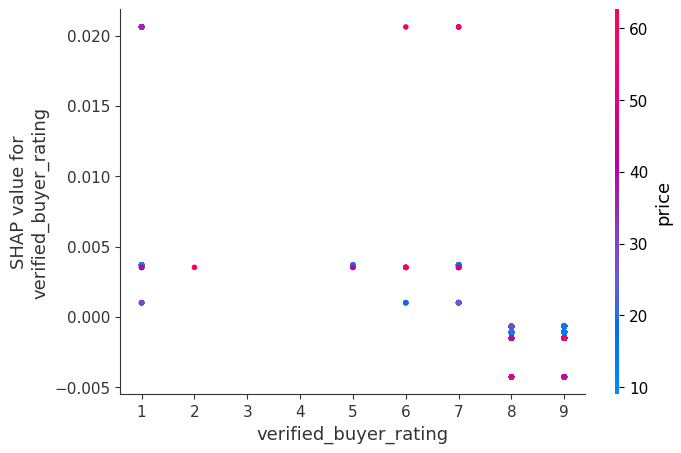

In [129]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [130]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

##Force Plot SHAP analysis
This plot is the same as the waterfall model which we saw above the only difference is the visualization is condensed. It is really up to an individual which visualization is preferred some find this easier to read others find the waterfall model easier to read

Let us consider one sample from the test set, Please refer to the Force Plot below 
- The output of the model is 0.55
- The features which had a significant positive impact on price per serving were price and number of flavors with 18.96 and 6.289 respectively
- The features which had a significant negative impact on price per serving were number_of_reviews, verified_buyer_number with 9 and 8 respectively

It gives us the same information which the waterfall model has to give

In [131]:

# Initializing JavaScript module
shap.initjs()  
# print(shap_plot_tree(18))  # SHAP force plot for sample 18

# Compute SHAP values for your data
explainer = shap.Explainer(tree_model)
shap_values = explainer(x_train)

# Generate the SHAP force plot for a specific sample
shap.force_plot(shap_values[18], x_train.iloc[18])

##Heatmap Visualization for Linear and Tree-based model

This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(price per serving). 
- Here the Y-axis is Features
- and X-axis is Instance of that feature
- The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect
- The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is

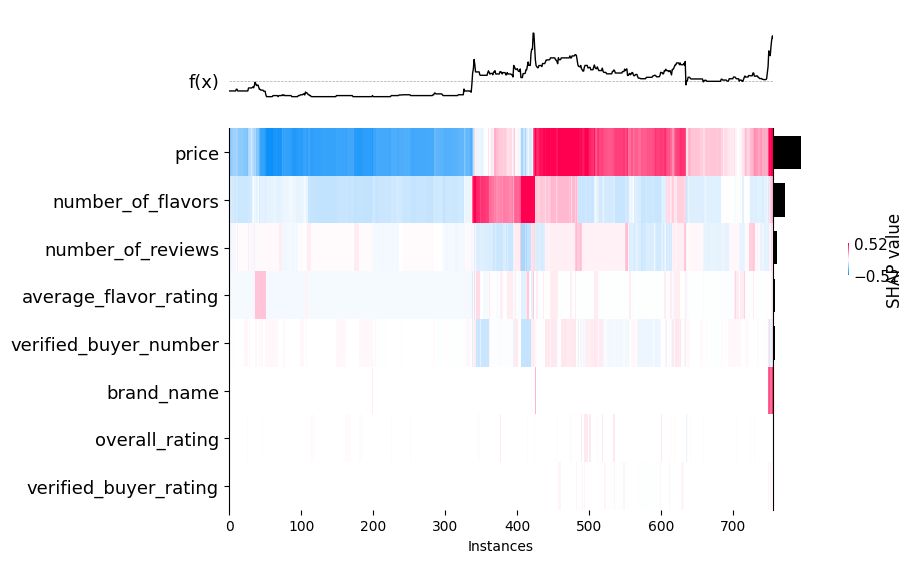

In [132]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

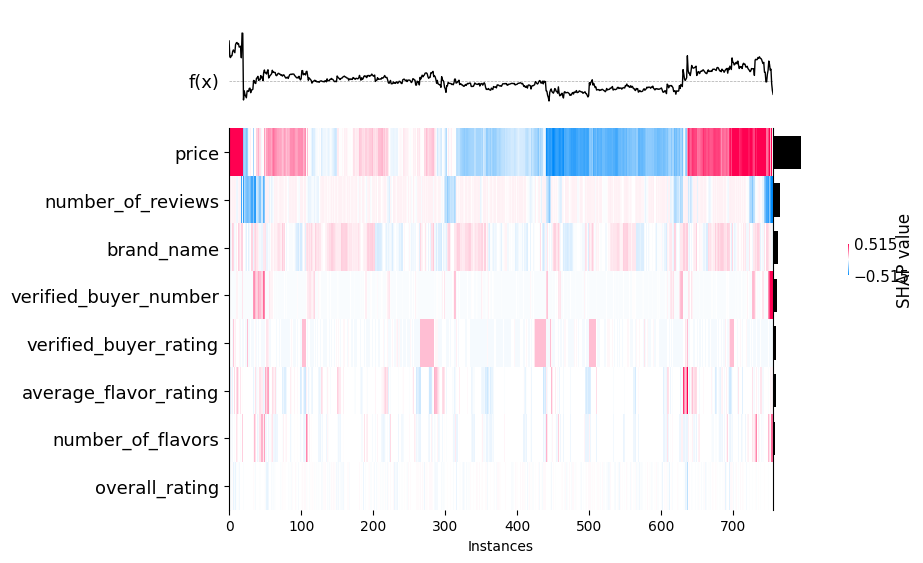

In [133]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

# LIME (Local Interpretation Model-Agnostic Explanation) Analysis

- LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model. LIME builds a local model in such a way that it can interpret the whole Black-Box

- LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models
- As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
- Here for this sample as seen below price, average_flavor_rating, verified_buyer_rating harmed both linear and tree-based model
- brand_name, verified_buyer_rating, overall_rating, had a positive effect on the price per serving in both models
- verified_buyer_number had a positive effect in the linear model but negative in tree-based model

These interpretations were carried out locally in the region where of out sample data(sample_index = 18).

## Linear Model

In [134]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [135]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.58830592]
Actual :      [1.12]


X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but LinearRegression was fitted with feature names


In this case, we know that the predicted value is 0.58830592 and the actual value is 0.53.

To assess the quality of the prediction, we would need to consider additional factors such as the range of the target variable, the distribution of the data, and the specific problem being solved. We would also need to evaluate the performance of the model on a larger set of data, using metrics such as mean squared error, R-squared, or accuracy, depending on the type of problem and the type of model used.

In [136]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

## Tree Based Model

In [137]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [138]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

X does not have valid feature names, but RandomForestRegressor was fitted with feature names
X does not have valid feature names, but RandomForestRegressor was fitted with feature names


Prediction :  [0.51602943]
Actual :      [1.12]


In [139]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook

#PDP(Partial Dependence Plot) for Linear model and Tree-based Model
1.   **Linear Model** - 
If we closely look at the PDP of the linear model we can see that if features price, verfified_buyer_number, Verified_buyer_rating are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(Price per serving)

2.   **Tree-Based Model** -
On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly


In [140]:
!pip install --upgrade scikit-learn

from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [141]:
x_test

,average_flavor_rating,brand_name,number_of_flavors,number_of_reviews,overall_rating,price,verified_buyer_number,verified_buyer_rating
695,8.66615,54,6.288714,4.000000,8.300000,8.60,1.0,9.0
816,8.66615,24,6.288714,3.000000,8.300000,19.99,1.0,8.0
30,8.66615,7,6.288714,3920.000000,9.200000,29.58,1.0,9.0
599,8.66615,57,6.288714,9.000000,9.800000,34.64,1.0,5.0
96,8.60000,4,18.000000,596.000000,9.100000,46.95,434.0,9.0
...,...,...,...,...,...,...,...,...
835,8.66615,88,6.288714,483.512789,8.950914,43.00,1.0,1.0
33,8.66615,15,6.288714,35.000000,9.400000,14.99,1.0,9.0
31,8.40000,62,43.000000,9926.000000,9.300000,47.99,3932.0,9.0
673,10.00000,67,2.000000,2.000000,10.000000,41.99,2.0,1.0


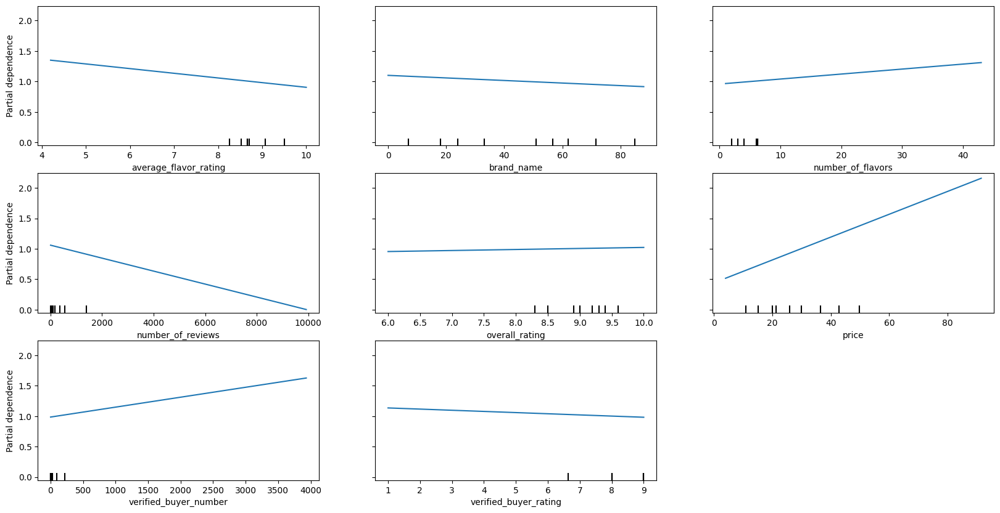

In [142]:
from sklearn.inspection import PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(linear_model, x_test, x_test.columns )

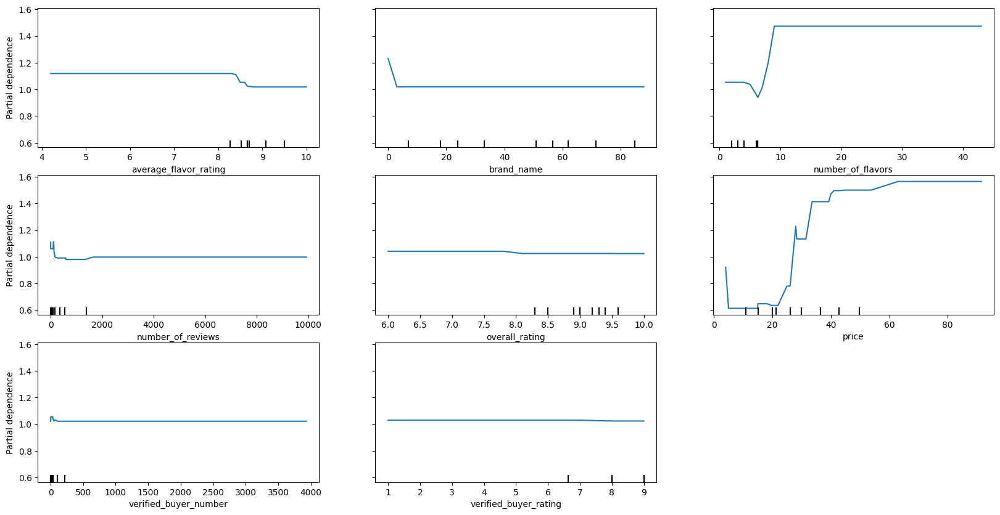

In [143]:
PartialDependenceDisplay.from_estimator(tree_model, x_test, x_test.columns )

#Comparision between SHAP, LIME, and Partial Dependence Plot Analysis

SHAP, LIME, and PDP are popular methods for interpreting machine learning models, each with its strengths and weaknesses. SHAP is model-agnostic and works well with complex models, providing both global and local interpretability. LIME is also model-agnostic and works well with black-box models, providing local interpretability, and is useful in areas such as healthcare, finance, and image recognition. PDPs are useful for understanding the relationship between the target and predictor variables and work well in areas such as economics. The choice of the best interpretable method for the ML model depends on the specific needs of the analysis and the trade-offs involved.


# **What did you do ?**

* Certainly! Based on my analysis of the Nutrition products dataset, I performed a range of modeling and analysis techniques. First, I split the data into train and test sets and used OLS regression to minimize the sum of squared errors between the predicted and actual values. I also used a confusion matrix to evaluate my classification model.

* To find the best model for the dataset, I used automated machine learning (AutoML) and fit both linear and tree-based models. To avoid overfitting, I implemented Ridge and Lasso regularization.

* To explain the model predictions, I used SHAP and LIME analysis and created a partial dependence plot to show the relationship between the target variable and input variables.

* Finally, I performed hyperparameter tuning to find the optimal values for the model and removed outliers and cleaned the data to improve the model's performance.

# **How well did it work ?**

* The dataset has been used for implementing several machine learning algorithms such as linear regression, random forest, support vector machine (SVM), and multi-layer perceptron (MLP) regressor. In addition to these algorithms, automated machine learning (AutoML) using h20 has also been performed, with the best model identified as xgBoost.

* To improve the performance of the machine learning algorithms, regularization techniques such as ridge and lasso have been applied, and hyperparameter tuning has been performed to optimize the model parameters. The SHAP visualization technique has also been used to identify the key factors contributing to the model predictions.

* To better understand the relationship between the nutrients present in the products and the price per serving, partial dependence plots have been generated. These plots show the dependence of the predicted price per serving on the values of the various nutrient variables, while holding all other variables constant.

* Overall, the dataset provides a rich source of information for studying the relationship between food product characteristics and their prices, and the various machine learning techniques applied to the dataset have provided valuable insights into this relationship.

# **What did you learn ?**

* The process of developing a machine learning model for PRICE PER SERVING PREDICTION OF supplement involved several stages, including data collection, preprocessing, and OLS regression. To improve the accuracy of the model, various techniques such as PCA, VIF, and regularization were used. The H20.ai framework was utilized to train and test the model, resulting in the "stackedensemble" model being selected as the best with an accuracy rate of 89.2%. However, the model still has some limitations in terms of prediction accuracy, and there is room for improvement.

* To interpret the model, three popular techniques were used: SHAP, LIME, and PDP Analysis. These techniques provide a global view of feature importance and explanation for individual predictions, identify the features that contributed the most to the prediction, and visualize the marginal effect of one or more features on the predicted outcome of a model. By using these techniques together, a better understanding of how the model works can be gained.

* The AutoML's best model with its Hyperparameter's tuned is the best model for this task as it has the highest accuracy compared to the other models tested in this excercise. Also, this model is interpretible i.e. we can actually get to the root of what made this prediction to come to.

# **Conclusion**

In summary, the analysis of the Nutrition products dataset involved a range of modeling and analysis techniques, including OLS regression, classification modeling using a confusion matrix, automated machine learning (AutoML), regularization techniques such as Ridge and Lasso, SHAP and LIME analysis for explaining model predictions, and partial dependence plots to visualize the relationship between the target variable and input variables. Hyperparameter tuning was also performed to optimize the model's performance, and data cleaning was conducted to remove outliers. Overall, these techniques provided valuable insights into the relationship between food product characteristics and their prices and helped to develop an accurate predictive model for the dataset.

#References

* https://openai.com/blog/chatgpt
* https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
* https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb
* https://scikit-learn.org/stable/modules/generated/sklearn.inspection.PartialDependenceDisplay.html
* https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb
*   https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Wine_Quality.ipynb
*   https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/6105_AutoML_The_World_Happiness_Data.ipynb
*  https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb  
*   https://www.youtube.com/watch?v=91QljBnvM7s&t=67s
